# Introduction

The task of this assignment is to apply feature selection and/or dimensionality reduction techniques to identify the explanatory variables to be included within a linear regression model that predicts the number of times an online news article will be shared. The data set is from the UC Irvine machine learning archive:

https://archive.ics.uci.edu/ml/datasets/Online+News+Popularity#

This dataset summarizes a heterogeneous set of features about articles published by Mashable in a period of two years. The goal is to predict a new indicator variable named "share_level" that create from the "shares". 

The new indicator variable has 3 levels. 

- A. “low”: indicates that the number of shares for a given articles is less than ½ of the median number of shares for all news articles;
- B. “medium”: indicates that the number of shares for a given articles is between 0.5 * the median number of shares for all news articles and 1.5 * the median number of shares for all news articles, i.e., (0.5 * median) < number of shares for the articles <= (1.5 * median)
- C. “high”: indicates that the number of shares for a given article exceeds 1.5 * the median number of shares for all news articles.


- 1. About Dataset
- 2. Data Summary
- 3. Exploratory Data Analysis
  - Using correlation table and heatmap to see correlations for "shares" versus other variables
  
- 4. Data Preparation
  - Create the new response variable
  - Convert data type
  - Drop outliers
  - Convert to normal distribution by Box-Cox
  - standardization
  - Re-run Exploratory Data Analysis
  - Split data set
  - Dummy categories
  

- 6. Feature selecting
  
  - Create a baseline
  - Using different methods to select features
    - Based EDA
    
    - filter
      - mutual_info_regression
      
    - Embedded
      - RandomForestClassifier

  - Compare each methods

- 7. Neural Network Models
  - 1 feed-forward
  - 2 back propagating models
  
- 8. Select model

- 9. Evaluate model

- 10. Conclusion

- 11. Reference

# 1. About Dataset

- Data Dictionary

Attribute Information:

**Total Number of Attributes: 61**

**New Response**: share_level created from shares

**Predictive Attributes: 58** share will removed after I create the new share_level

**Non-Predictive Attributes: 2** url and timedelta


Attribute's Name and their Description

0. url: URL of the article (non-predictive)
1. timedelta: Days between the article publication and the dataset acquisition (non-predictive)
2. n_tokens_title: Number of words in the title
3. n_tokens_content: Number of words in the content
4. n_unique_tokens: Rate of unique words in the content
5. n_non_stop_words: Rate of non-stop words in the content
6. n_non_stop_unique_tokens: Rate of unique non-stop words in the content
7. num_hrefs: Number of links
8. num_self_hrefs: Number of links to other articles published by Mashable
9. num_imgs: Number of images
10. num_videos: Number of videos
11. average_token_length: Average length of the words in the content
12. num_keywords: Number of keywords in the metadata
13. data_channel_is_lifestyle: Is data channel 'Lifestyle'?
14. data_channel_is_entertainment: Is data channel 'Entertainment'?
15. data_channel_is_bus: Is data channel 'Business'?
16. data_channel_is_socmed: Is data channel 'Social Media'?
17. data_channel_is_tech: Is data channel 'Tech'?
18. data_channel_is_world: Is data channel 'World'?
19. kw_min_min: Worst keyword (min. shares)
20. kw_max_min: Worst keyword (max. shares)
21. kw_avg_min: Worst keyword (avg. shares)
22. kw_min_max: Best keyword (min. shares)
23. kw_max_max: Best keyword (max. shares)
24. kw_avg_max: Best keyword (avg. shares)
25. kw_min_avg: Avg. keyword (min. shares)
26. kw_max_avg: Avg. keyword (max. shares)
27. kw_avg_avg: Avg. keyword (avg. shares)
28. self_reference_min_shares: Min. shares of referenced articles in Mashable
29. self_reference_max_shares: Max. shares of referenced articles in Mashable
30. self_reference_avg_sharess: Avg. shares of referenced articles in Mashable
31. weekday_is_monday: Was the article published on a Monday?
32. weekday_is_tuesday: Was the article published on a Tuesday?
33. weekday_is_wednesday: Was the article published on a Wednesday?
34. weekday_is_thursday: Was the article published on a Thursday?
35. weekday_is_friday: Was the article published on a Friday?
36. weekday_is_saturday: Was the article published on a Saturday?
37. weekday_is_sunday: Was the article published on a Sunday?
38. is_weekend: Was the article published on the weekend?
39. LDA_00: Closeness to LDA topic 0
40. LDA_01: Closeness to LDA topic 1
41. LDA_02: Closeness to LDA topic 2
42. LDA_03: Closeness to LDA topic 3
43. LDA_04: Closeness to LDA topic 4
44. global_subjectivity: Text subjectivity
45. global_sentiment_polarity: Text sentiment polarity
46. global_rate_positive_words: Rate of positive words in the content
47. global_rate_negative_words: Rate of negative words in the content
48. rate_positive_words: Rate of positive words among non-neutral tokens
49. rate_negative_words: Rate of negative words among non-neutral tokens
50. avg_positive_polarity: Avg. polarity of positive words
51. min_positive_polarity: Min. polarity of positive words
52. max_positive_polarity: Max. polarity of positive words
53. avg_negative_polarity: Avg. polarity of negative words
54. min_negative_polarity: Min. polarity of negative words
55. max_negative_polarity: Max. polarity of negative words
56. title_subjectivity: Title subjectivity
57. title_sentiment_polarity: Title polarity
58. abs_title_subjectivity: Absolute subjectivity level
59. abs_title_sentiment_polarity: Absolute polarity level
60. shares: Number of shares (original target. It will removed)
61. share_level: the new target

In [1]:
# Import pandas
import pandas as pd

# Import numpy
import numpy as np

# Import Seirs and DataFrame
from pandas import Series, DataFrame

# load the pyplot function from the matplotlib library
import matplotlib.pyplot as plt

# Import seaborn 
import seaborn as sns

from sklearn.model_selection import (
    train_test_split,
    KFold
)

from sklearn import (
    ensemble,
    impute,
    model_selection,    
    preprocessing,
    tree,
)


pd.set_option('display.max_columns', None)
pd.set_option('mode.chained_assignment', None)

%matplotlib inline 
%config InlineBackend.figure_format = 'retina'
plt.style.use('seaborn')

In [2]:
# Read the data from GitHub and create a data frame
df = pd.read_csv('https://raw.githubusercontent.com/Yuehao-Wang/DAV-6150/main/data/M4_Data.csv')

# Use head function to make sure the data loaded properly
df.head()

,url,timedelta,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,average_token_length,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_bus,data_channel_is_socmed,data_channel_is_tech,data_channel_is_world,kw_min_min,kw_max_min,kw_avg_min,kw_min_max,kw_max_max,kw_avg_max,kw_min_avg,kw_max_avg,kw_avg_avg,self_reference_min_shares,self_reference_max_shares,self_reference_avg_sharess,weekday_is_monday,weekday_is_tuesday,weekday_is_wednesday,weekday_is_thursday,weekday_is_friday,weekday_is_saturday,weekday_is_sunday,is_weekend,LDA_00,LDA_01,LDA_02,LDA_03,LDA_04,global_subjectivity,global_sentiment_polarity,global_rate_positive_words,global_rate_negative_words,rate_positive_words,rate_negative_words,avg_positive_polarity,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares
0,http://mashable.com/2013/01/07/amazon-instant-...,731.0,12.0,219.0,0.663594,1.0,0.815385,4.0,2.0,1.0,0.0,4.680365,5.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,496.0,496.0,496.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.500331,0.378279,0.040005,0.041263,0.040123,0.521617,0.092562,0.045662,0.013699,0.769231,0.230769,0.378636,0.100000,0.7,-0.350000,-0.600,-0.200000,0.500000,-0.187500,0.000000,0.187500,593
1,http://mashable.com/2013/01/07/ap-samsung-spon...,731.0,9.0,255.0,0.604743,1.0,0.791946,3.0,1.0,1.0,0.0,4.913725,4.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.799756,0.050047,0.050096,0.050101,0.050001,0.341246,0.148948,0.043137,0.015686,0.733333,0.266667,0.286915,0.033333,0.7,-0.118750,-0.125,-0.100000,0.000000,0.000000,0.500000,0.000000,711
2,http://mashable.com/2013/01/07/apple-40-billio...,731.0,9.0,211.0,0.575130,1.0,0.663866,3.0,1.0,1.0,0.0,4.393365,6.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,918.0,918.0,918.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.217792,0.033334,0.033351,0.033334,0.682188,0.702222,0.323333,0.056872,0.009479,0.857143,0.142857,0.495833,0.100000,1.0,-0.466667,-0.800,-0.133333,0.000000,0.000000,0.500000,0.000000,1500
3,http://mashable.com/2013/01/07/astronaut-notre...,731.0,9.0,531.0,0.503788,1.0,0.665635,9.0,0.0,1.0,0.0,4.404896,7.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.028573,0.419300,0.494651,0.028905,0.028572,0.429850,0.100705,0.041431,0.020716,0.666667,0.333333,0.385965,0.136364,0.8,-0.369697,-0.600,-0.166667,0.000000,0.000000,0.500000,0.000000,1200
4,http://mashable.com/2013/01/07/att-u-verse-apps/,731.0,13.0,1072.0,0.415646,1.0,0.540890,19.0,19.0,20.0,0.0,4.682836,7.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,545.0,16000.0,3151.157895,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.028633,0.028794,0.028575,0.028572,0.885427,0.513502,0.281003,0.074627,0.012127,0.860215,0.139785,0.411127,0.033333,1.0,-0.220192,-0.500,-0.050000,0.454545,0.136364,0.045455,0.136364,505


# 2. Data Summary

#### To display the number of rows and columns in the dataset

In [3]:
df.shape 

(39644, 61)

In [4]:
# Show the columns
df.columns

Index(['url', ' timedelta', ' n_tokens_title', ' n_tokens_content',
       ' n_unique_tokens', ' n_non_stop_words', ' n_non_stop_unique_tokens',
       ' num_hrefs', ' num_self_hrefs', ' num_imgs', ' num_videos',
       ' average_token_length', ' num_keywords', ' data_channel_is_lifestyle',
       ' data_channel_is_entertainment', ' data_channel_is_bus',
       ' data_channel_is_socmed', ' data_channel_is_tech',
       ' data_channel_is_world', ' kw_min_min', ' kw_max_min', ' kw_avg_min',
       ' kw_min_max', ' kw_max_max', ' kw_avg_max', ' kw_min_avg',
       ' kw_max_avg', ' kw_avg_avg', ' self_reference_min_shares',
       ' self_reference_max_shares', ' self_reference_avg_sharess',
       ' weekday_is_monday', ' weekday_is_tuesday', ' weekday_is_wednesday',
       ' weekday_is_thursday', ' weekday_is_friday', ' weekday_is_saturday',
       ' weekday_is_sunday', ' is_weekend', ' LDA_00', ' LDA_01', ' LDA_02',
       ' LDA_03', ' LDA_04', ' global_subjectivity',
       ' global_sent

In [5]:
# Remove the blank mark before column names
df.columns = df.columns.str.strip()

In [6]:
df.columns

Index(['url', 'timedelta', 'n_tokens_title', 'n_tokens_content',
       'n_unique_tokens', 'n_non_stop_words', 'n_non_stop_unique_tokens',
       'num_hrefs', 'num_self_hrefs', 'num_imgs', 'num_videos',
       'average_token_length', 'num_keywords', 'data_channel_is_lifestyle',
       'data_channel_is_entertainment', 'data_channel_is_bus',
       'data_channel_is_socmed', 'data_channel_is_tech',
       'data_channel_is_world', 'kw_min_min', 'kw_max_min', 'kw_avg_min',
       'kw_min_max', 'kw_max_max', 'kw_avg_max', 'kw_min_avg', 'kw_max_avg',
       'kw_avg_avg', 'self_reference_min_shares', 'self_reference_max_shares',
       'self_reference_avg_sharess', 'weekday_is_monday', 'weekday_is_tuesday',
       'weekday_is_wednesday', 'weekday_is_thursday', 'weekday_is_friday',
       'weekday_is_saturday', 'weekday_is_sunday', 'is_weekend', 'LDA_00',
       'LDA_01', 'LDA_02', 'LDA_03', 'LDA_04', 'global_subjectivity',
       'global_sentiment_polarity', 'global_rate_positive_words',
     

**The dataset contains 39644 rows and 61 columns**

#### Data Type of Each Variable

In [7]:
# To check the data type of each variable
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39644 entries, 0 to 39643
Data columns (total 61 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   url                            39644 non-null  object 
 1   timedelta                      39644 non-null  float64
 2   n_tokens_title                 39644 non-null  float64
 3   n_tokens_content               39644 non-null  float64
 4   n_unique_tokens                39644 non-null  float64
 5   n_non_stop_words               39644 non-null  float64
 6   n_non_stop_unique_tokens       39644 non-null  float64
 7   num_hrefs                      39644 non-null  float64
 8   num_self_hrefs                 39644 non-null  float64
 9   num_imgs                       39644 non-null  float64
 10  num_videos                     39644 non-null  float64
 11  average_token_length           39644 non-null  float64
 12  num_keywords                   39644 non-null 

The data type of all the attributes are numaric except URL. All variables do not have missing values.

Next, I will drop the URL and timedelta, because URL is an unique identification and is non-predictive. 

In [8]:
# Drop url
df = df.drop(columns=['url', 'timedelta'])

# 3. Exploratory Data Analysis
Now, We will perform exploratory data analysis to understand the nature of each of the variable

In [9]:
numeric_cols = ['n_tokens_title', 'n_tokens_content',
       'n_unique_tokens', 'n_non_stop_words', 'n_non_stop_unique_tokens',
       'num_hrefs', 'num_self_hrefs', 'num_imgs', 'num_videos',
       'average_token_length', 'num_keywords', 'data_channel_is_lifestyle',
       'data_channel_is_entertainment', 'data_channel_is_bus',
       'data_channel_is_socmed', 'data_channel_is_tech',
       'data_channel_is_world', 'kw_min_min', 'kw_max_min', 'kw_avg_min',
       'kw_min_max', 'kw_max_max', 'kw_avg_max', 'kw_min_avg', 'kw_max_avg',
       'kw_avg_avg', 'self_reference_min_shares', 'self_reference_max_shares',
       'self_reference_avg_sharess', 'weekday_is_monday', 'weekday_is_tuesday',
       'weekday_is_wednesday', 'weekday_is_thursday', 'weekday_is_friday',
       'weekday_is_saturday', 'weekday_is_sunday', 'is_weekend', 'LDA_00',
       'LDA_01', 'LDA_02', 'LDA_03', 'LDA_04', 'global_subjectivity',
       'global_sentiment_polarity', 'global_rate_positive_words',
       'global_rate_negative_words', 'rate_positive_words',
       'rate_negative_words', 'avg_positive_polarity', 'min_positive_polarity',
       'max_positive_polarity', 'avg_negative_polarity',
       'min_negative_polarity', 'max_negative_polarity', 'title_subjectivity',
       'title_sentiment_polarity', 'abs_title_subjectivity',
       'abs_title_sentiment_polarity']

#### Summary Statistics

In [10]:
# Employ describe function to exhibits the summary statistics of each column
df.describe()

,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,average_token_length,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_bus,data_channel_is_socmed,data_channel_is_tech,data_channel_is_world,kw_min_min,kw_max_min,kw_avg_min,kw_min_max,kw_max_max,kw_avg_max,kw_min_avg,kw_max_avg,kw_avg_avg,self_reference_min_shares,self_reference_max_shares,self_reference_avg_sharess,weekday_is_monday,weekday_is_tuesday,weekday_is_wednesday,weekday_is_thursday,weekday_is_friday,weekday_is_saturday,weekday_is_sunday,is_weekend,LDA_00,LDA_01,LDA_02,LDA_03,LDA_04,global_subjectivity,global_sentiment_polarity,global_rate_positive_words,global_rate_negative_words,rate_positive_words,rate_negative_words,avg_positive_polarity,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares
count,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000
mean,10.398749,546.514731,0.548216,0.996469,0.689175,10.883690,3.293638,4.544143,1.249874,4.548239,7.223767,0.052946,0.178009,0.157855,0.058597,0.185299,0.212567,26.106801,1153.951682,312.366967,13612.354102,752324.066694,259281.938083,1117.146610,5657.211151,3135.858639,3998.755396,10329.212662,6401.697580,0.168020,0.186409,0.187544,0.183306,0.143805,0.061876,0.069039,0.130915,0.184599,0.141256,0.216321,0.223770,0.234029,0.443370,0.119309,0.039625,0.016612,0.682150,0.287934,0.353825,0.095446,0.756728,-0.259524,-0.521944,-0.107500,0.282353,0.071425,0.341843,0.156064,3395.380184
std,2.114037,471.107508,3.520708,5.231231,3.264816,11.332017,3.855141,8.309434,4.107855,0.844406,1.909130,0.223929,0.382525,0.364610,0.234871,0.388545,0.409129,69.633215,3857.990877,620.783887,57986.029357,214502.129573,135102.247285,1137.456951,6098.871957,1318.150397,19738.670516,41027.576613,24211.332231,0.373889,0.389441,0.390353,0.386922,0.350896,0.240933,0.253524,0.337312,0.262975,0.219707,0.282145,0.295191,0.289183,0.116685,0.096931,0.017429,0.010828,0.190206,0.156156,0.104542,0.071315,0.247786,0.127726,0.290290,0.095373,0.324247,0.265450,0.188791,0.226294,11626.950749
min,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,0.000000,-1.000000,0.000000,0.000000,0.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.393750,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.000000,-1.000000,0.000000,0.000000,1.000000
25%,9.000000,246.000000,0.470870,1.000000,0.625739,4.000000,1.000000,1.000000,0.000000,4.478404,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,445.000000,141.750000,0.000000,843300.000000,172846.875000,0.000000,3562.101631,2382.448566,639.000000,1100.000000,981.187500,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.025051,0.025012,0.028571,0.028571,0.028574,0.396167,0.057757,0.028384,0.009615,0.600000,0.185185,0.306

#### Using correlation table and heatmap to see correlations for "shares" versus other variables.

In [11]:
corr_matrix = df[['shares'] + numeric_cols].corr()
corr_matrix['shares'].sort_values(ascending = False)

shares                           1.000000
kw_avg_avg                       0.110413
LDA_03                           0.083771
kw_max_avg                       0.064306
self_reference_avg_sharess       0.057789
self_reference_min_shares        0.055958
self_reference_max_shares        0.047115
num_hrefs                        0.045404
kw_avg_max                       0.044686
kw_min_avg                       0.039551
num_imgs                         0.039388
global_subjectivity              0.031604
kw_avg_min                       0.030406
kw_max_min                       0.030114
abs_title_sentiment_polarity     0.027135
num_videos                       0.023936
title_subjectivity               0.021967
num_keywords                     0.021818
is_weekend                       0.016958
weekday_is_saturday              0.015082
title_sentiment_polarity         0.012772
avg_positive_polarity            0.012142
max_positive_polarity            0.010068
weekday_is_monday                0

There are not any pair that has correlation value greater than 0.5.

I think variables with a correlation greater than 0.3 can be used to predict the shares. 

They are kw_avg_avg, LDA_03, kw_max_avg, self_reference_avg_sharess, self_reference_min_shares, self_reference_max_shares, num_hrefs,kw_avg_max, kw_min_avg,num_imgs

#### Distribution Charts for each Column

In [12]:
def hist_box(data_df, col):

    fig,axes = plt.subplots(ncols=2, nrows=1)
    fig.set_size_inches(16, 6)
    axes[0].set_title("Histogram of " + col)
    sns.histplot(data_df[col], bins = 50, ax=axes[0])
    
    axes[1].set_title("Boxplot of " + col)
    sns.boxplot(y=data_df[col], orient="v",ax=axes[1])


In [13]:
def show_statistic(data_df, col):
    
    mean = data_df[col].mean()
    var = data_df[col].var()
    std = data_df[col].std()
    q1 = data_df[col].quantile(.25)
    q2 = data_df[col].quantile(.50)
    q3 = data_df[col].quantile(.75)
    d_min= data_df[col].min()
    d_max = data_df[col].max()
    sigema = 3.0
    
    del_outliers = data_df[np.abs(data_df[col] - mean ) > (sigema * std )]
    
    
    print("%s : mean = %.4f, var = %.4f, std = %.4f, q1(25%%) = %.4f, q3(75%%) = %.4f, min = %.4f, max = %.4f" 
          %(col, mean, var, std, q1, q3, d_min, d_max))
    
    if del_outliers.shape[0] > 0:
        out_num = del_outliers.shape[0]
        out_pct = (out_num / data_df[col].shape[0]) * 100
        print("It has %d ourliers that larger than (mean + 3*std), account for %.4f %%" %(out_num, out_pct))
    

shares (original target). The new share_level created from shares

shares : mean = 3395.3802, var = 135185983.7116, std = 11626.9507, q1(25%) = 946.0000, q3(75%) = 2800.0000, min = 1.0000, max = 843300.0000
It has 308 ourliers that larger than (mean + 3*std), account for 0.7769 %


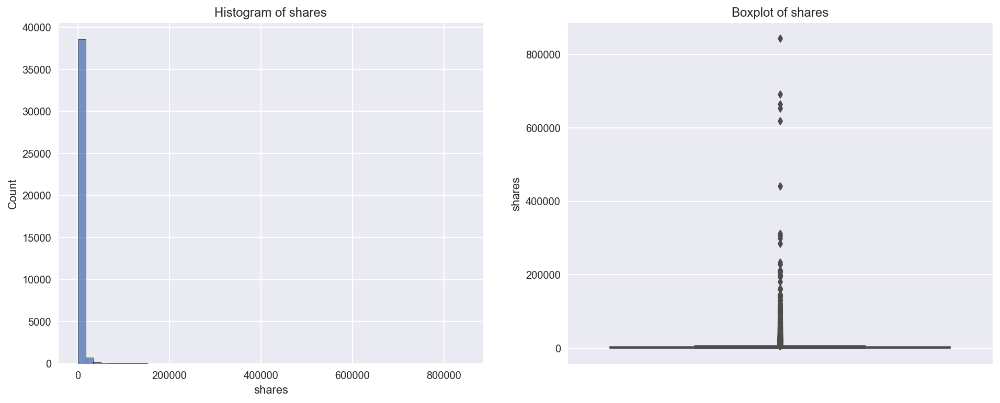

In [14]:
# 60. Number of shares (original target)
hist_box(df, 'shares')
show_statistic(df, 'shares')

The shares shows right skewed distribution. Outliers account for 0.7769 %. It has a large variance.

In [15]:
# 1. timedelta : Days between the article publication and the dataset acquisition (non-predictive)
#hist_box(df, 'timedelta')
#show_statistic(df, 'timedelta')

The timedelta shows Non-symmetric bimodal distribution. It has no outliers.

n_tokens_title : mean = 10.3987, var = 4.4692, std = 2.1140, q1(25%) = 9.0000, q3(75%) = 12.0000, min = 2.0000, max = 23.0000
It has 156 ourliers that larger than (mean + 3*std), account for 0.3935 %


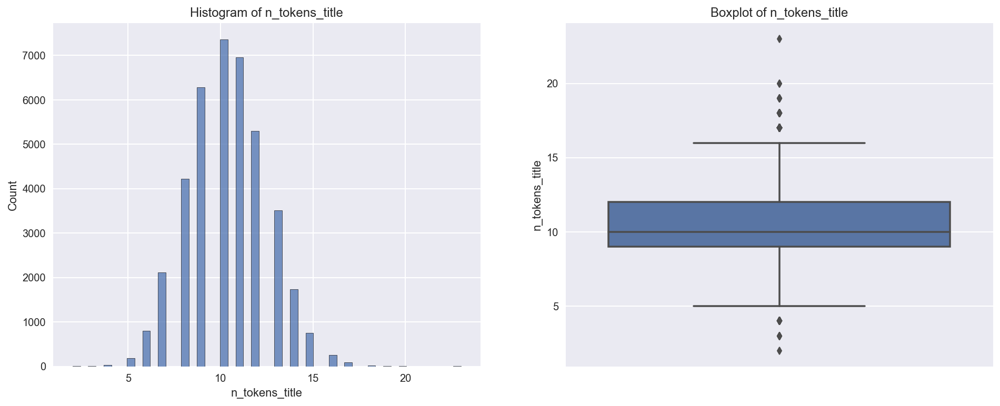

In [16]:
# 2. n_tokens_title: Number of words in the title
hist_box(df, 'n_tokens_title')
show_statistic(df, 'n_tokens_title')

The n_tokens_title shows normal distribution. I has 0.3935 % outliers on both sides.

n_tokens_content : mean = 546.5147, var = 221942.2840, std = 471.1075, q1(25%) = 246.0000, q3(75%) = 716.0000, min = 0.0000, max = 8474.0000
It has 693 ourliers that larger than (mean + 3*std), account for 1.7481 %


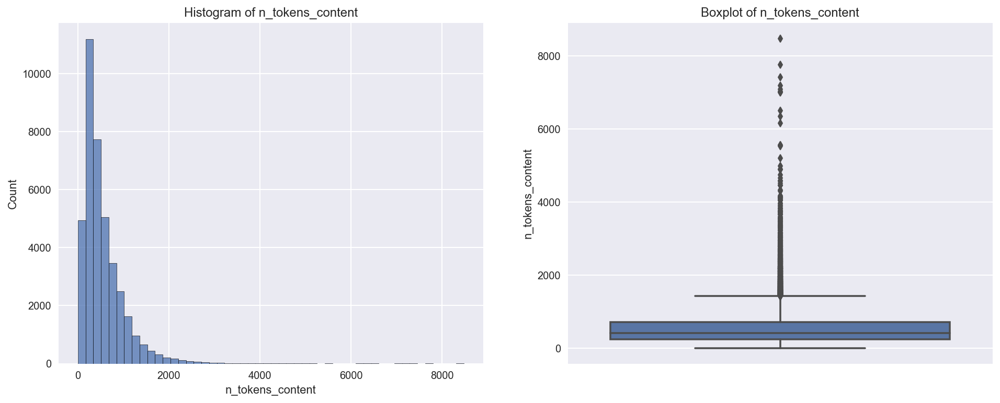

In [17]:
# 3. n_tokens_content: Number of words in the content
hist_box(df, 'n_tokens_content')
show_statistic(df, 'n_tokens_content')

The n_tokens_content shows right skewed distribution. It has 1.7481 % outliers and has a large variance.

n_unique_tokens : mean = 0.5482, var = 12.3954, std = 3.5207, q1(25%) = 0.4709, q3(75%) = 0.6087, min = 0.0000, max = 701.0000
It has 1 ourliers that larger than (mean + 3*std), account for 0.0025 %


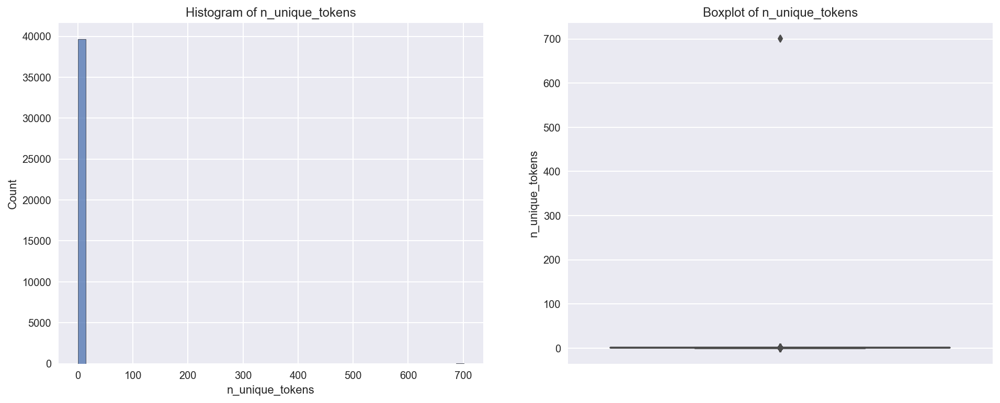

In [18]:
# 4. n_unique_tokens: Rate of unique words in the content
hist_box(df, 'n_unique_tokens')
show_statistic(df, 'n_unique_tokens')

It is rate. The max is 701. I think the max is a error record.

n_non_stop_words : mean = 0.9965, var = 27.3658, std = 5.2312, q1(25%) = 1.0000, q3(75%) = 1.0000, min = 0.0000, max = 1042.0000
It has 1 ourliers that larger than (mean + 3*std), account for 0.0025 %


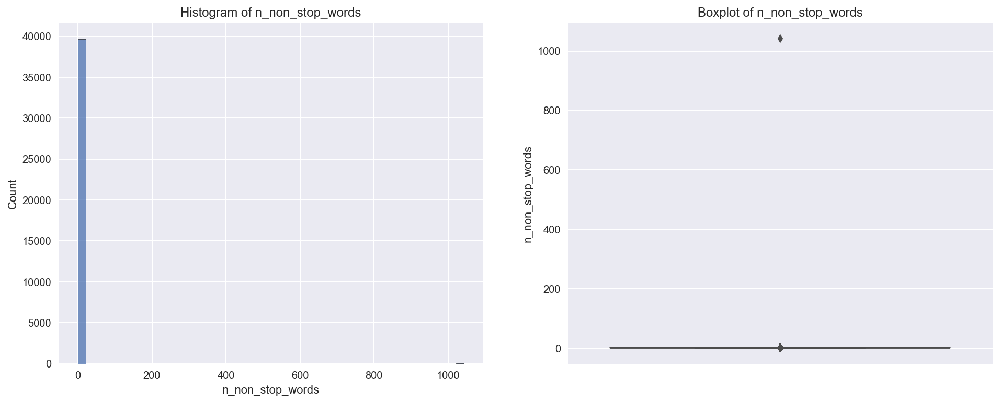

In [19]:
# 5. n_non_stop_words: Rate of non-stop words in the content
hist_box(df, 'n_non_stop_words')
show_statistic(df, 'n_non_stop_words')

It is rate. The max is 1042. I think the max is a error record.

n_non_stop_unique_tokens : mean = 0.6892, var = 10.6590, std = 3.2648, q1(25%) = 0.6257, q3(75%) = 0.7546, min = 0.0000, max = 650.0000
It has 1 ourliers that larger than (mean + 3*std), account for 0.0025 %


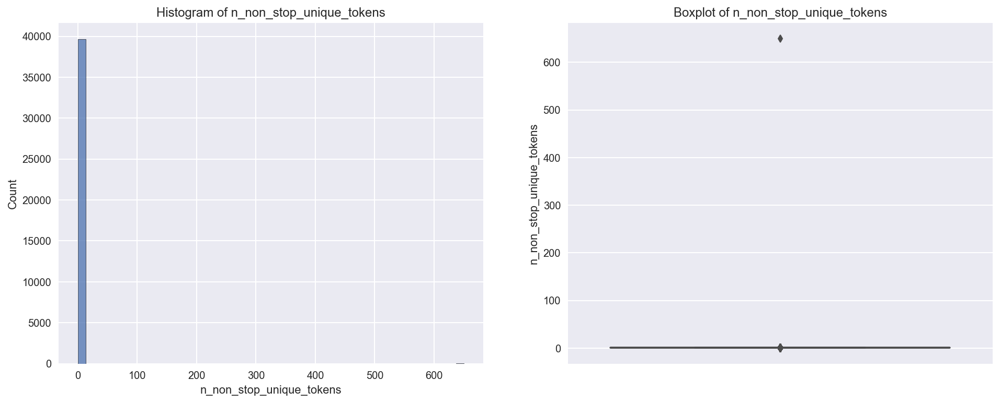

In [20]:
# 6. n_non_stop_unique_tokens: Rate of unique non-stop words in the content
hist_box(df, 'n_non_stop_unique_tokens')
show_statistic(df, 'n_non_stop_unique_tokens')

It is rate. The max is 650. I think the max is a error record.

num_hrefs : mean = 10.8837, var = 128.4146, std = 11.3320, q1(25%) = 4.0000, q3(75%) = 14.0000, min = 0.0000, max = 304.0000
It has 731 ourliers that larger than (mean + 3*std), account for 1.8439 %


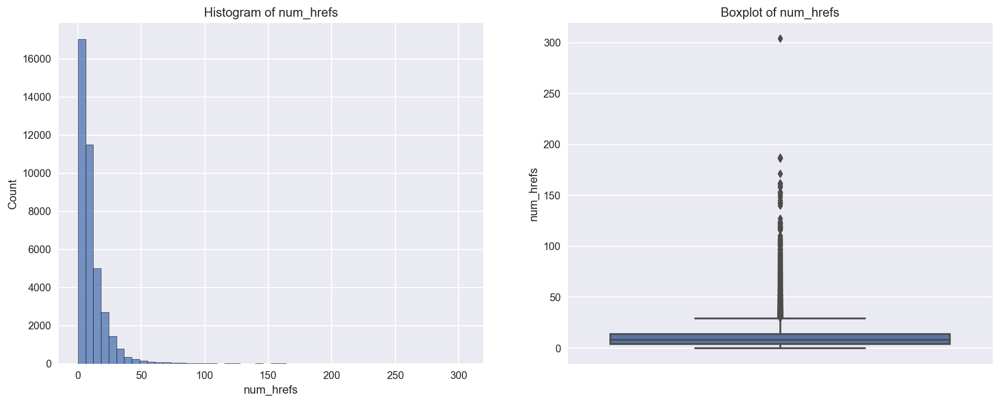

In [21]:
# 7. num_hrefs: Number of links
hist_box(df, 'num_hrefs')
show_statistic(df, 'num_hrefs')

The num_hrefs shows the right-skewed distribution and it has 1.8439 % outliers. There is an outlier with max value, we should pay attention to it.

num_self_hrefs : mean = 3.2936, var = 14.8621, std = 3.8551, q1(25%) = 1.0000, q3(75%) = 4.0000, min = 0.0000, max = 116.0000
It has 699 ourliers that larger than (mean + 3*std), account for 1.7632 %


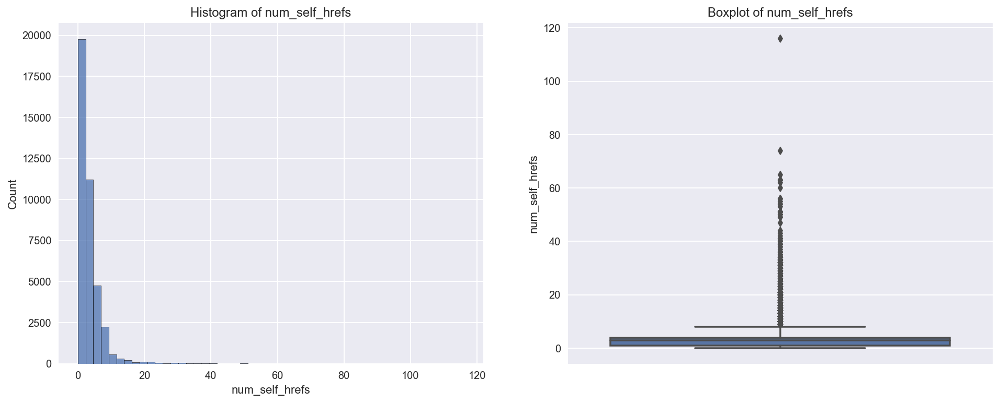

In [22]:
# 8. num_self_hrefs: Number of links to other articles published by Mashable
hist_box(df, 'num_self_hrefs')
show_statistic(df, 'num_self_hrefs')

The num_self_hrefs  shows the right-skewed distribution and it has 1.7632 % outliers. There is an outlier with max value, we should pay attention to it.

num_imgs : mean = 4.5441, var = 69.0467, std = 8.3094, q1(25%) = 1.0000, q3(75%) = 4.0000, min = 0.0000, max = 128.0000
It has 863 ourliers that larger than (mean + 3*std), account for 2.1769 %


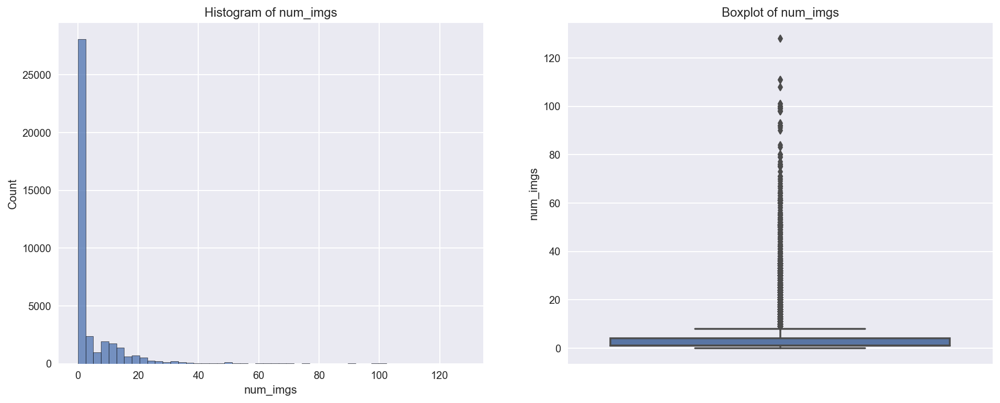

In [23]:
# 9. num_imgs: Number of images
hist_box(df, 'num_imgs')
show_statistic(df, 'num_imgs')

The num_imgs shows the right-skewed distribution and it has 2.1769 % outliers.

num_videos : mean = 1.2499, var = 16.8745, std = 4.1079, q1(25%) = 0.0000, q3(75%) = 1.0000, min = 0.0000, max = 91.0000
It has 986 ourliers that larger than (mean + 3*std), account for 2.4871 %


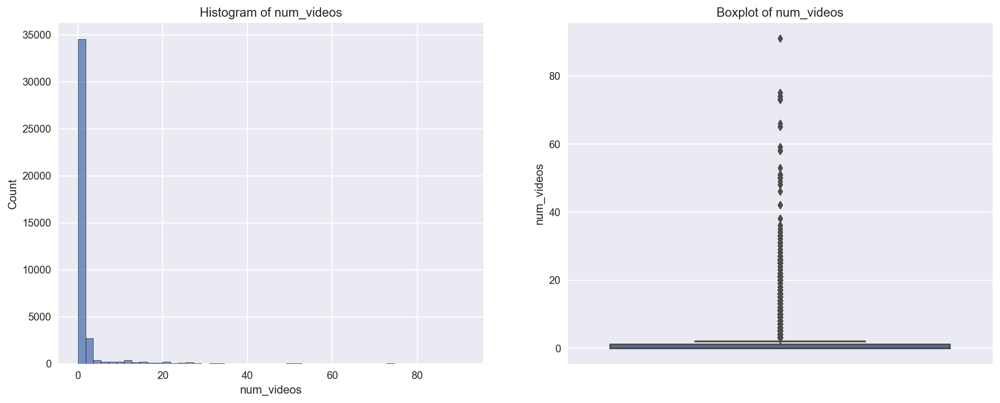

In [24]:
# 10. num_videos: Number of videos
hist_box(df, 'num_videos')
show_statistic(df, 'num_videos')

The num_videos shows the right-skewed distribution and it has 2.4871 % outliers.

average_token_length : mean = 4.5482, var = 0.7130, std = 0.8444, q1(25%) = 4.4784, q3(75%) = 4.8548, min = 0.0000, max = 8.0415
It has 1185 ourliers that larger than (mean + 3*std), account for 2.9891 %


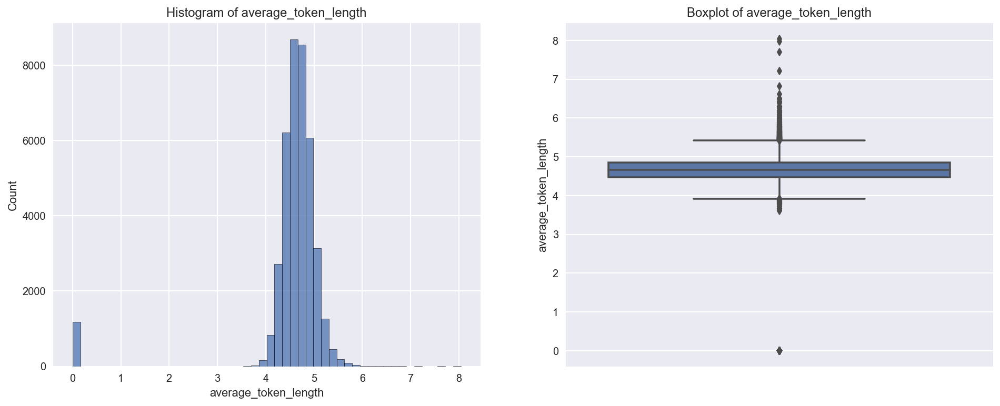

In [25]:
# 11. average_token_length: Average length of the words in the content
hist_box(df, 'average_token_length')
show_statistic(df, 'average_token_length')

The average_token_length shows the normal distribution except near 0. It has 2.9891 % outliers. There are some outliers near 0, we should pay attention to them.

num_keywords : mean = 7.2238, var = 3.6448, std = 1.9091, q1(25%) = 6.0000, q3(75%) = 9.0000, min = 1.0000, max = 10.0000
It has 51 ourliers that larger than (mean + 3*std), account for 0.1286 %


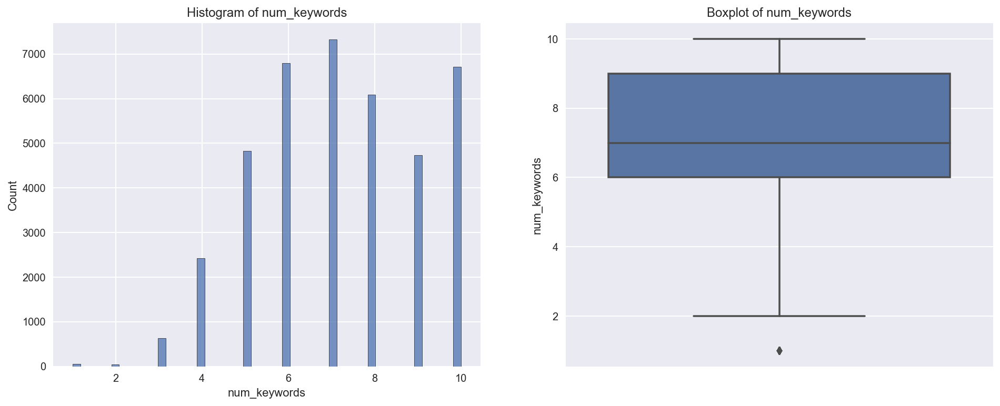

In [26]:
# 12. num_keywords: Number of keywords in the metadata
hist_box(df, 'num_keywords')
show_statistic(df, 'num_keywords')

The num_keywords shows observations are distributed from 0 to 10. It has 0.1286 % outliers.

<AxesSubplot:>

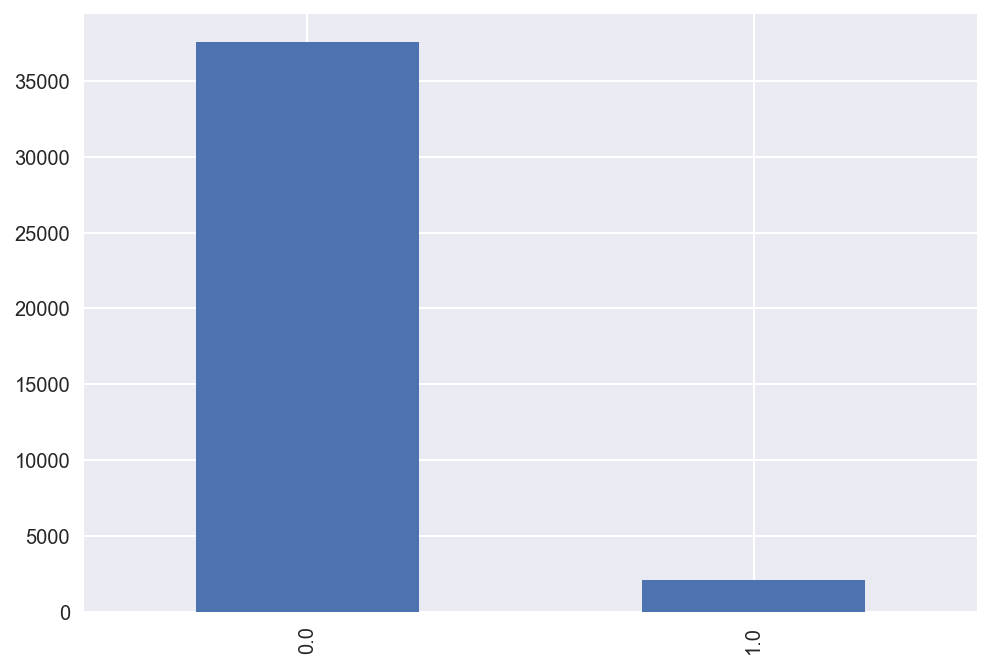

In [27]:
# 13. data_channel_is_lifestyle: Is data channel 'Lifestyle'?
df['data_channel_is_lifestyle'].value_counts().plot.bar()

The data_channel_is_lifestyle can change to binary category.

<AxesSubplot:>

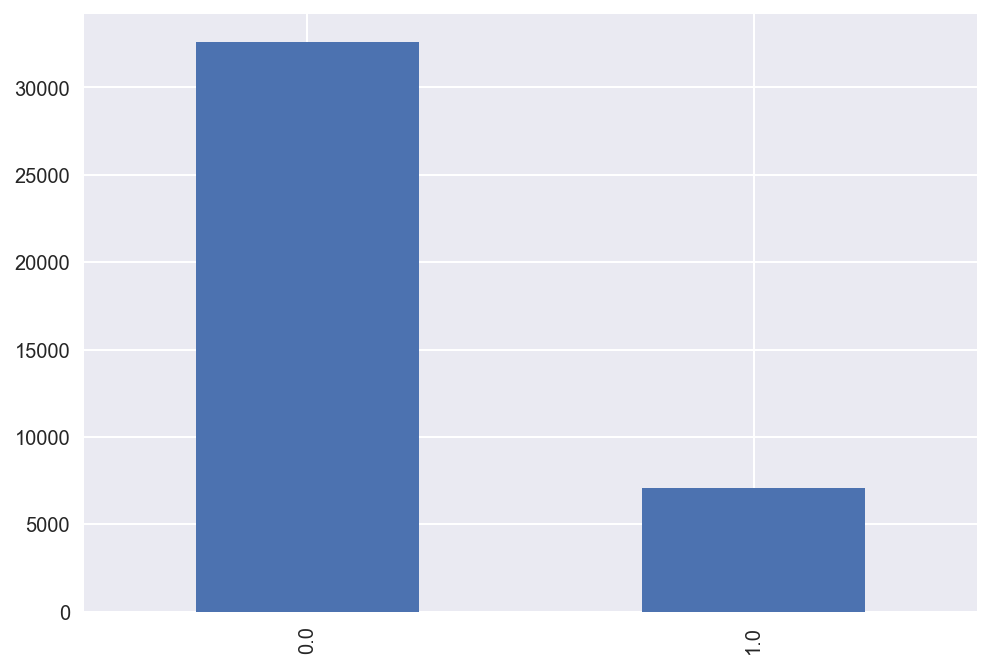

In [28]:
# 14. data_channel_is_entertainment: Is data channel 'Entertainment'?
df['data_channel_is_entertainment'].value_counts().plot.bar()

The data_channel_is_entertainment can change to binary category.

<AxesSubplot:>

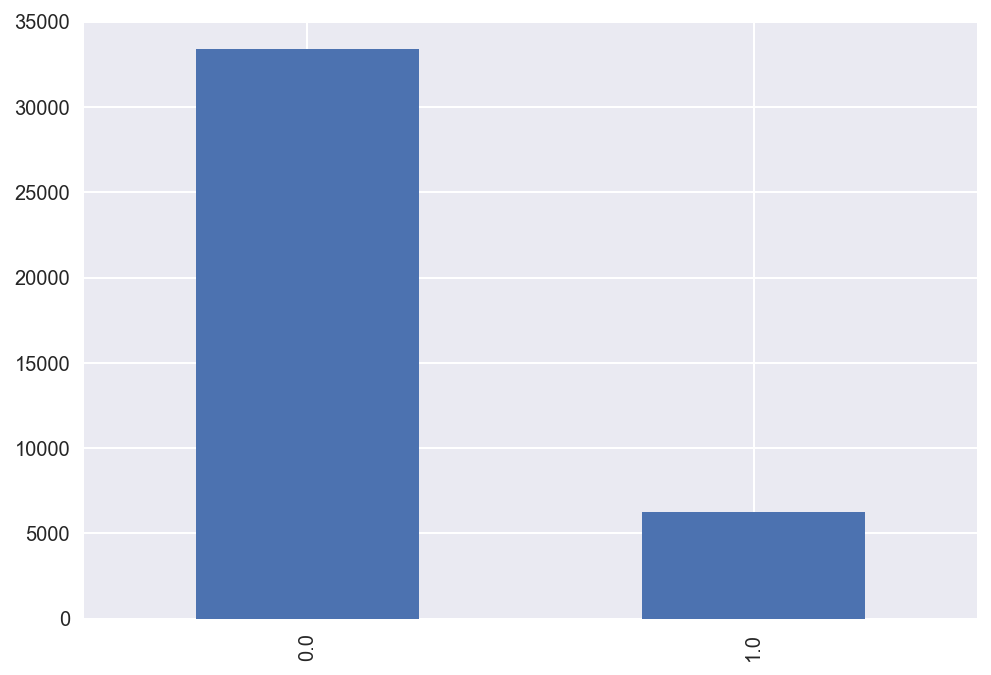

In [29]:
# 15. data_channel_is_bus: Is data channel 'Business'?
df['data_channel_is_bus'].value_counts().plot.bar()

The data_channel_is_bus can change to binary category.

<AxesSubplot:>

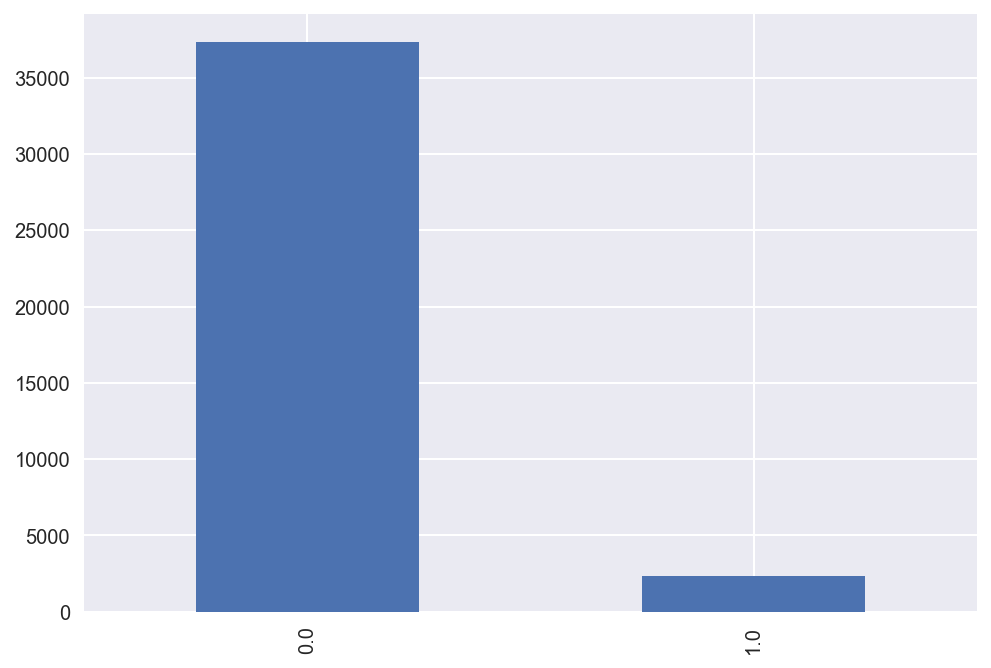

In [30]:
# 16. data_channel_is_socmed: Is data channel 'Social Media'?
df['data_channel_is_socmed'].value_counts().plot.bar()

The data_channel_is_socmed can change to binary category.

<AxesSubplot:>

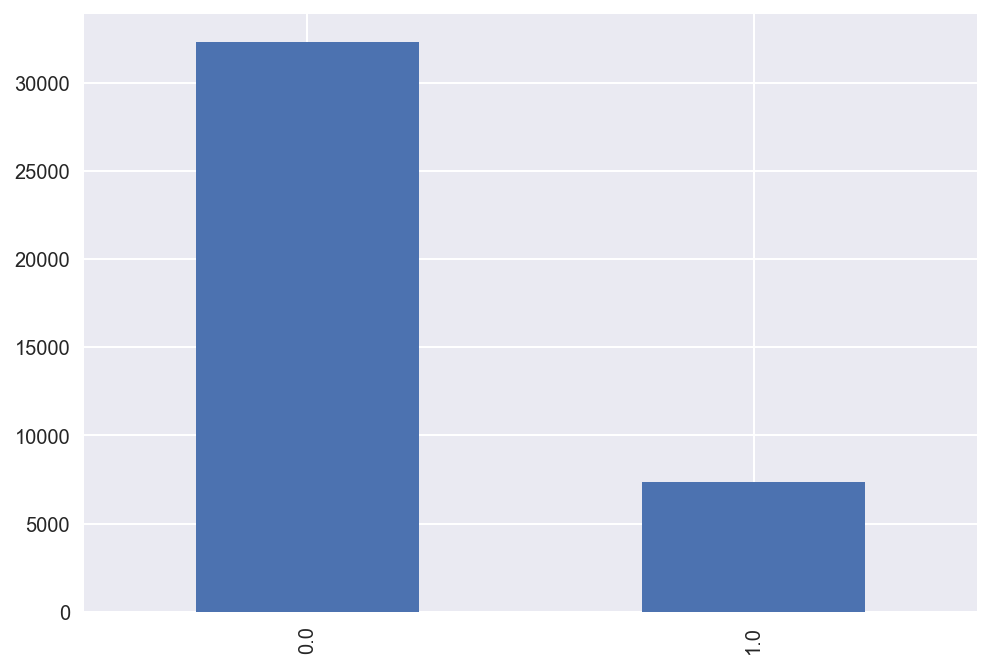

In [31]:
# 17. data_channel_is_tech: Is data channel 'Tech'?
df['data_channel_is_tech'].value_counts().plot.bar()

The data_channel_is_tech can change to binary category.

<AxesSubplot:>

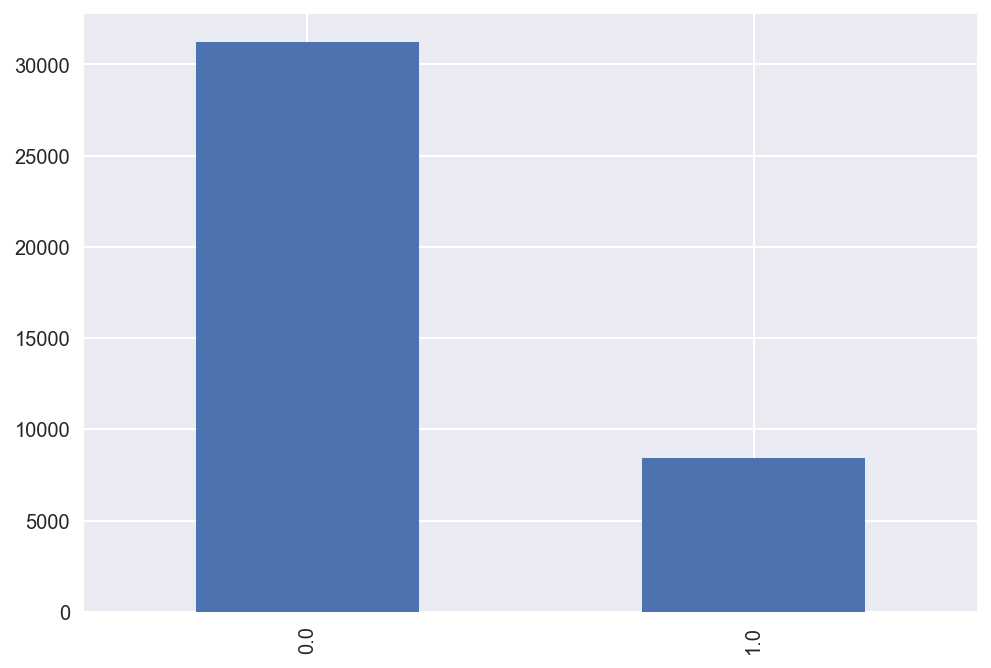

In [32]:
# 18. data_channel_is_world: Is data channel 'World'?
df['data_channel_is_world'].value_counts().plot.bar()

The data_channel_is_world can change to binary category.

kw_min_min : mean = 26.1068, var = 4848.7846, std = 69.6332, q1(25%) = -1.0000, q3(75%) = 4.0000, min = -1.0000, max = 377.0000
It has 4 ourliers that larger than (mean + 3*std), account for 0.0101 %


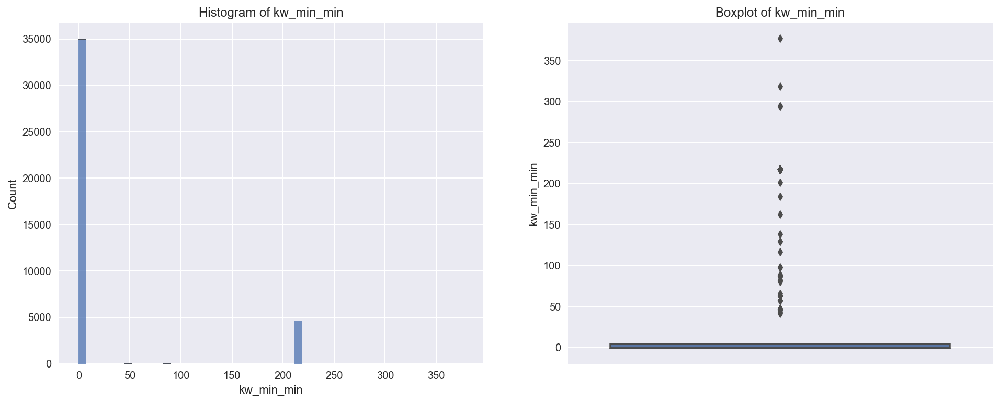

In [33]:
# 19. kw_min_min: Worst keyword (min. shares)
hist_box(df, 'kw_min_min')
show_statistic(df, 'kw_min_min')

The kw_min_min shows the observations concentrate near 0. It has 4 outliers.

kw_max_min : mean = 1153.9517, var = 14884093.6034, std = 3857.9909, q1(25%) = 445.0000, q3(75%) = 1000.0000, min = 0.0000, max = 298400.0000
It has 271 ourliers that larger than (mean + 3*std), account for 0.6836 %


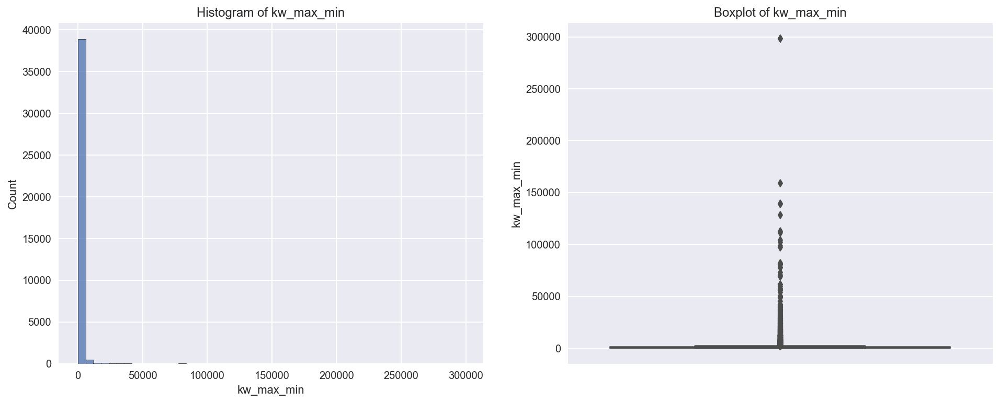

In [34]:
# 20. kw_max_min: Worst keyword (max. shares)
hist_box(df, 'kw_max_min')
show_statistic(df, 'kw_max_min')

The kw_max_min shows right skewed distribution and it has 0.6836 % outliers. It has a large variance.

kw_avg_min : mean = 312.3670, var = 385372.6347, std = 620.7839, q1(25%) = 141.7500, q3(75%) = 357.0000, min = -1.0000, max = 42827.8571
It has 278 ourliers that larger than (mean + 3*std), account for 0.7012 %


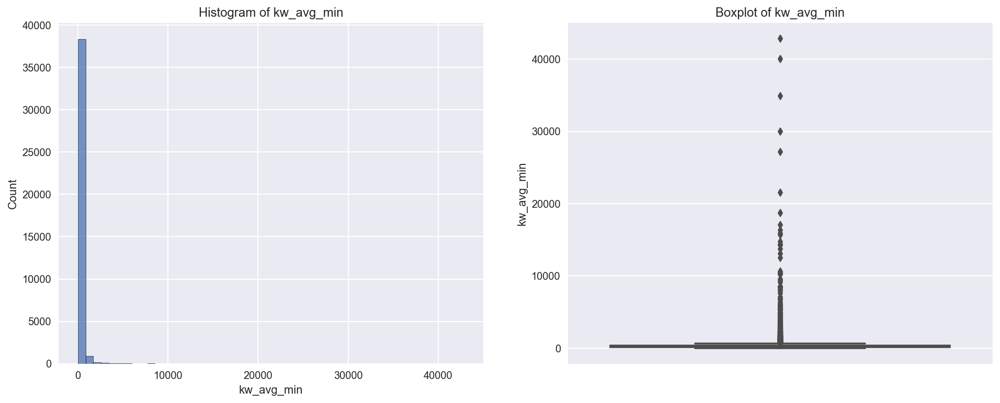

In [35]:
# 21. kw_avg_min: Worst keyword (avg. shares)
hist_box(df, 'kw_avg_min')
show_statistic(df, 'kw_avg_min')

The kw_avg_min shows right skewed distribution and it has 0.7012 % outliers.

kw_min_max : mean = 13612.3541, var = 3362379600.6345, std = 57986.0294, q1(25%) = 0.0000, q3(75%) = 7900.0000, min = 0.0000, max = 843300.0000
It has 469 ourliers that larger than (mean + 3*std), account for 1.1830 %


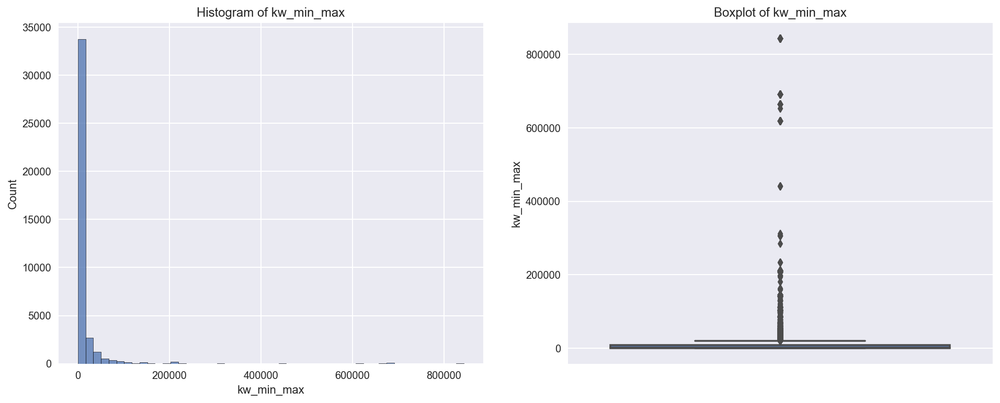

In [36]:
# 22. kw_min_max: Best keyword (min. shares)
hist_box(df, 'kw_min_max')
show_statistic(df, 'kw_min_max')

The kw_min_max shows right skewed distribution and it has 1.1830 % outliers. It has a large variance.

kw_max_max : mean = 752324.0667, var = 46011163591.2588, std = 214502.1296, q1(25%) = 843300.0000, q3(75%) = 843300.0000, min = 0.0000, max = 843300.0000
It has 3096 ourliers that larger than (mean + 3*std), account for 7.8095 %


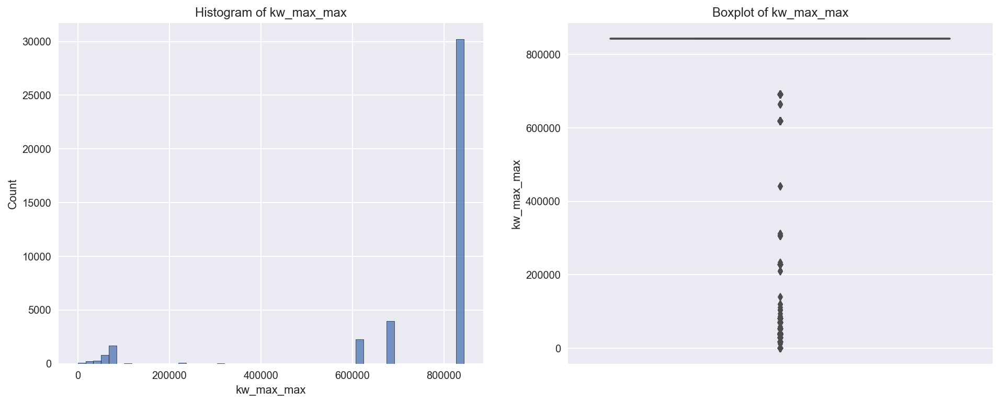

In [37]:
# 23. kw_max_max: Best keyword (max. shares)
hist_box(df, 'kw_max_max')
show_statistic(df, 'kw_max_max')

The kw_max_max shows the observations concentrate near 800000. It has 7.8095 % outliers.

kw_avg_max : mean = 259281.9381, var = 18252617221.3965, std = 135102.2473, q1(25%) = 172846.8750, q3(75%) = 330980.0000, min = 0.0000, max = 843300.0000
It has 336 ourliers that larger than (mean + 3*std), account for 0.8475 %


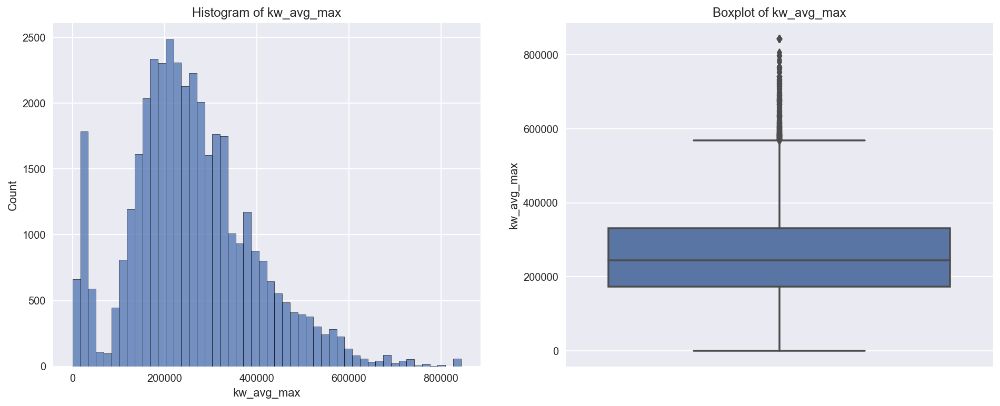

In [38]:
# 24. kw_avg_max: Best keyword (avg. shares)
hist_box(df, 'kw_avg_max')
show_statistic(df, 'kw_avg_max')

The kw_avg_max shows right skewed distribution and it has 0.8475 % outliers. It has a large variance.

kw_min_avg : mean = 1117.1466, var = 1293808.3149, std = 1137.4570, q1(25%) = 0.0000, q3(75%) = 2056.7810, min = -1.0000, max = 3613.0398


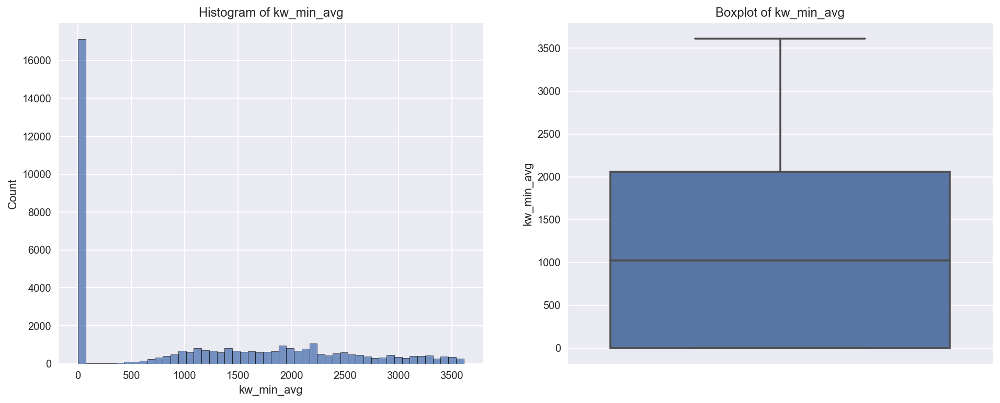

In [39]:
# 25. kw_min_avg: Avg. keyword (min. shares)
hist_box(df, 'kw_min_avg')
show_statistic(df, 'kw_min_avg')

The kw_min_avg shows normal distribution except near 0. It has no outliers. It has a large variance.

kw_max_avg : mean = 5657.2112, var = 37196239.1448, std = 6098.8720, q1(25%) = 3562.1016, q3(75%) = 6019.9540, min = 0.0000, max = 298400.0000
It has 393 ourliers that larger than (mean + 3*std), account for 0.9913 %


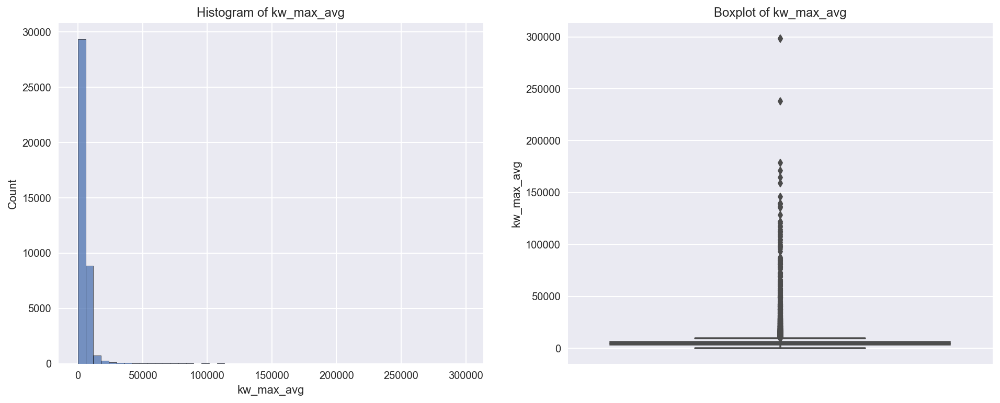

In [40]:
# 26. kw_max_avg: Avg. keyword (max. shares)
hist_box(df, 'kw_max_avg')
show_statistic(df, 'kw_max_avg')

The kw_max_avg shows right-skewed distribution. It has 0.9913 % outliers. It has a large variance.

kw_avg_avg : mean = 3135.8586, var = 1737520.4694, std = 1318.1504, q1(25%) = 2382.4486, q3(75%) = 3600.2296, min = 0.0000, max = 43567.6599
It has 378 ourliers that larger than (mean + 3*std), account for 0.9535 %


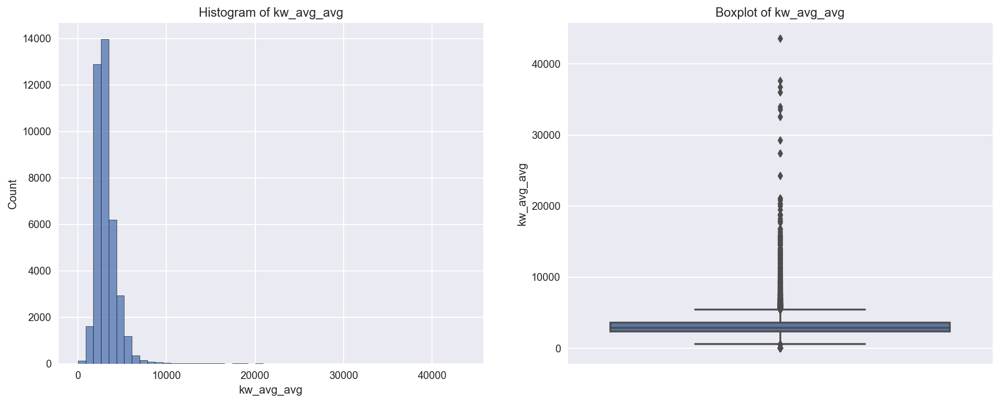

In [41]:
# 27. kw_avg_avg: Avg. keyword (avg. shares)
hist_box(df, 'kw_avg_avg')
show_statistic(df, 'kw_avg_avg')

The kw_max_avg shows right-skewed distribution. It has 0.9535 % outliers. It has a large variance.

self_reference_min_shares : mean = 3998.7554, var = 389615113.7495, std = 19738.6705, q1(25%) = 639.0000, q3(75%) = 2600.0000, min = 0.0000, max = 843300.0000
It has 270 ourliers that larger than (mean + 3*std), account for 0.6811 %


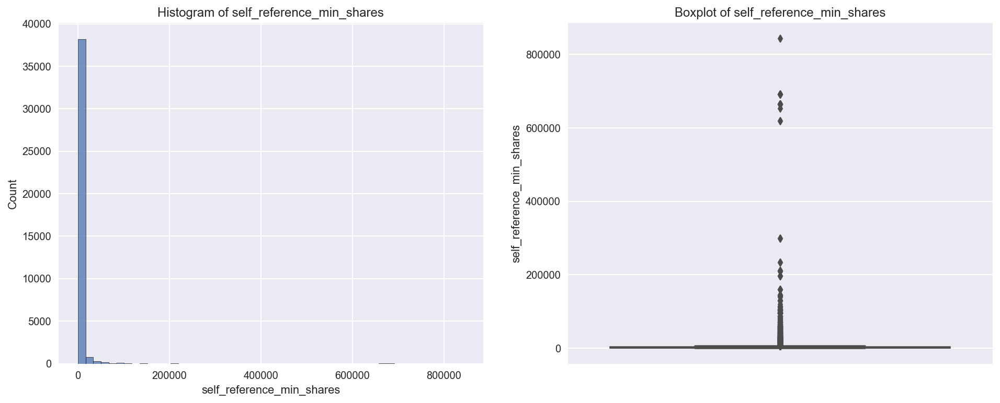

In [42]:
# 28. self_reference_min_shares: Min. shares of referenced articles in Mashable
hist_box(df, 'self_reference_min_shares')
show_statistic(df, 'self_reference_min_shares')

The kw_max_avg shows right-skewed distribution. It has 0.6811 % outliers. It has a large variance.

self_reference_max_shares : mean = 10329.2127, var = 1683262042.7293, std = 41027.5766, q1(25%) = 1100.0000, q3(75%) = 8000.0000, min = 0.0000, max = 843300.0000
It has 256 ourliers that larger than (mean + 3*std), account for 0.6457 %


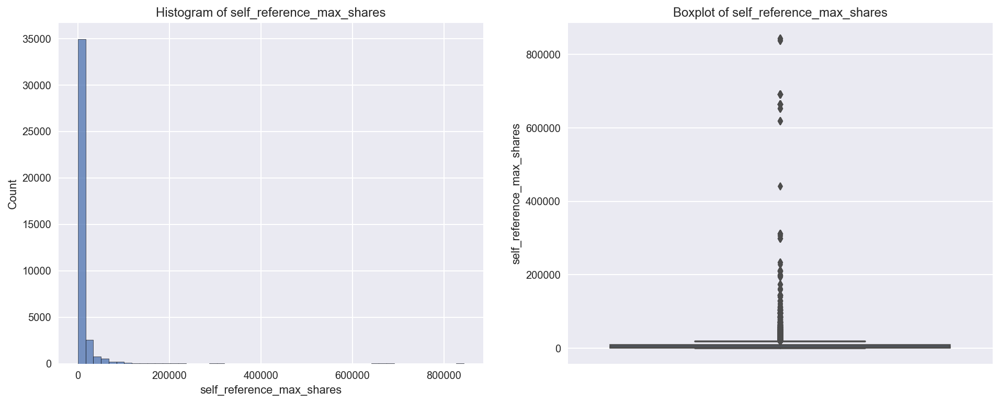

In [43]:
# 29. self_reference_max_shares: Max. shares of referenced articles in Mashable
hist_box(df, 'self_reference_max_shares')
show_statistic(df, 'self_reference_max_shares')

The self_reference_max_shares shows right-skewed distribution. It has 0.6811 % outliers. It has a large variance.

self_reference_avg_sharess : mean = 6401.6976, var = 586188608.4150, std = 24211.3322, q1(25%) = 981.1875, q3(75%) = 5200.0000, min = 0.0000, max = 843300.0000
It has 321 ourliers that larger than (mean + 3*std), account for 0.8097 %


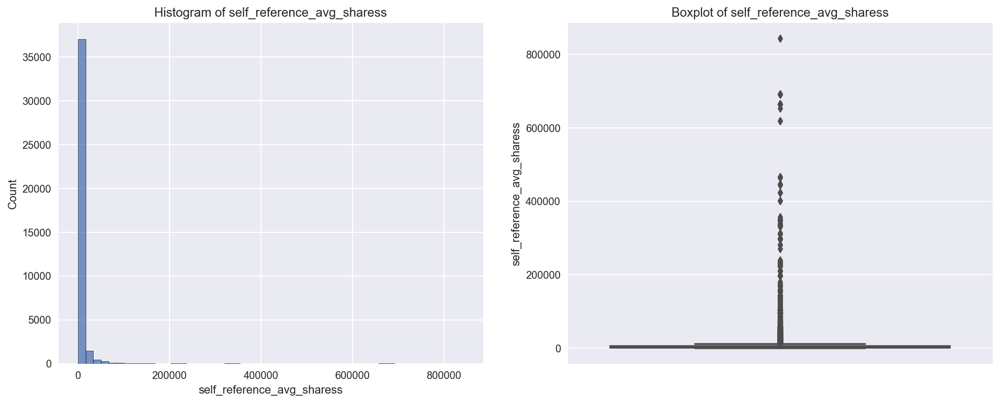

In [44]:
# 30. self_reference_avg_sharess: Avg. shares of referenced articles in Mashable
hist_box(df, 'self_reference_avg_sharess')
show_statistic(df, 'self_reference_avg_sharess')

The self_reference_avg_sharess shows right-skewed distribution. It has 0.8097 % outliers. It has a large variance.

<AxesSubplot:>

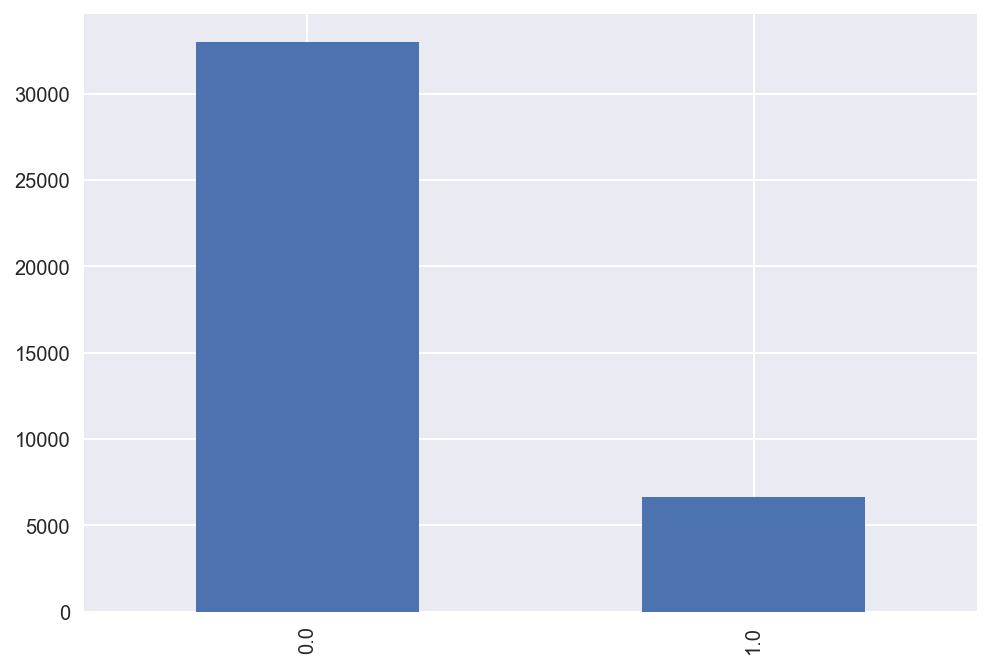

In [45]:
# 31. weekday_is_monday: Was the article published on a Monday?
df['weekday_is_monday'].value_counts().plot.bar()

The weekday_is_monday can convert to binary category.

<AxesSubplot:>

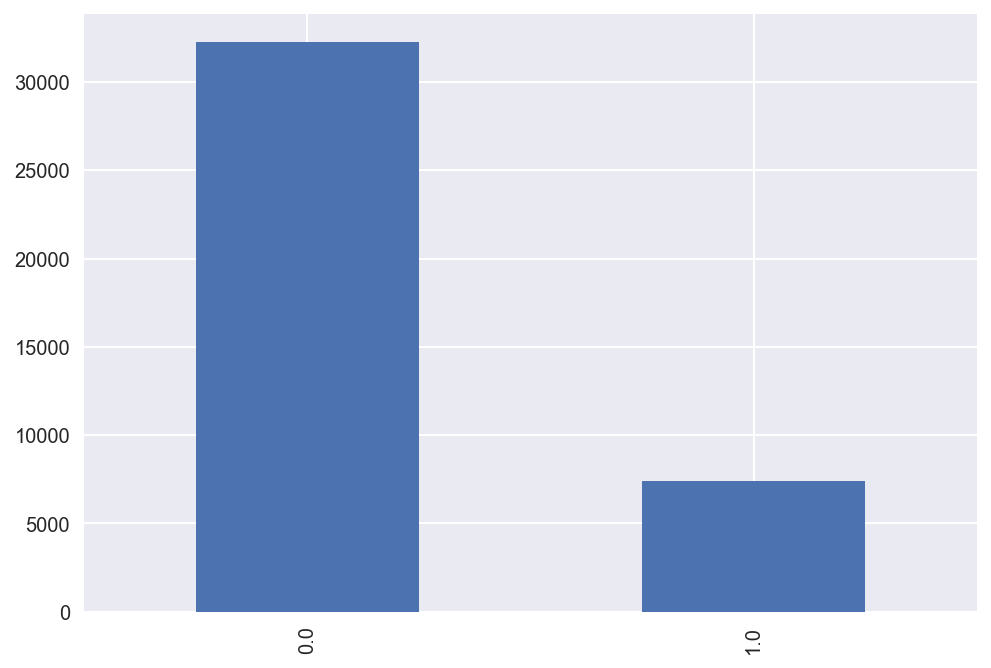

In [46]:
# 32. weekday_is_tuesday: Was the article published on a Tuesday?
df['weekday_is_tuesday'].value_counts().plot.bar()

The weekday_is_tuesday can convert to binary category.

<AxesSubplot:>

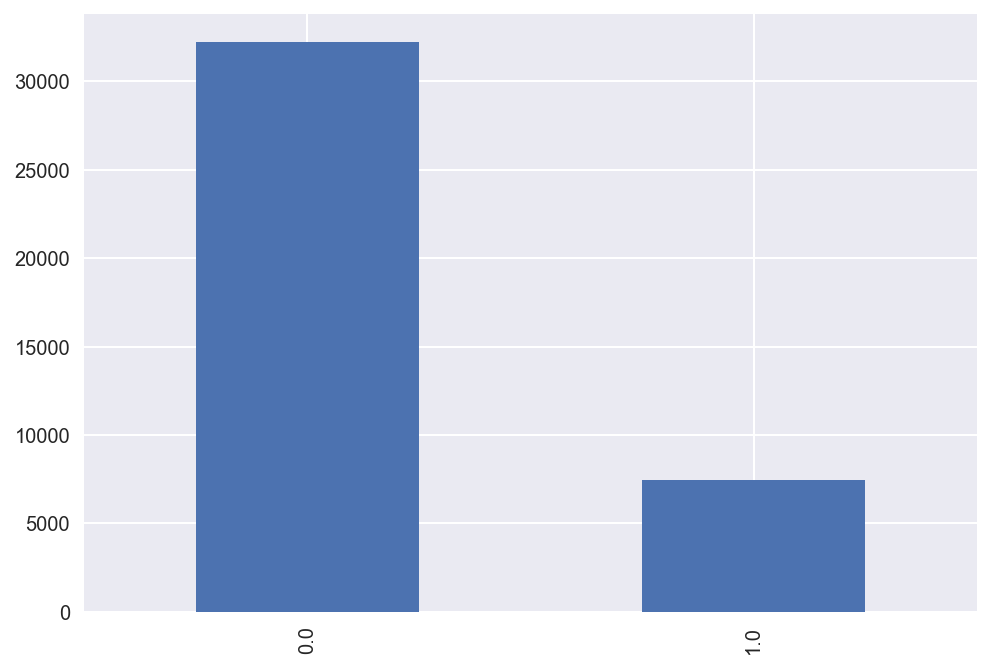

In [47]:
# 33. weekday_is_wednesday: Was the article published on a Wednesday?
df['weekday_is_wednesday'].value_counts().plot.bar()

The weekday_is_wednesday can convert to binary category.

<AxesSubplot:>

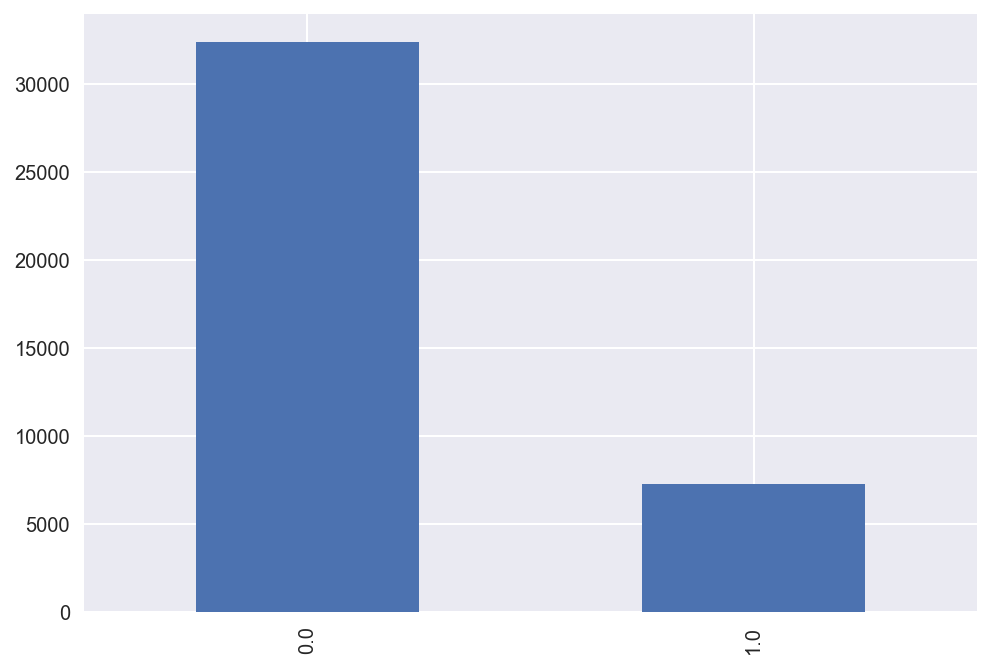

In [48]:
# 34. weekday_is_thursday: Was the article published on a Thursday?
df['weekday_is_thursday'].value_counts().plot.bar()

The weekday_is_thursday can convert to binary category.

<AxesSubplot:>

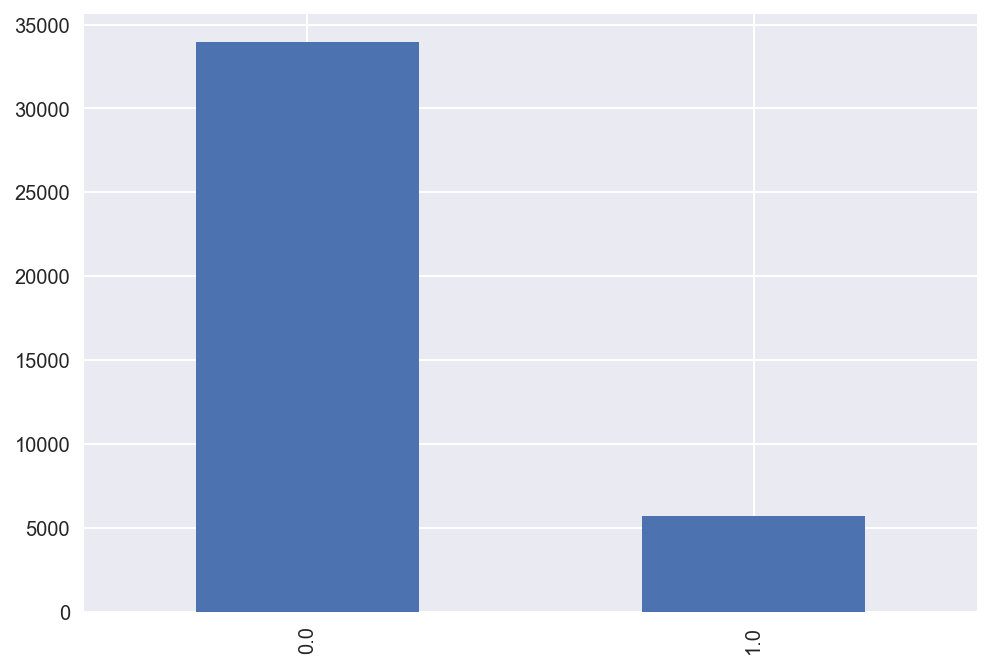

In [49]:
# 35. weekday_is_friday: Was the article published on a Friday?
df['weekday_is_friday'].value_counts().plot.bar()

The weekday_is_friday can convert to binary category.

<AxesSubplot:>

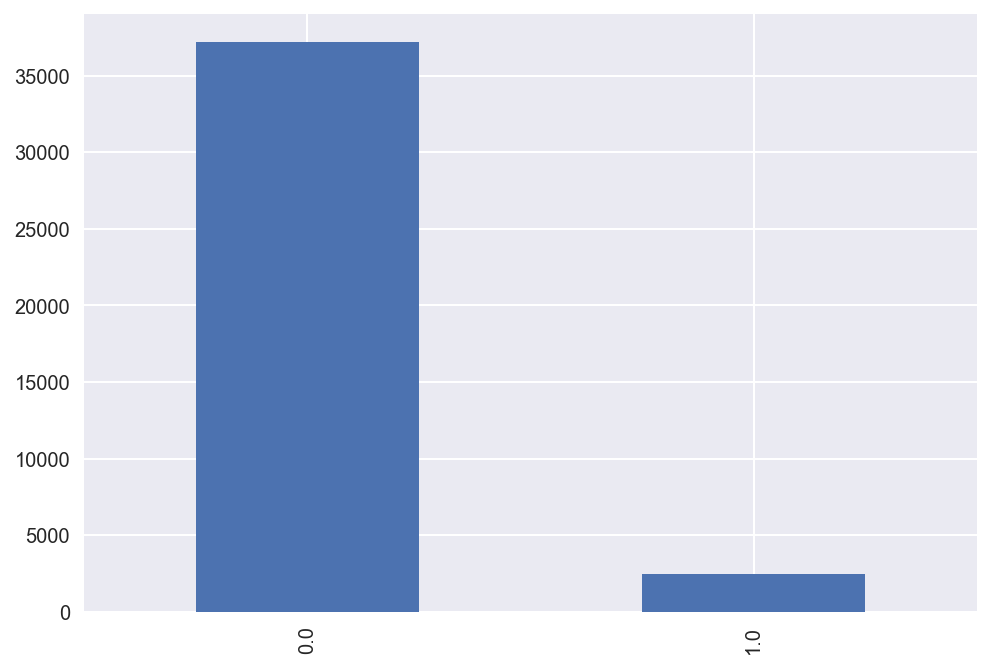

In [50]:
# 36. weekday_is_saturday: Was the article published on a Saturday?
df['weekday_is_saturday'].value_counts().plot.bar()

The weekday_is_saturday can convert to binary category.

<AxesSubplot:>

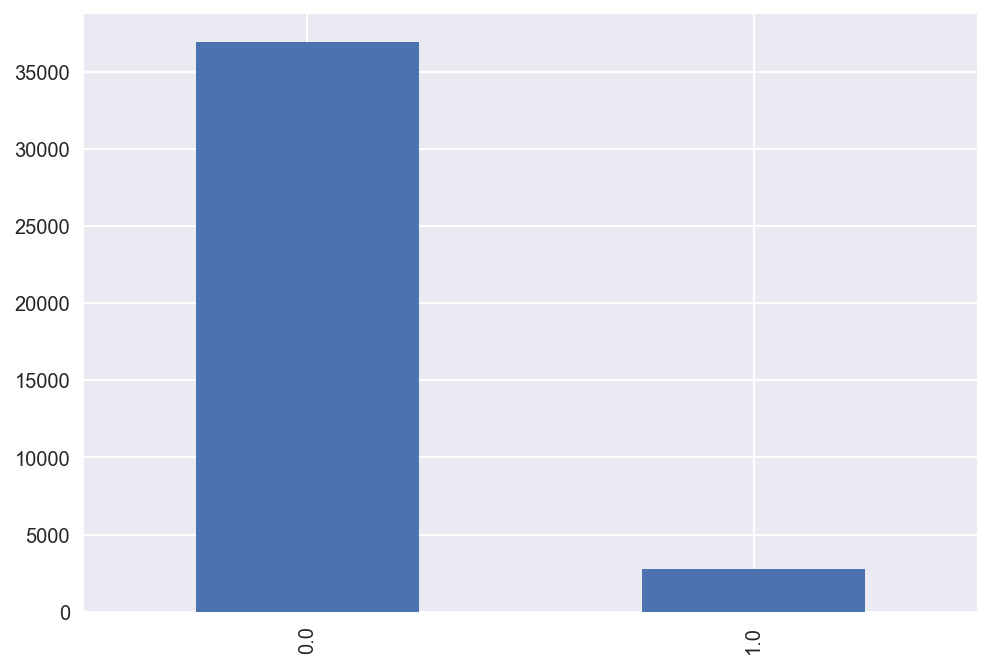

In [51]:
# 37. weekday_is_sunday: Was the article published on a Sunday? 
df['weekday_is_sunday'].value_counts().plot.bar()

The weekday_is_sunday can convert to binary category.

<AxesSubplot:>

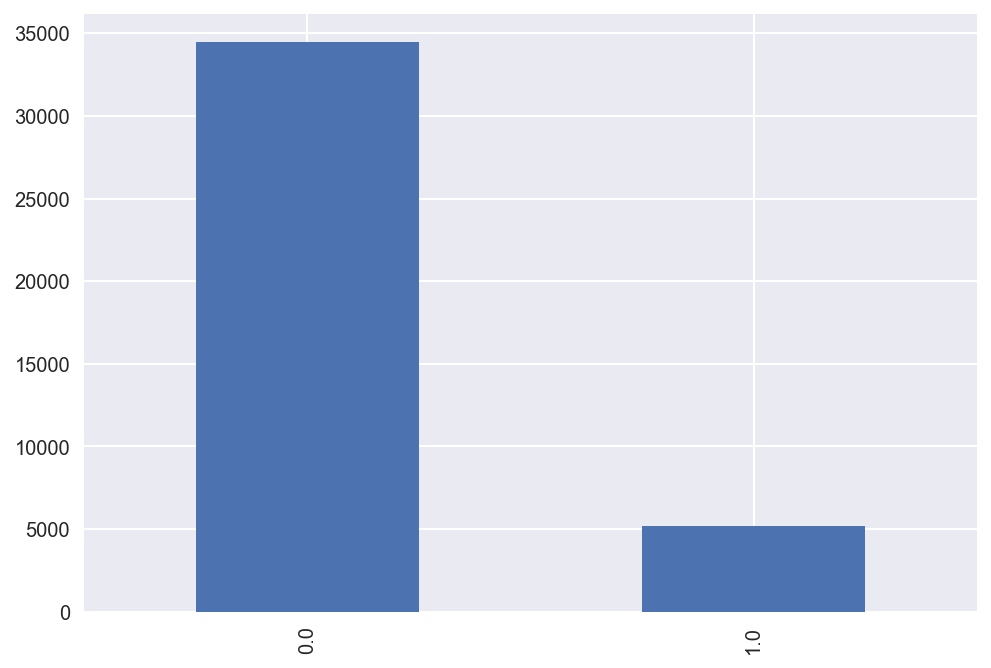

In [52]:
# 38. is_weekend: Was the article published on the weekend?
df['is_weekend'].value_counts().plot.bar()

The is_weekend can convert to binary category.

LDA_00 : mean = 0.1846, var = 0.0692, std = 0.2630, q1(25%) = 0.0251, q3(75%) = 0.2410, min = 0.0000, max = 0.9270


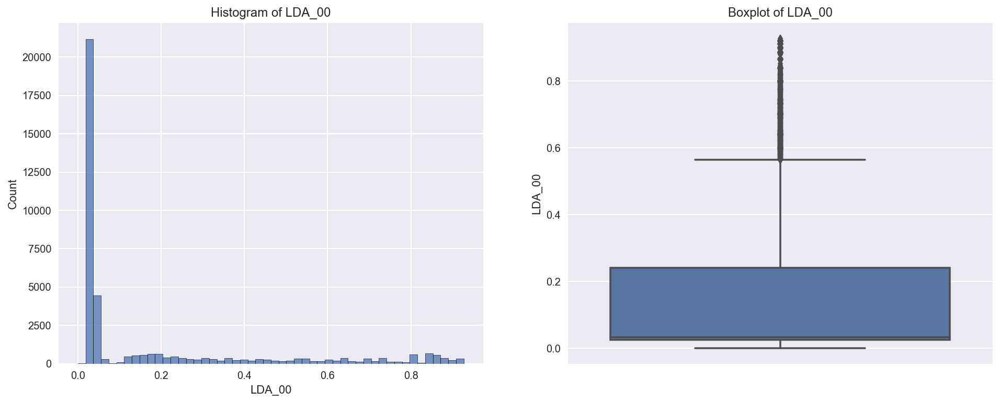

In [53]:
# 39. LDA_00: Closeness to LDA topic 0
hist_box(df, 'LDA_00')
show_statistic(df, 'LDA_00')

LDA_00 shows values concentrate near 0.0.

LDA_01 : mean = 0.1413, var = 0.0483, std = 0.2197, q1(25%) = 0.0250, q3(75%) = 0.1508, min = 0.0000, max = 0.9259
It has 1303 ourliers that larger than (mean + 3*std), account for 3.2868 %


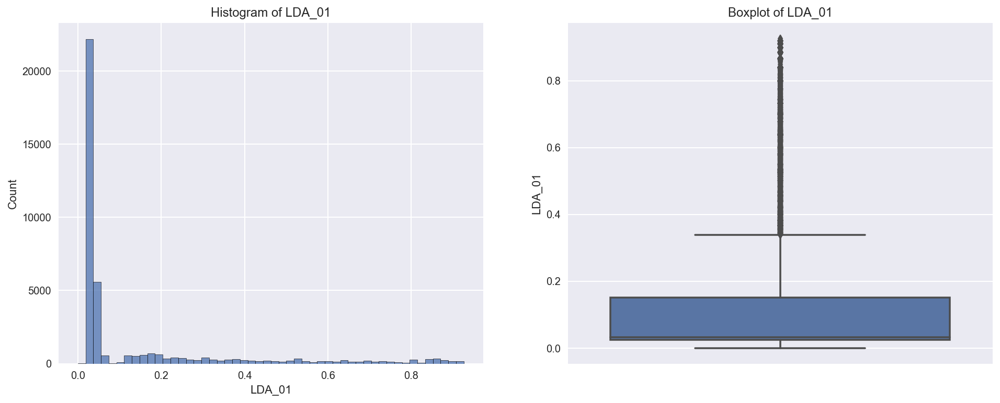

In [54]:
# 40. LDA_01: Closeness to LDA topic 1
hist_box(df, 'LDA_01')
show_statistic(df, 'LDA_01')

LDA_01 shows values concentrate near 0.0. It has 3.2868 % outliers

LDA_02 : mean = 0.2163, var = 0.0796, std = 0.2821, q1(25%) = 0.0286, q3(75%) = 0.3342, min = 0.0000, max = 0.9200


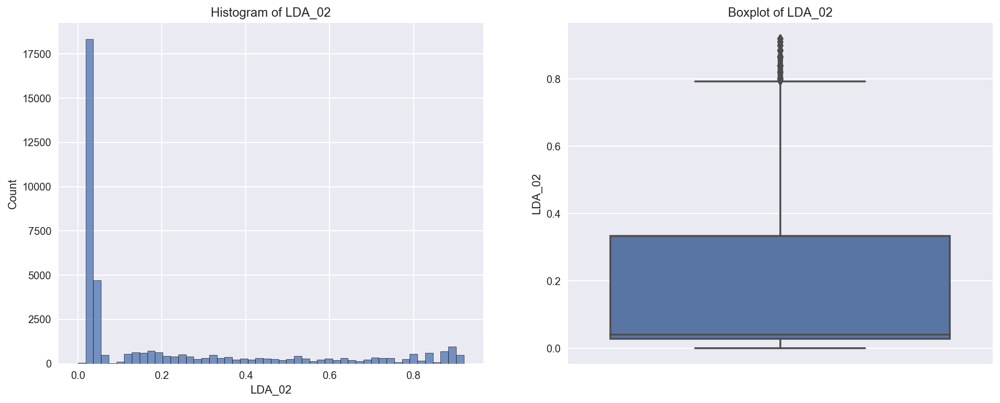

In [55]:
# 41. LDA_02: Closeness to LDA topic 2
hist_box(df, 'LDA_02')
show_statistic(df, 'LDA_02')

LDA_02 shows values concentrate near 0.0.

LDA_03 : mean = 0.2238, var = 0.0871, std = 0.2952, q1(25%) = 0.0286, q3(75%) = 0.3758, min = 0.0000, max = 0.9265


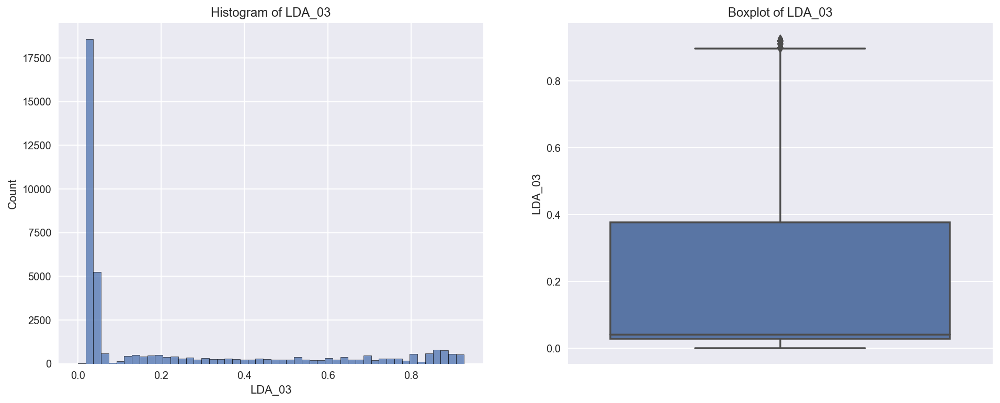

In [56]:
# 42. LDA_03: Closeness to LDA topic 3
hist_box(df, 'LDA_03')
show_statistic(df, 'LDA_03')

LDA_03 shows values concentrate near 0.0.

LDA_04 : mean = 0.2340, var = 0.0836, std = 0.2892, q1(25%) = 0.0286, q3(75%) = 0.4000, min = 0.0000, max = 0.9272


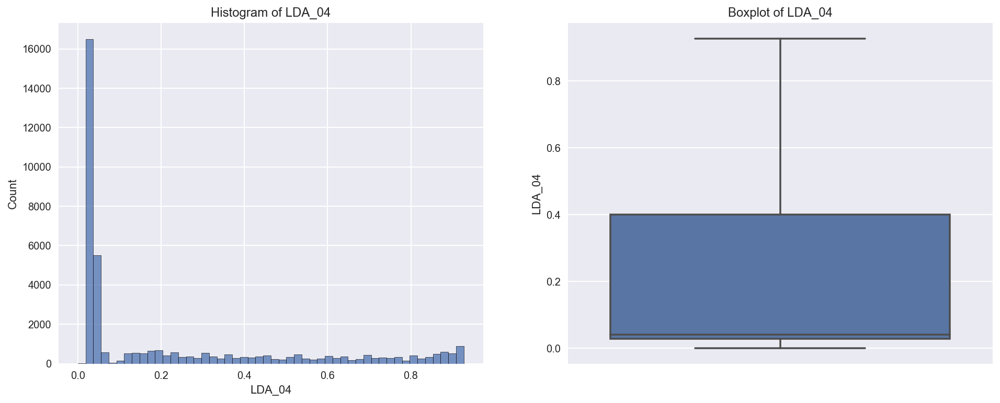

In [57]:
# 43. LDA_04: Closeness to LDA topic 4
hist_box(df, 'LDA_04')
show_statistic(df, 'LDA_04')

LDA_04 shows values concentrate near 0.0.

global_subjectivity : mean = 0.4434, var = 0.0136, std = 0.1167, q1(25%) = 0.3962, q3(75%) = 0.5083, min = 0.0000, max = 1.0000
It has 1240 ourliers that larger than (mean + 3*std), account for 3.1278 %


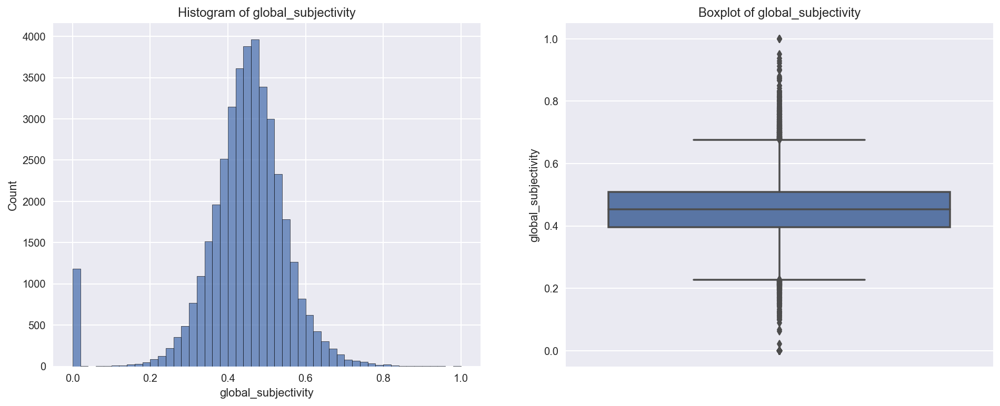

In [58]:
# 44. global_subjectivity: Text subjectivity
hist_box(df, 'global_subjectivity')
show_statistic(df, 'global_subjectivity')

The global_subjectivity shows normal distribution. I has 3.1278 % outliers that are on both sides.

global_sentiment_polarity : mean = 0.1193, var = 0.0094, std = 0.0969, q1(25%) = 0.0578, q3(75%) = 0.1778, min = -0.3937, max = 0.7278
It has 392 ourliers that larger than (mean + 3*std), account for 0.9888 %


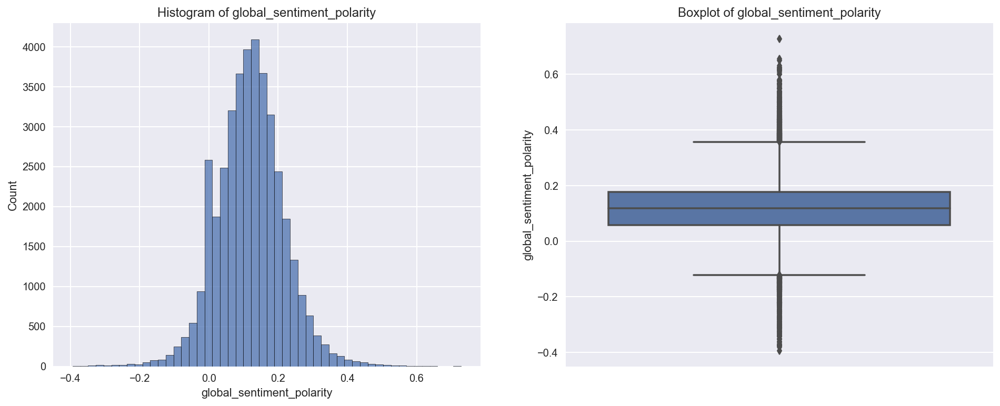

In [59]:
# 45. global_sentiment_polarity: Text sentiment polarity
hist_box(df, 'global_sentiment_polarity')
show_statistic(df, 'global_sentiment_polarity')

The global_sentiment_polarity shows normal distribution. It has 0.9888 % outliers that are on both sides.

global_rate_positive_words : mean = 0.0396, var = 0.0003, std = 0.0174, q1(25%) = 0.0284, q3(75%) = 0.0503, min = 0.0000, max = 0.1555
It has 237 ourliers that larger than (mean + 3*std), account for 0.5978 %


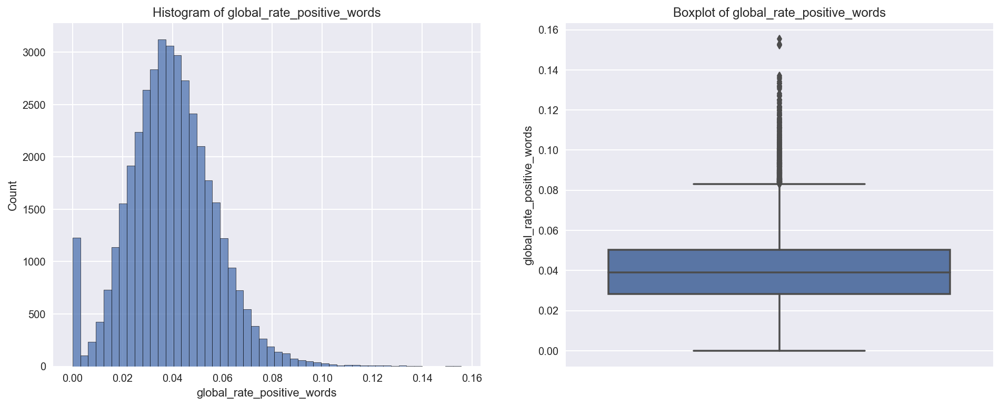

In [60]:
# 46. global_rate_positive_words: Rate of positive words in the content
hist_box(df, 'global_rate_positive_words')
show_statistic(df, 'global_rate_positive_words')

The global_sentiment_polarity shows the normal distribution. It has 0.5978 % outliers. Some data concentrate near 0. We should pay attention to them.

global_rate_negative_words : mean = 0.0166, var = 0.0001, std = 0.0108, q1(25%) = 0.0096, q3(75%) = 0.0217, min = 0.0000, max = 0.1849
It has 548 ourliers that larger than (mean + 3*std), account for 1.3823 %


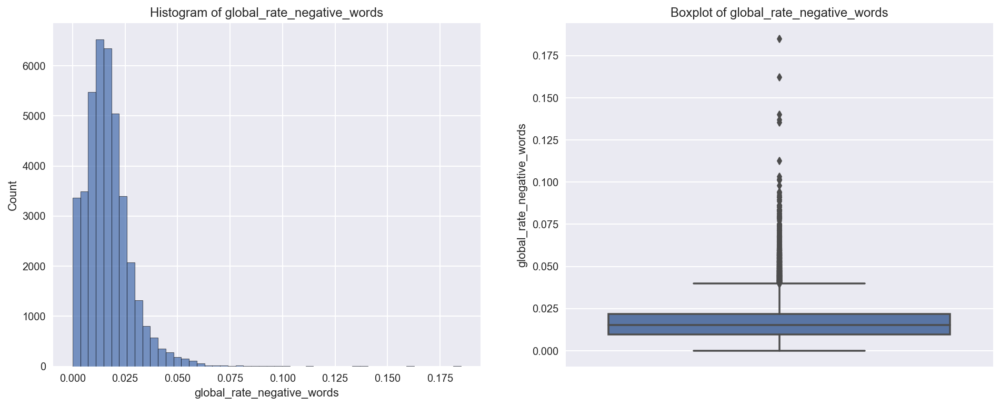

In [61]:
# 47. global_rate_negative_words: Rate of negative words in the content
hist_box(df, 'global_rate_negative_words')
show_statistic(df, 'global_rate_negative_words')

The global_rate_negative_words shows the right-skewed distribution. It has 1.3823 % outliers.

rate_positive_words : mean = 0.6822, var = 0.0362, std = 0.1902, q1(25%) = 0.6000, q3(75%) = 0.8000, min = 0.0000, max = 1.0000
It has 1241 ourliers that larger than (mean + 3*std), account for 3.1304 %


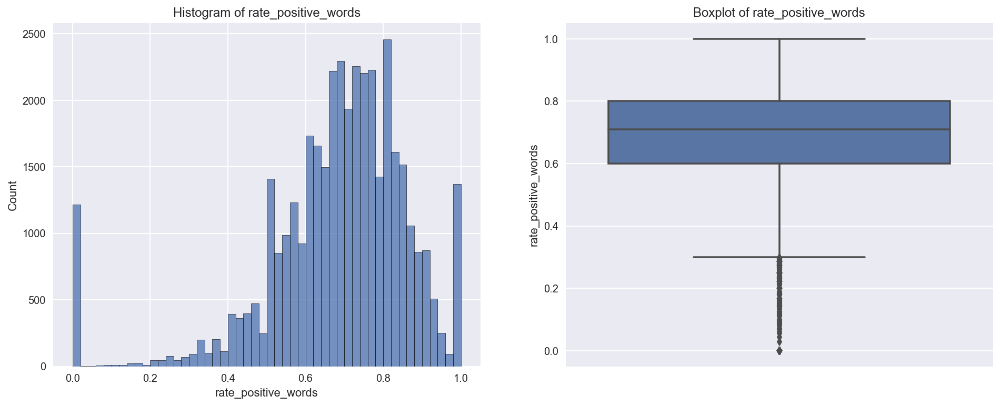

In [62]:
# 48. rate_positive_words: Rate of positive words among non-neutral tokens
hist_box(df, 'rate_positive_words')
show_statistic(df, 'rate_positive_words')

The rate_positive_words shows the left-skewed distribution. It has 3.1304 % outliers.

rate_negative_words : mean = 0.2879, var = 0.0244, std = 0.1562, q1(25%) = 0.1852, q3(75%) = 0.3846, min = 0.0000, max = 1.0000
It has 218 ourliers that larger than (mean + 3*std), account for 0.5499 %


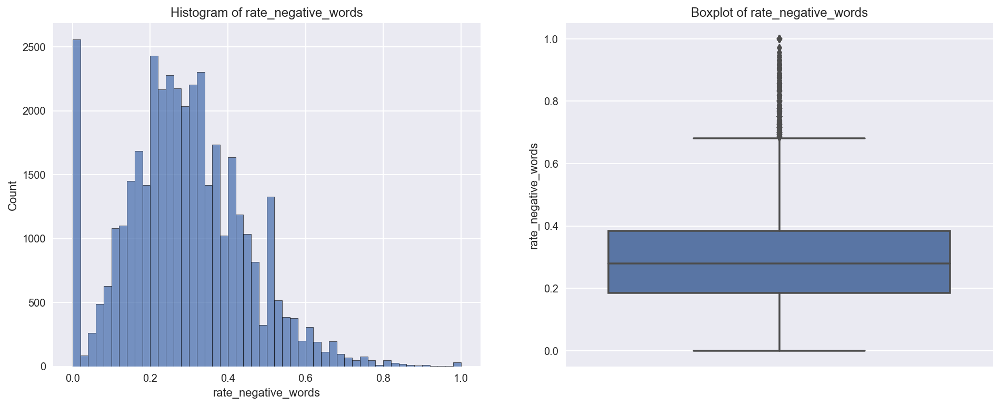

In [63]:
# 49. rate_negative_words: Rate of negative words among non-neutral tokens
hist_box(df, 'rate_negative_words')
show_statistic(df, 'rate_negative_words')

The rate_negative_words shows the normal distribution. It has 0.5499 % outliers. Some data concentrate near 0.

avg_positive_polarity : mean = 0.3538, var = 0.0109, std = 0.1045, q1(25%) = 0.3062, q3(75%) = 0.4114, min = 0.0000, max = 1.0000
It has 1374 ourliers that larger than (mean + 3*std), account for 3.4658 %


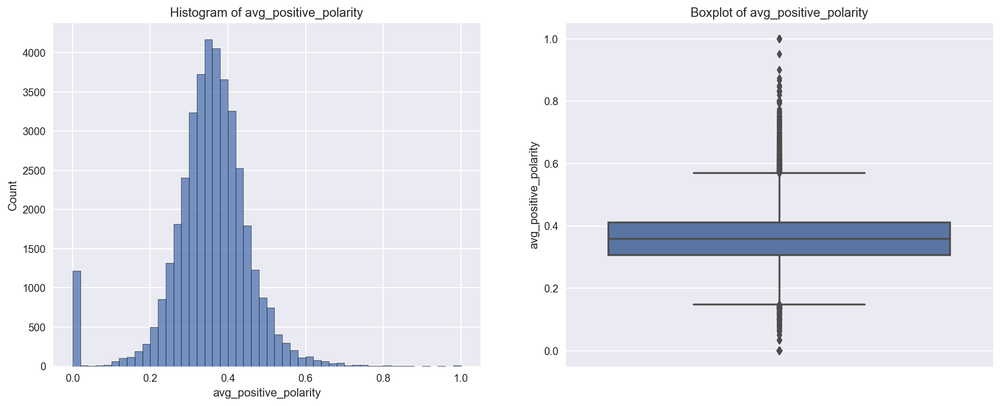

In [64]:
# 50. avg_positive_polarity: Avg. polarity of positive words
hist_box(df, 'avg_positive_polarity')
show_statistic(df, 'avg_positive_polarity')

The avg_positive_polarity shows the normal distribution. It has 3.4658 % outliers. Some data concentrate near 0.

min_positive_polarity : mean = 0.0954, var = 0.0051, std = 0.0713, q1(25%) = 0.0500, q3(75%) = 0.1000, min = 0.0000, max = 1.0000
It has 751 ourliers that larger than (mean + 3*std), account for 1.8944 %


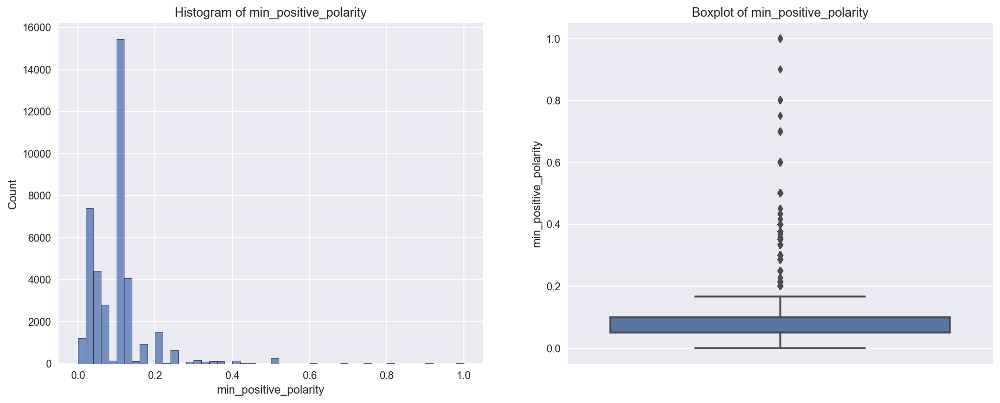

In [65]:
# 51. min_positive_polarity: Min. polarity of positive words
hist_box(df, 'min_positive_polarity')
show_statistic(df, 'min_positive_polarity')

The min_positive_polarity shows Non-symmetric bimodal distribution. It has 1.8944 % outliers.

max_positive_polarity : mean = 0.7567, var = 0.0614, std = 0.2478, q1(25%) = 0.6000, q3(75%) = 1.0000, min = 0.0000, max = 1.0000
It has 1217 ourliers that larger than (mean + 3*std), account for 3.0698 %


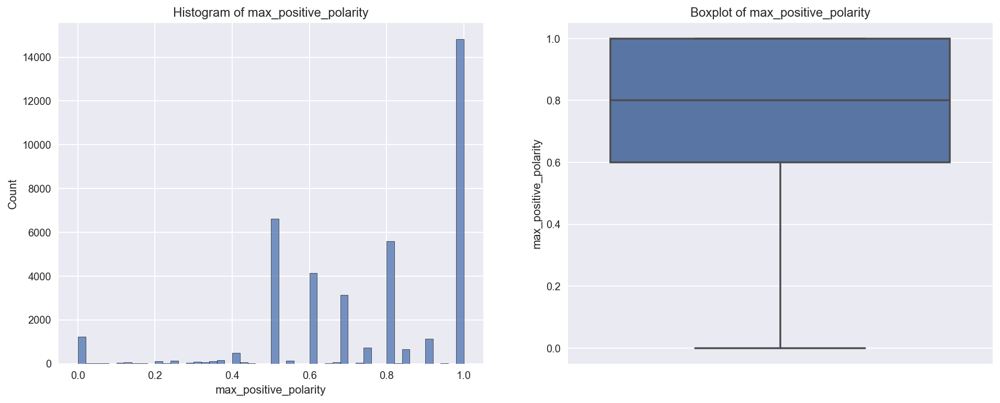

In [66]:
# 52. max_positive_polarity: Max. polarity of positive words
hist_box(df, 'max_positive_polarity')
show_statistic(df, 'max_positive_polarity')

The min_positive_polarity shows left-skewed distribution. It has 3.0698 % outliers.

avg_negative_polarity : mean = -0.2595, var = 0.0163, std = 0.1277, q1(25%) = -0.3284, q3(75%) = -0.1869, min = -1.0000, max = 0.0000
It has 328 ourliers that larger than (mean + 3*std), account for 0.8274 %


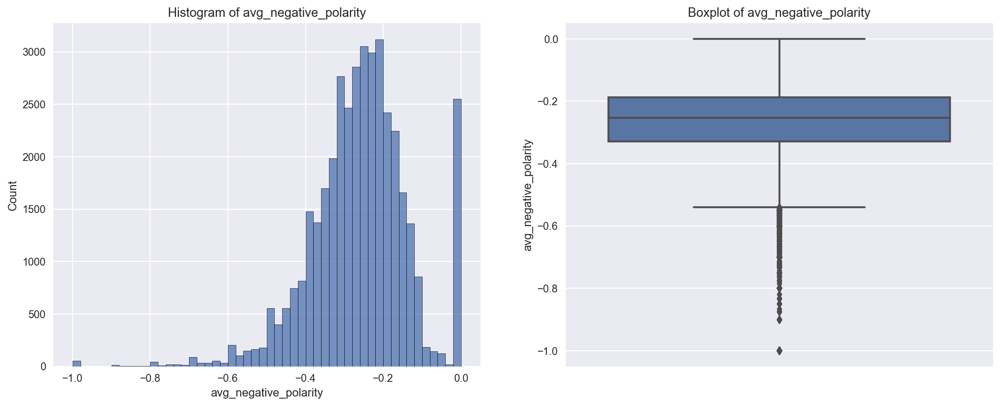

In [67]:
# 53. avg_negative_polarity: Avg. polarity of negative words
hist_box(df, 'avg_negative_polarity')
show_statistic(df, 'avg_negative_polarity')

The avg_negative_polarity shows left-skewed distribution. It has 0.8274 % outliers. Some data concentrate near 0.

min_negative_polarity : mean = -0.5219, var = 0.0843, std = 0.2903, q1(25%) = -0.7000, q3(75%) = -0.3000, min = -1.0000, max = 0.0000


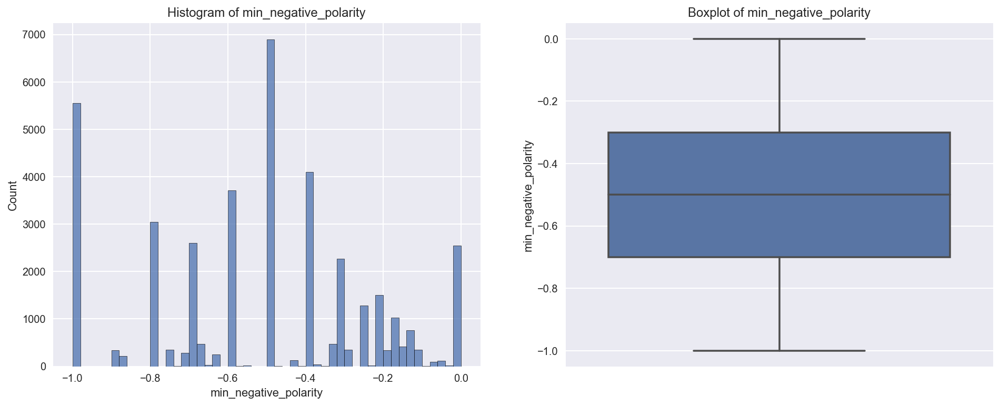

In [68]:
# 54. min_negative_polarity: Min. polarity of negative words
hist_box(df, 'min_negative_polarity')
show_statistic(df, 'min_negative_polarity')

The min_negative_polarity shows normal distribution. Some data concentrate near -1 and 0.

max_negative_polarity : mean = -0.1075, var = 0.0091, std = 0.0954, q1(25%) = -0.1250, q3(75%) = -0.0500, min = -1.0000, max = 0.0000
It has 1152 ourliers that larger than (mean + 3*std), account for 2.9059 %


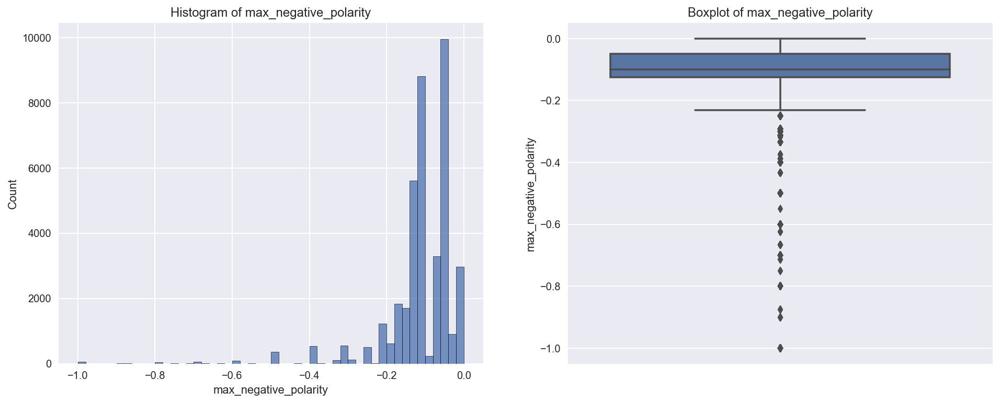

In [69]:
# 55. max_negative_polarity: Max. polarity of negative words
hist_box(df, 'max_negative_polarity')
show_statistic(df, 'max_negative_polarity')

The max_negative_polarity shows left-skewed distribution. It has 2.9059 % outliters

title_subjectivity : mean = 0.2824, var = 0.1051, std = 0.3242, q1(25%) = 0.0000, q3(75%) = 0.5000, min = 0.0000, max = 1.0000


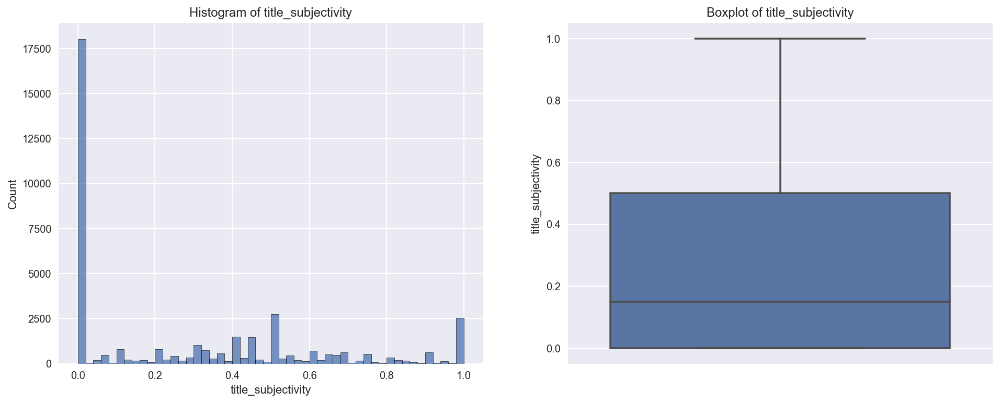

In [70]:
# 56. title_subjectivity: Title subjectivity
hist_box(df, 'title_subjectivity')
show_statistic(df, 'title_subjectivity')

The title_subjectivity shows right-skewed distribution. Many data concentrate near 0.

title_sentiment_polarity : mean = 0.0714, var = 0.0705, std = 0.2655, q1(25%) = 0.0000, q3(75%) = 0.1500, min = -1.0000, max = 1.0000
It has 914 ourliers that larger than (mean + 3*std), account for 2.3055 %


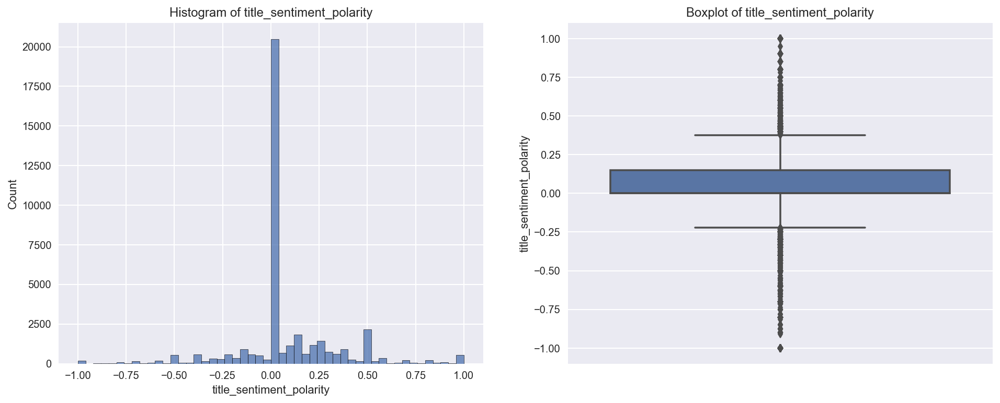

In [71]:
# 57. title_sentiment_polarity: Title polarity
hist_box(df, 'title_sentiment_polarity')
show_statistic(df, 'title_sentiment_polarity')

The title_subjectivity shows normal distribution. Outliers account for 2.3055 % of the total. They are on both sides.

abs_title_subjectivity : mean = 0.3418, var = 0.0356, std = 0.1888, q1(25%) = 0.1667, q3(75%) = 0.5000, min = 0.0000, max = 0.5000


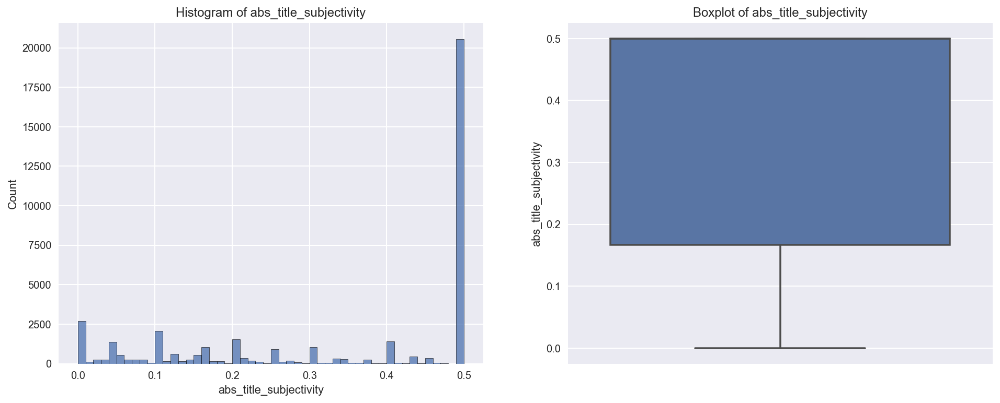

In [72]:
# 58. abs_title_subjectivity: Absolute subjectivity level
hist_box(df, 'abs_title_subjectivity')
show_statistic(df, 'abs_title_subjectivity')

The abs_title_subjectivity shows that many data concentrate near 0.5.

abs_title_sentiment_polarity : mean = 0.1561, var = 0.0512, std = 0.2263, q1(25%) = 0.0000, q3(75%) = 0.2500, min = 0.0000, max = 1.0000
It has 871 ourliers that larger than (mean + 3*std), account for 2.1971 %


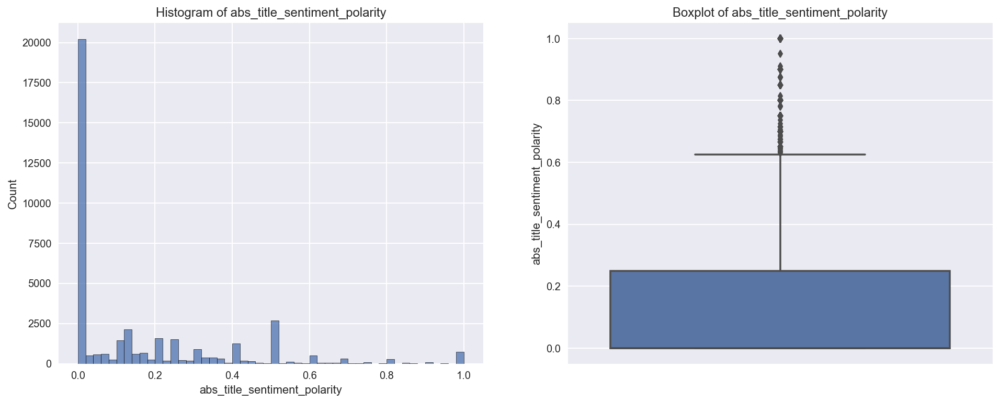

In [73]:
# 59. abs_title_sentiment_polarity: Absolute polarity level
hist_box(df, 'abs_title_sentiment_polarity')
show_statistic(df, 'abs_title_sentiment_polarity')

The abs_title_sentiment_polarity shows that many data concentrate near 0.0. Outliers account for 2.1971 %.

### Explore categories and response

The above exploration shows that some variables are category. I will explore them and shares by facet plots.

'data_channel_is_lifestyle', 'data_channel_is_entertainment', 'data_channel_is_bus', 
              'data_channel_is_socmed', 'data_channel_is_tech', 'data_channel_is_world',
             'weekday_is_monday', 'weekday_is_tuesday', 'weekday_is_wednesday', 'weekday_is_thursday', 
              'weekday_is_friday', 'weekday_is_saturday', 'weekday_is_sunday', 'is_weekend'

In [74]:
cat_cols = ['data_channel_is_lifestyle', 'data_channel_is_entertainment', 'data_channel_is_bus', 
            'data_channel_is_socmed', 'data_channel_is_tech', 'data_channel_is_world', 
           'weekday_is_monday', 'weekday_is_tuesday', 'weekday_is_wednesday', 'weekday_is_thursday', 
            'weekday_is_friday', 'weekday_is_saturday', 'weekday_is_sunday', 'is_weekend' ]

In [75]:
# Convert them to int type to avoid dummy them, because they are binary category.  
df[cat_cols] = df[cat_cols].astype("int")

In [76]:
def cate_vs_response_bars(ori_df, num1, cat1):

    fig,axes = plt.subplots(ncols=2, nrows=1)
    fig.set_size_inches(10, 6)
    axes[0].set_title("%s vs %s " %(num1,cat1))
    #sns.stripplot(x="reg_pct_level", y=col1, data=ori_df, ax=axes[0])
    sns.histplot(ori_df, x=num1, hue=cat1, element="step", fill=True, ax=axes[0])
    
    axes[1].set_title("%s vs %s " %(num1,cat1))
    #sns.stripplot(x="reg_pct_level", y=col2, data=ori_df, ax=axes[1])
    sns.violinplot(x=cat1, y=num1, data=df, ax=axes[1])

These names of category have obviously distinct groups. I will split two group to explore them. One is data_channel_*. The other is weekday_is*

In [77]:
cat_channel_cols = ['data_channel_is_lifestyle', 'data_channel_is_entertainment', 'data_channel_is_bus', 
            'data_channel_is_socmed', 'data_channel_is_tech', 'data_channel_is_world']

cat_weekday_cols = ['weekday_is_monday', 'weekday_is_tuesday', 'weekday_is_wednesday', 'weekday_is_thursday', 
            'weekday_is_friday', 'weekday_is_saturday', 'weekday_is_sunday', 'is_weekend']

In [78]:
def draw_violin(names):
    plt.figure(figsize = (12, 12))
    for i, col in enumerate(list(names)):
        plt.subplot(2, 4, i + 1)
        sns.violinplot(x=col, y="shares", data=df)
        plt.grid()
        plt.tight_layout()

def draw_bar(names):
    plt.figure(figsize = (10, 10))
    for i, col in enumerate(list(names)):
        plt.subplot(2, 4, i + 1)
        sns.barplot(x=col, y="shares", data=df)
        plt.grid()
        plt.tight_layout()

In [79]:
from scipy.stats import pointbiserialr

def point_biserial_correlation(names):
    """
    We should always prefer an attribute whose p-value is less than 0.05 to one whose p-value exceeds 0.05 
    (recall how to interpret p-values from the Comp Math + Stats course).  
    
    If neither of the categories of a binary response attribute show any significant point biserial correlation with a 
    particular explanatory variable then the explanatory attribute does not share a linear relationship with the binary 
    response variable. Remember: the point biserial metric can only be applied to BINARY categorical attributes, 
    i.e., at least one of the variables being used to derive the metric should be a binary categorical variable 
    while the other is either a floating point or integer value. 
    """
    for col in names:
        # get continuous and dichotomous data
        continuous_ = df['shares']
        
        category_ = df[col] # 'data_channel_is_socmed'

        pbc = pointbiserialr(category_, continuous_)
        
        print("correlation = %.4f, pvalue = %.4f, name = %s" %(pbc.correlation, pbc.pvalue, col ))

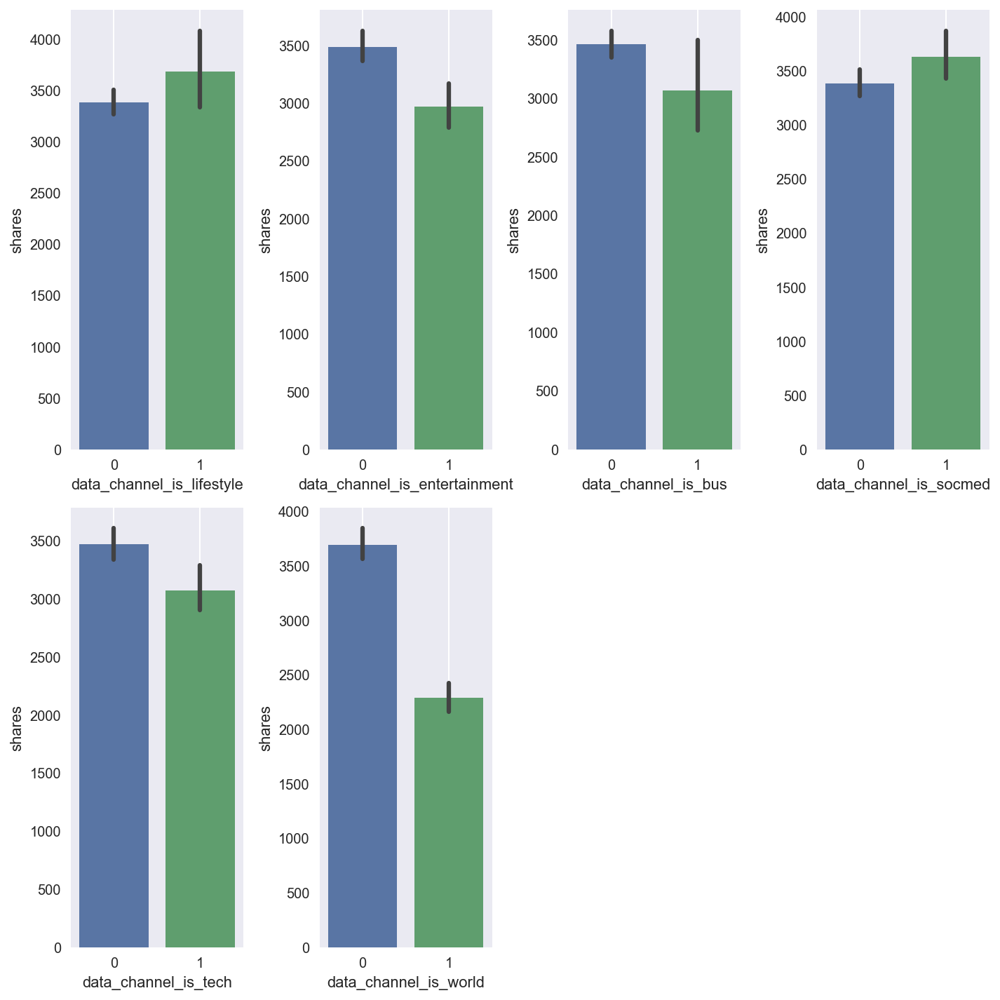

In [80]:
# view the all channel categories
draw_bar(cat_channel_cols)

In [81]:
point_biserial_correlation(cat_channel_cols)

correlation = 0.0058, pvalue = 0.2456, name = data_channel_is_lifestyle
correlation = -0.0170, pvalue = 0.0007, name = data_channel_is_entertainment
correlation = -0.0124, pvalue = 0.0137, name = data_channel_is_bus
correlation = 0.0050, pvalue = 0.3174, name = data_channel_is_socmed
correlation = -0.0133, pvalue = 0.0083, name = data_channel_is_tech
correlation = -0.0495, pvalue = 0.0000, name = data_channel_is_world


From the above side-by-side bar plots and Point Biserial Correlation table, we can see as followed

First, I want to find the balance bars between 1 and 0 for each category. 

Seconde, I want to find the higher correlation and the pvalue is less than 0.05 (significant). 

So they are all not match my conditions.

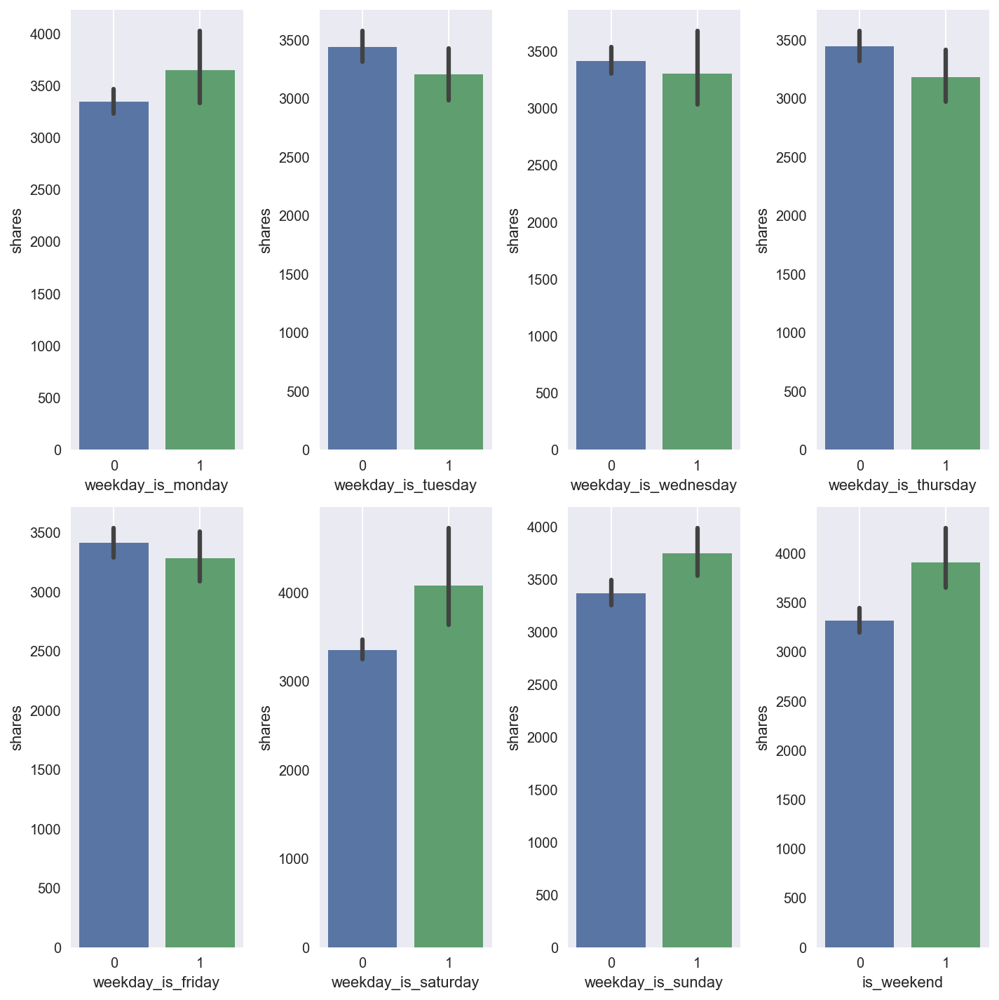

In [82]:
# view the all weekday categories
draw_bar(cat_weekday_cols)

In [83]:
point_biserial_correlation(cat_weekday_cols)

correlation = 0.0097, pvalue = 0.0528, name = weekday_is_monday
correlation = -0.0079, pvalue = 0.1139, name = weekday_is_tuesday
correlation = -0.0038, pvalue = 0.4492, name = weekday_is_wednesday
correlation = -0.0088, pvalue = 0.0786, name = weekday_is_thursday
correlation = -0.0039, pvalue = 0.4393, name = weekday_is_friday
correlation = 0.0151, pvalue = 0.0027, name = weekday_is_saturday
correlation = 0.0082, pvalue = 0.1013, name = weekday_is_sunday
correlation = 0.0170, pvalue = 0.0007, name = is_weekend


The week_day_is_wednesday and week_day_is_friday have similar bars. They might be predictive of the shares.

From the above side-by-side bar plots and Point Biserial Correlation table, we can see as followed

First, I want to find the balance bars between 1 and 0 for each category. 

Seconde, I want to find the higher correlation and the pvalue is less than 0.05 (significant). 

https://towardsdatascience.com/point-biserial-correlation-with-python-f7cd591bd3b1

So I find that weekday_is_saturday and is_weekend might be predictive of the shares.

### Summary of DEA

- 1) What variables can be used to predict the original response - shares ?
  - I think variables with a correlation greater than 0.3 can be used to predict the shares.
  
    They are kw_avg_avg, LDA_03, kw_max_avg, self_reference_avg_sharess, self_reference_min_shares, self_reference_max_shares, num_hrefs,kw_avg_max, kw_min_avg,num_imgs
    
    After I create the new response share_level, I will use Chi-Squared, facet plots or side-by-side bar plots to provide predictive inferences for the new categorical response. 
  
  
- 2) There are 3 groups of dummy variables as followed:
  - Dummy Group 1:
  
      'data_channel_is_lifestyle', 'data_channel_is_entertainment', 'data_channel_is_bus', 'data_channel_is_socmed', 'data_channel_is_tech', 'data_channel_is_world'

  - Dummy Group 2:
      
      'weekday_is_monday', 'weekday_is_tuesday', 'weekday_is_wednesday', 'weekday_is_thursday', 'weekday_is_friday', 'weekday_is_saturday', 'weekday_is_sunday'
      
  - Dummy Group 3:
      'is_weekend'


- 3) Some variables have noises

  'n_non_stop_words', 'n_unique_tokens', and 'n_non_stop_unique_tokens' have a very large outlier respectively.
  

- 4) All variables have different scales

  I will standardize them becuase I will train neural network models 

  
- 5) Many variables have outliers

  Almost every variable has outliers. Outliers account for blow 3% of each variable.
  
  
- 6) Skewed distribution
  I will use Box-Cox to let them become normal distribution.
  
  - right skewed

        shares, n_tokens_content, num_hrefs, num_self_hrefs, num_imgs
        num_videos, kw_min_min, kw_max_min, kw_avg_min ,kw_min_max
        kw_max_avg, kw_avg_avg, self_reference_min_shares, self_reference_max_shares
        self_reference_avg_sharess, LDA_00, LDA_01, LDA_02, LDA_03, LDA_04
        global_rate_negative_words, rate_negative_words, min_positive_polarity

  - left skewed
  
        average_token_length, kw_max_max, rate_positive_words, avg_negative_polarity, max_negative_polarity

- 7) selected categories
  I think weekday_is_saturday and is_weekend can predict the shares, because they have a higher correlation and signicant p-value in Point Biserial Correlation.

# 4. Data Preparation
  - Create the new response variable
  - Convert data type
  - Drop outliers
  - Convert to normal distribution by Box-Cox
  - Standardization
  - Re-run Exploratory Data Analysis
  - Dummy categories (All categories are binary, do not need dummy them)
  - Split data set
  - Up-sample the test data set

In [84]:
# copy a new data set
news_df = df.copy()
news_df.shape

(39644, 59)

### Create the new response variable

- A. “low”: indicates that the number of shares for a given articles is less than ½ of the median number of shares for all news articles;
- B. “medium”: indicates that the number of shares for a given articles is between 0.5 * the median number of shares for all news articles and 1.5 * the median number of shares for all news articles, i.e., (0.5 * median) < number of shares for the articles <= (1.5 * median)
- C. “high”: indicates that the number of shares for a given article exceeds 1.5 * the median number of shares for all news articles.

In [85]:
def convert_3_levels(c):
    result = 'low'
    if pd.isnull(c):
        result = 'Error'
    elif c < all_shares_median * 0.5:
        result = 'low'
    elif c >= all_shares_median * 0.5 and c <= all_shares_median * 1.5:
        result = 'medium'
    elif c > all_shares_median * 1.5:
        result = 'high'
    return result

In [86]:
# get the median of shares
all_shares_median = news_df['shares'].median()
all_shares_median

1400.0

In [87]:
# create the new response
news_df['share_level'] = news_df['shares'].apply(convert_3_levels)

In [88]:
# check
news_df['share_level'].value_counts()

medium    22903
high      12955
low        3786
Name: share_level, dtype: int64

It is an imbalance response. It has low entropy and high information gain.

### Drop shares

In [89]:
news_df = news_df.drop(columns=['shares'])

#### Define dummy and numeric variables

In [90]:
dummy_cols = ['data_channel_is_lifestyle', 'data_channel_is_entertainment', 'data_channel_is_bus', 
              'data_channel_is_socmed', 'data_channel_is_tech', 'data_channel_is_world',
             'weekday_is_monday', 'weekday_is_tuesday', 'weekday_is_wednesday', 'weekday_is_thursday', 
              'weekday_is_friday', 'weekday_is_saturday', 'weekday_is_sunday', 'is_weekend']

new_numeric_cols = ['n_tokens_title', 'n_tokens_content',
       'n_unique_tokens', 'n_non_stop_words', 'n_non_stop_unique_tokens',
       'num_hrefs', 'num_self_hrefs', 'num_imgs', 'num_videos',
       'average_token_length', 'num_keywords', 'kw_min_min', 'kw_max_min', 'kw_avg_min',
       'kw_min_max', 'kw_max_max', 'kw_avg_max', 'kw_min_avg', 'kw_max_avg',
       'kw_avg_avg', 'self_reference_min_shares', 'self_reference_max_shares',
       'self_reference_avg_sharess', 'LDA_00',
       'LDA_01', 'LDA_02', 'LDA_03', 'LDA_04', 'global_subjectivity',
       'global_sentiment_polarity', 'global_rate_positive_words',
       'global_rate_negative_words', 'rate_positive_words',
       'rate_negative_words', 'avg_positive_polarity', 'min_positive_polarity',
       'max_positive_polarity', 'avg_negative_polarity',
       'min_negative_polarity', 'max_negative_polarity', 'title_subjectivity',
       'title_sentiment_polarity', 'abs_title_subjectivity',
       'abs_title_sentiment_polarity']

response_col = "share_level"

### Drop outliers

- Drop outliers for 'n_non_stop_words', 'n_unique_tokens', and 'n_non_stop_unique_tokens'
- Analyze other variables having outliers

#### Drop outliers for 'n_non_stop_words', 'n_unique_tokens', and 'n_non_stop_unique_tokens'

Drop the outliers with max value

In [91]:
def two_box_compare(ori_df, now_df, col):

    fig,axes = plt.subplots(ncols=2, nrows=1)
    fig.set_size_inches(16, 6)
    axes[0].set_title("Original data ")
    sns.boxplot(y=ori_df[col], orient="v",ax=axes[0])
    
    axes[1].set_title("New data ")
    sns.boxplot(y=now_df[col], orient="v",ax=axes[1])

def statistic_compare(data_1, data_2, cols):
    for col in cols:
        mean1 = data_1[col].mean()
        std1 = data_1[col].std()
        
        mean2 = data_2[col].mean()
        std2 = data_2[col].std()
        
        des_mean = (1 - mean2/ mean1) * 100
        des_std = (1 - std2/ std1) * 100
        
        print("%s :\n the mean decreased from %.2f to %.2f , the mean value has decreased by more than %.2f %% .\n the standard deviation decreased from %.2f to %.2f the standard deviation value has decreased by more than %.2f %%.\n"
             %(col, mean1, mean2, des_mean, std1, std2, des_std))

In [92]:
# find the row with max value
max_outlier = news_df[(news_df['n_non_stop_words'] == news_df['n_non_stop_words'].max()) | 
                     (news_df['n_unique_tokens'] == news_df['n_unique_tokens'].max()) | 
                     (news_df['n_non_stop_unique_tokens'] == news_df['n_non_stop_unique_tokens'].max())]
max_outlier

,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,average_token_length,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_bus,data_channel_is_socmed,data_channel_is_tech,data_channel_is_world,kw_min_min,kw_max_min,kw_avg_min,kw_min_max,kw_max_max,kw_avg_max,kw_min_avg,kw_max_avg,kw_avg_avg,self_reference_min_shares,self_reference_max_shares,self_reference_avg_sharess,weekday_is_monday,weekday_is_tuesday,weekday_is_wednesday,weekday_is_thursday,weekday_is_friday,weekday_is_saturday,weekday_is_sunday,is_weekend,LDA_00,LDA_01,LDA_02,LDA_03,LDA_04,global_subjectivity,global_sentiment_polarity,global_rate_positive_words,global_rate_negative_words,rate_positive_words,rate_negative_words,avg_positive_polarity,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,share_level
31037,9.0,1570.0,701.0,1042.0,650.0,11.0,10.0,51.0,0.0,4.696178,7.0,0,1,0,0,0,0,-1.0,778.0,143.714286,23100.0,843300.0,330442.857143,2420.579189,3490.598812,2912.105124,795.0,0.0,6924.375,0,1,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,high


The 3 variables have the same noise data. I will delete it.

In [93]:
# drop the row with max value
news_df.drop(max_outlier.index.values, inplace=True)

In [94]:
# compare their statistic
statistic_compare(df, news_df, ['n_non_stop_words', 'n_unique_tokens', 'n_non_stop_unique_tokens'])

n_non_stop_words :
 the mean decreased from 1.00 to 0.97 , the mean value has decreased by more than 2.64 % .
 the standard deviation decreased from 5.23 to 0.17 the standard deviation value has decreased by more than 96.75 %.

n_unique_tokens :
 the mean decreased from 0.55 to 0.53 , the mean value has decreased by more than 3.22 % .
 the standard deviation decreased from 3.52 to 0.14 the standard deviation value has decreased by more than 96.11 %.

n_non_stop_unique_tokens :
 the mean decreased from 0.69 to 0.67 , the mean value has decreased by more than 2.38 % .
 the standard deviation decreased from 3.26 to 0.15 the standard deviation value has decreased by more than 95.28 %.



After dropping the noise of 'n_non_stop_words', 'n_unique_tokens' and 'n_non_stop_unique_tokens', the statistic descriptions show that the 3 variable become having samller standard deviation. They are more concentrated.

#### Analyze other variables having outliers

The DEA part shows that almost all explanatory variables have outliers (larger than (mean + 3 * std)). These outliers account for blow 3% of all data. I will drop them because outliers can affect the accuracy of linear regression models.

In [95]:
def drop_outliers(data_df, cols, sigema = 3.0):
    del_arr = []
    for col in cols:
        del_outliers = data_df[np.abs(data_df[col] - data_df[col].mean() ) > (sigema * data_df[col].std() )]
        
        #Q1 = data_df[col].quantile(0.25)
        #Q3 = data_df[col].quantile(0.75)
        #IQR = Q3 - Q1

        # Creating notinvalidarea dataframe with boolean values:
        # False means these values are into the valid area 
        # True indicates presence of an outlier
        #notinvalidarea = (onlinenews < (Q1 - 1.5 * IQR)) | (onlinenews > (Q3 + 1.5 * IQR))
        
        #del_outliers = data_df[(data_df[col] < (Q1 - sigema * IQR)) | (data_df[col] > (Q3 + sigema * IQR)) ]

        del_arr.append(del_outliers)
        
        
    del_df = pd.concat(del_arr)
    
    del_df.drop_duplicates(keep='first', inplace=True)
    print("There are %d outliers that account for %.2f %%. They all large than (%.1f * std + mean) of column." 
          %(del_df.shape[0], (del_df.shape[0] / data_df.shape[0]) * 100, sigema))
    
    return del_df


from IPython.display import HTML, display
def display_html_statistic_table(ori, now, title1="1st", title2="2nd",col=""):
    

        
    html = "<table>"
    html += "<tr><td>%s</td><td>%s</td><td>%s</td></tr>" %(col, title1, title2)
    html += "<tr><td>%s</td><td>%d</td><td>%d</td></tr>" %('count', ori[col].shape[0], now[col].shape[0])
    html += "<tr><td>%s</td><td>%.4f</td><td>%.4f</td></tr>" %('mean', ori[col].mean(), now[col].mean())
    html += "<tr><td>%s</td><td>%.4f</td><td>%.4f</td></tr>" %('std', ori[col].std(), now[col].std())
    html += "<tr><td>%s</td><td>%.4f</td><td>%.4f</td></tr>" %('min', ori[col].min(), now[col].min())
    html += "<tr><td>%s</td><td>%.4f</td><td>%.4f</td></tr>" %('25%', ori[col].quantile(0.25), now[col].quantile(0.25))
    html += "<tr><td>%s</td><td>%.4f</td><td>%.4f</td></tr>" %('50%', ori[col].quantile(0.50), now[col].quantile(0.50))
    html += "<tr><td>%s</td><td>%.4f</td><td>%.4f</td></tr>" %('75%', ori[col].quantile(0.75), now[col].quantile(0.75))
    html += "<tr><td>%s</td><td>%.4f</td><td>%.4f</td></tr>" %('max', ori[col].max(), now[col].max())

    html += "</table>"
    display(HTML(html))

#### check all outliers of numeric variables

In [96]:
# Getting outliers that larger than (mean + 3 * std).
del_outliers_df = drop_outliers(news_df, new_numeric_cols, 3.0)

There are 12408 outliers that account for 31.30 %. They all large than (3.0 * std + mean) of column.


All numerical outliers account for 31.30% of all data. I can not drop them all.

### Convert to normal distribution by Box-Cox

From the EDA I find that many numerical variables are left of right skewed distribution. I will convert them to normal distribution.

In [97]:
right_skewed_cols = ['n_tokens_content', 'num_hrefs', 'num_self_hrefs', 'num_imgs',
    'num_videos', 'kw_min_min', 'kw_max_min', 'kw_avg_min' ,'kw_min_max',
    'kw_max_avg', 'kw_avg_avg', 'self_reference_min_shares', 'self_reference_max_shares',
    'self_reference_avg_sharess', 'LDA_00', 'LDA_01', 'LDA_02', 'LDA_03', 'LDA_04',
    'global_rate_negative_words', 'rate_negative_words', 'min_positive_polarity']

left_skewed_cols = ['average_token_length', 'kw_max_max', 
                    'rate_positive_words', 'avg_negative_polarity', 'max_negative_polarity']

In [98]:
from scipy import stats
from scipy.special import boxcox1p
def boxcox_transfer(data_df, col, lmbda, original_df, show_plot = False):
    
    # boxcox
    key = "norm_stand_" + col
    data_df[key] = boxcox1p(data_df[col], lmbda)
    #data_df[key] = preprocessing.scale(data_df[key])
    
    if (show_plot == True) :
        fig,axes = plt.subplots(ncols=3,nrows=2)
        fig.set_size_inches(15, 10)

        sns.histplot(original_df[col], label = "Non-Normal", ax=axes[0][0])
        stats.probplot(original_df[col], dist='norm', fit=True, plot=axes[0][1])
        sns.boxplot(data=original_df,y=col,orient="v",ax=axes[0][2])

        # after box-cox
        sns.histplot(data_df[key], label = "Normal" ,ax=axes[1][0])
        stats.probplot(data_df[key], dist='norm', fit=True, plot=axes[1][1])
        sns.boxplot(data=data_df,y=key,orient="v",ax=axes[1][2])
        
    return data_df[key]

C:\Users\amorn\AppData\Local\Temp/ipykernel_46104/529111165.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,axes = plt.subplots(ncols=3,nrows=2)


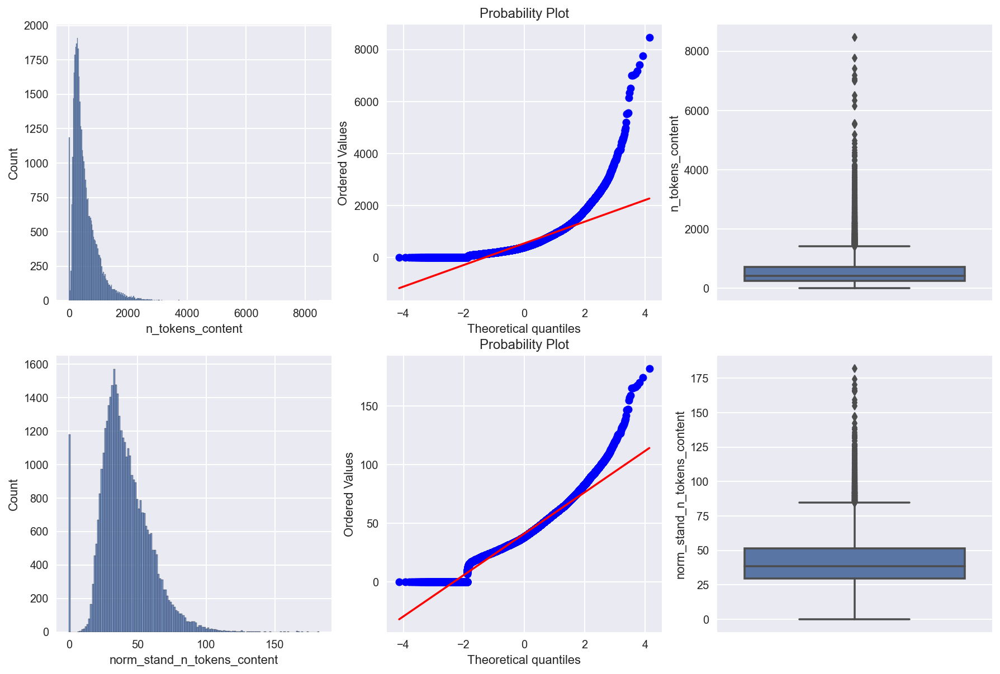

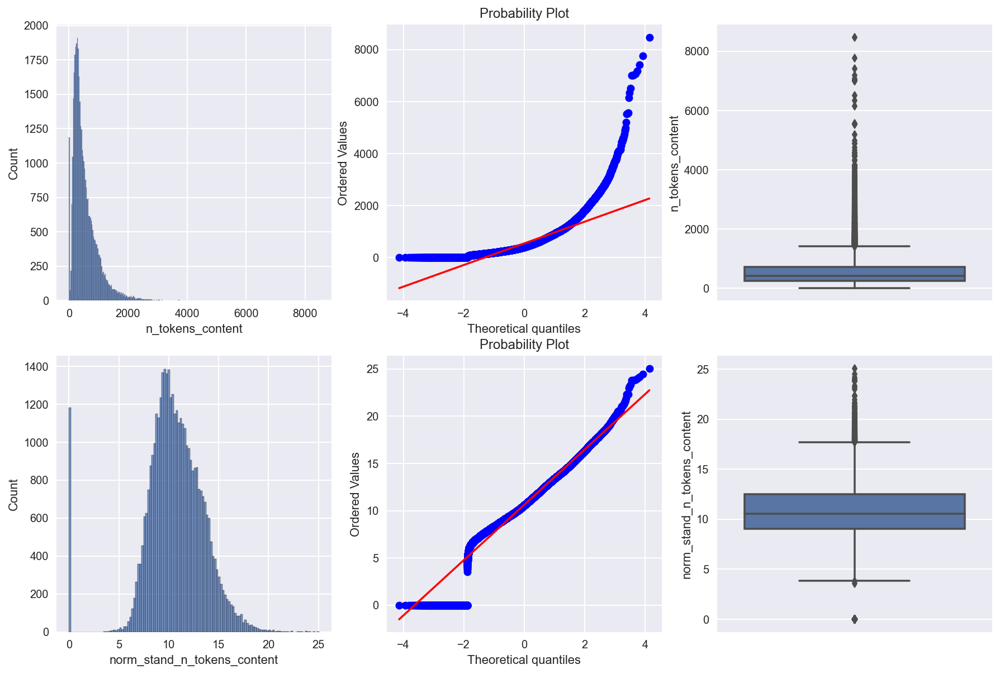

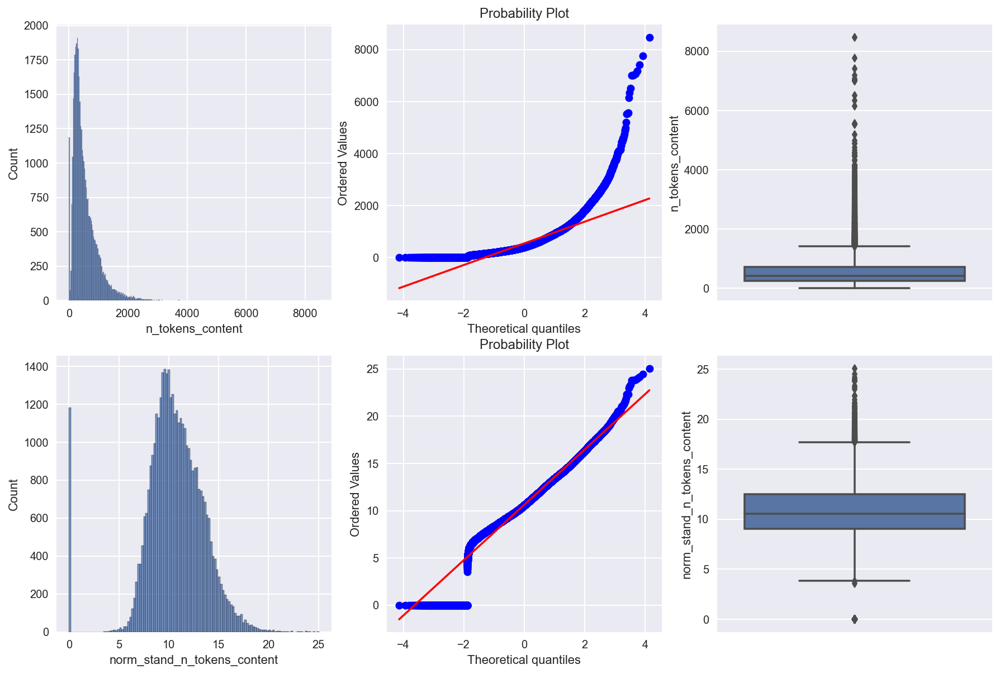

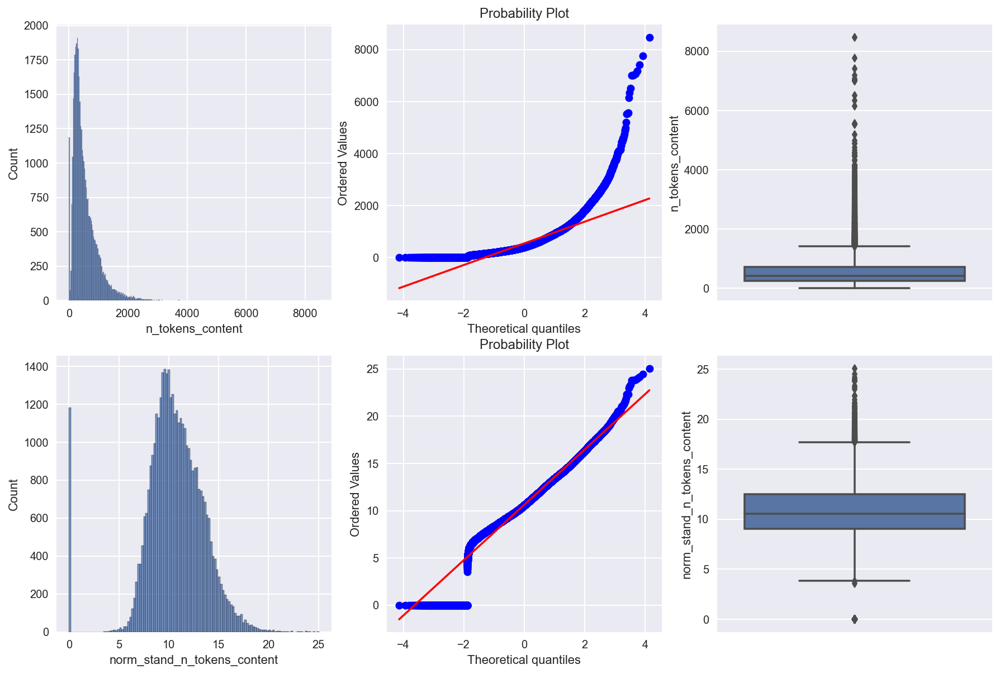

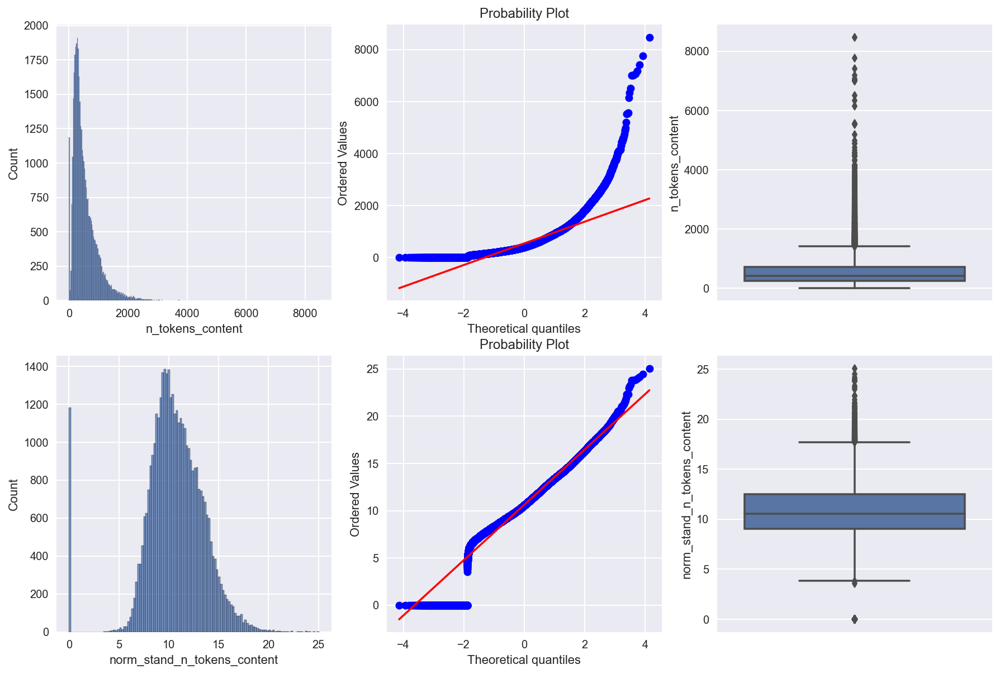

...

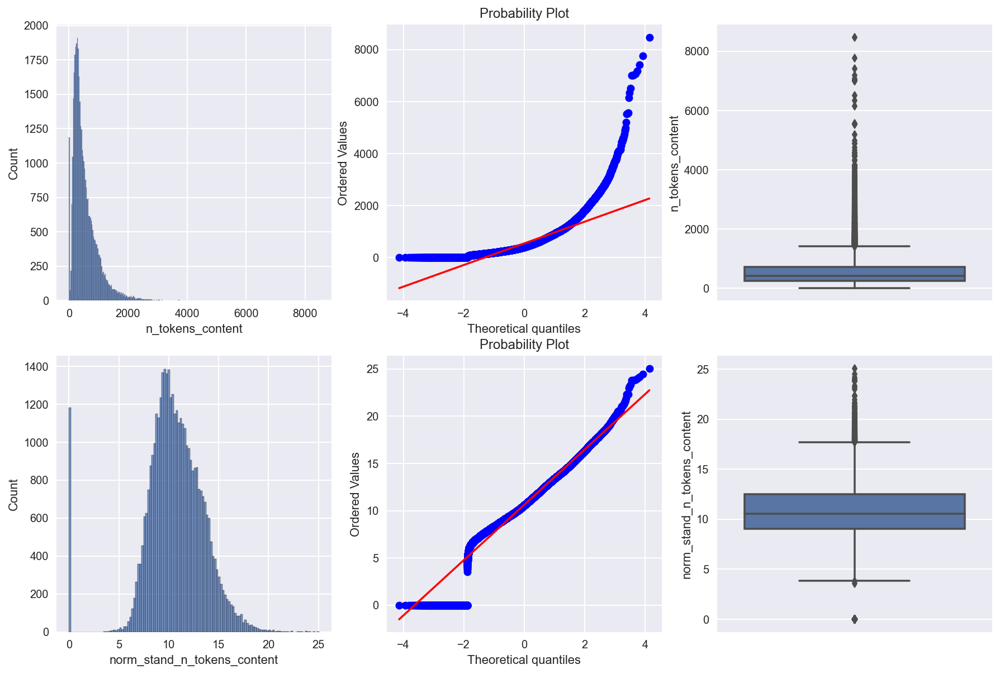

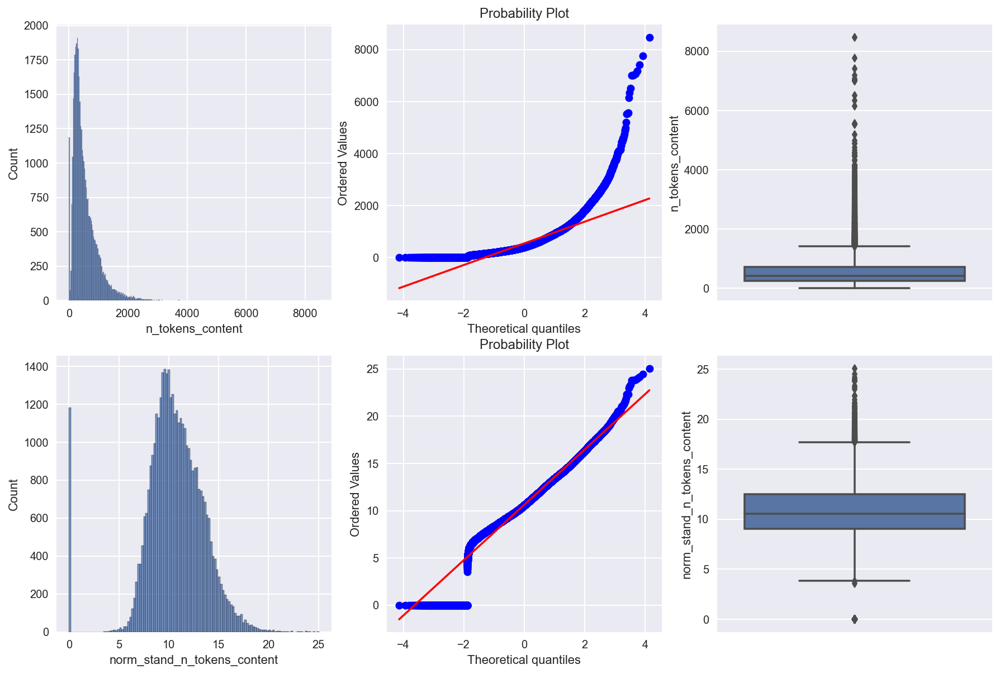

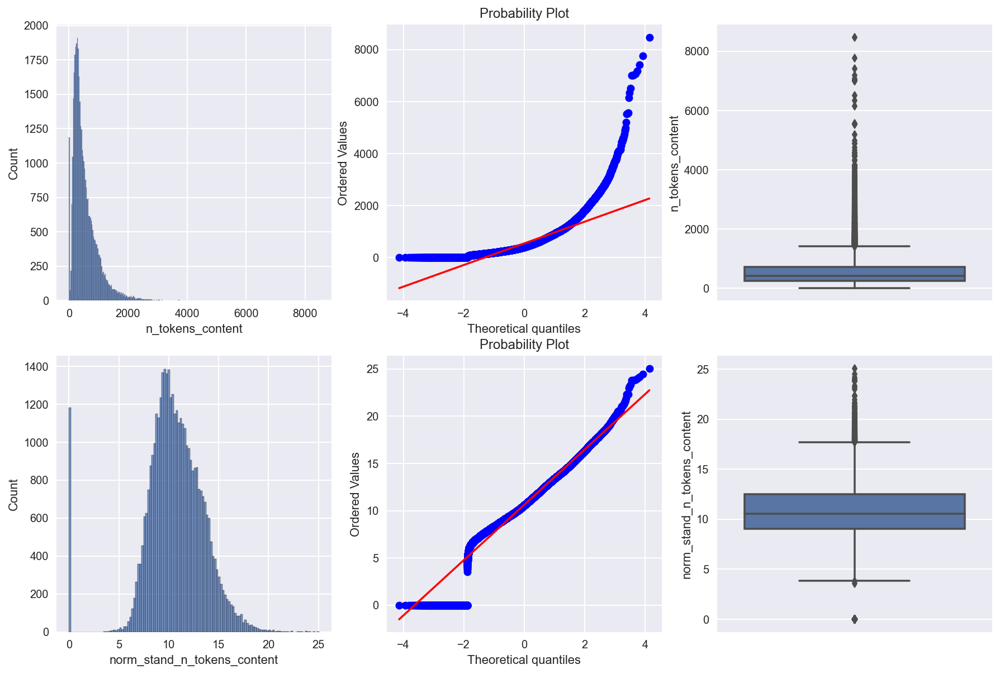

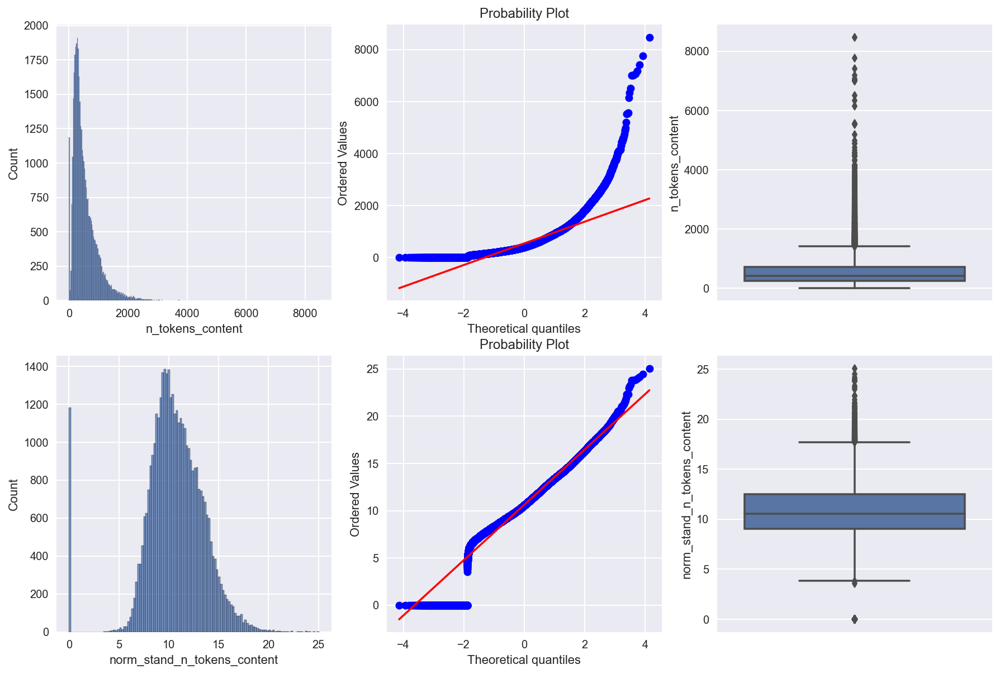

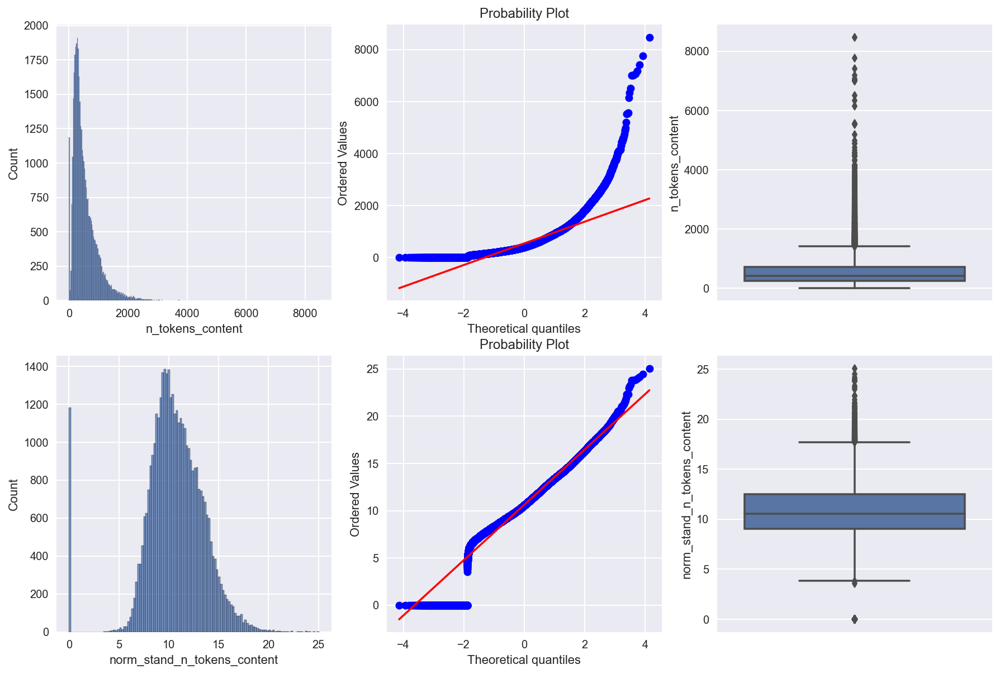

In [99]:
#boxcox_transfer(news_df, "n_tokens_content", lmbda = 0.5, original_df = df, show_plot = True)

for col in list(right_skewed_cols + left_skewed_cols):
    news_df[col] = boxcox_transfer(news_df, "n_tokens_content", lmbda = 0.5, original_df = df, show_plot = True)

From above probability plot we can see that these skewed variables became more normal distribution.

### Standardization

standardize all numerical variables.

In [100]:
std = preprocessing.StandardScaler()
fitted = std.fit_transform(news_df[new_numeric_cols])
news_df = news_df.assign(**{c:fitted[:,i] for i, c in enumerate(right_skewed_cols)})

After standardize all numerical vairable, I will re-run the exploratory data analysis.

### Re-run Exploratory Data Analysis

Using histogram and box plot to view the numerical variables

Because these numerical variables can be groupped into different groups, I will explore them as group.

In [109]:
# Draw the box plots for numerical variables
def draw_multi_boxs(cols, rs = 4, cs = 4):
    plt.figure(figsize = (15, 10))
    for i, col in enumerate(cols):
        plt.subplot(rs, cs, i + 1)
        #sns.distplot(df[col], color = 'r', kde = True)
        sns.boxplot(data=news_df,y=col,orient="v")
        plt.grid()
        plt.tight_layout()

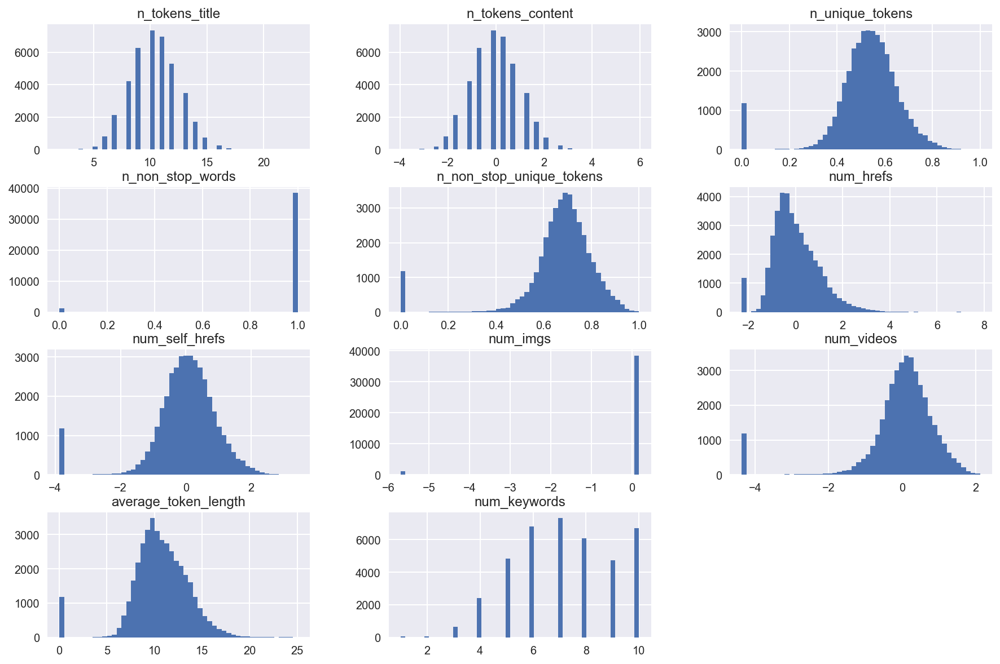

In [103]:
# draw the histogram for variables
news_df[['n_tokens_title', 'n_tokens_content',
       'n_unique_tokens', 'n_non_stop_words', 'n_non_stop_unique_tokens',
       'num_hrefs', 'num_self_hrefs', 'num_imgs', 'num_videos',
       'average_token_length', 'num_keywords']].hist(bins=50, figsize=(15,10))
plt.show()

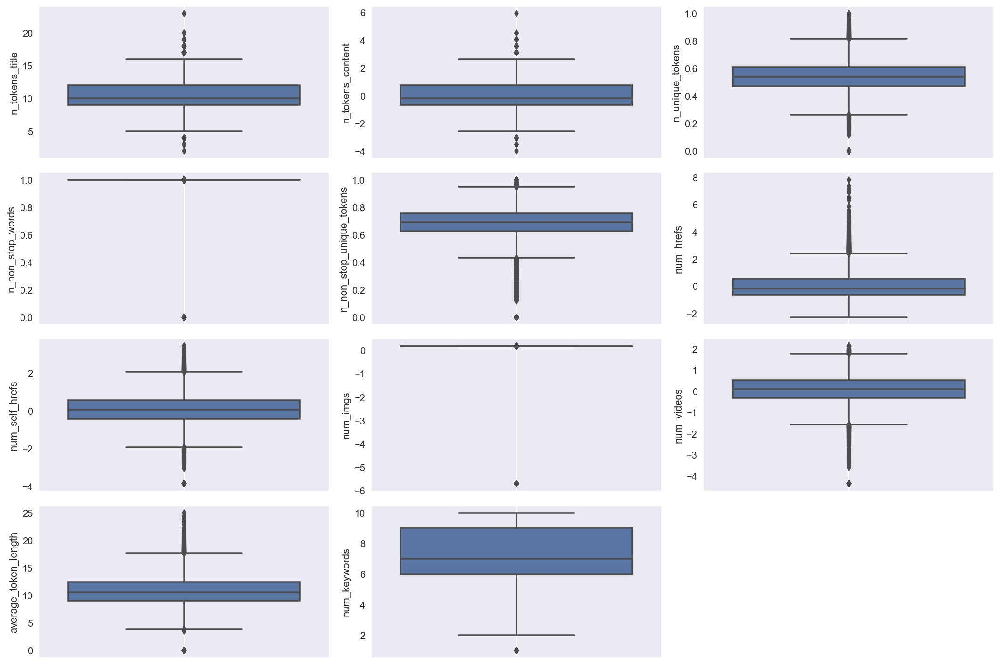

In [110]:
draw_multi_boxs(['n_tokens_title', 'n_tokens_content',
       'n_unique_tokens', 'n_non_stop_words', 'n_non_stop_unique_tokens',
       'num_hrefs', 'num_self_hrefs', 'num_imgs', 'num_videos',
       'average_token_length', 'num_keywords'], 4, 3)

These tokens and nums variables are normal distribution.

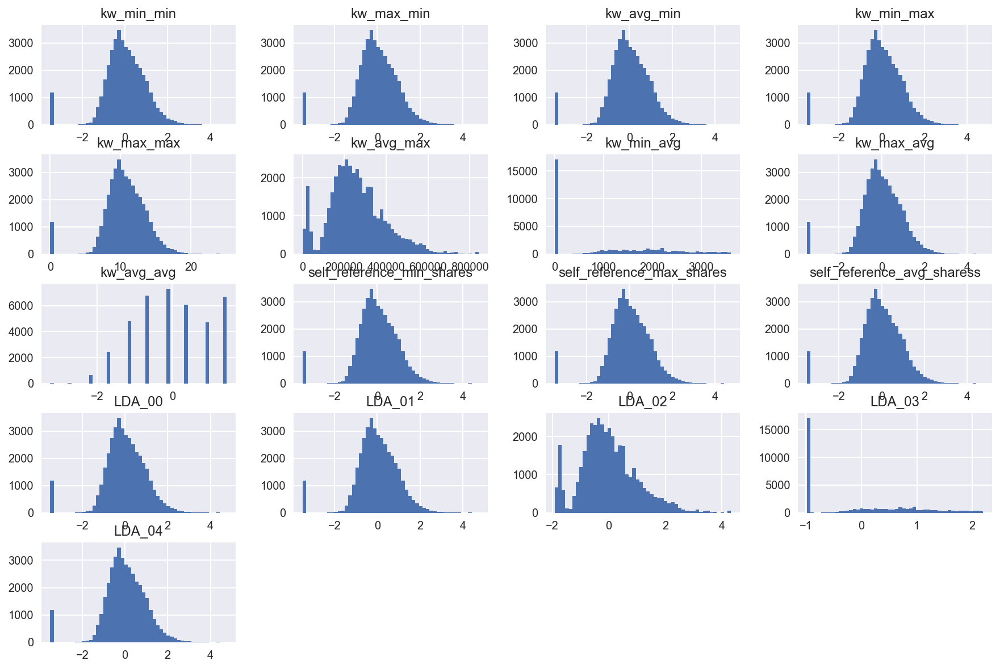

In [108]:
# draw the histogram for variables
news_df[['kw_min_min', 'kw_max_min', 'kw_avg_min',
       'kw_min_max', 'kw_max_max', 'kw_avg_max', 'kw_min_avg', 'kw_max_avg',
       'kw_avg_avg', 'self_reference_min_shares', 'self_reference_max_shares',
       'self_reference_avg_sharess', 'LDA_00',
       'LDA_01', 'LDA_02', 'LDA_03', 'LDA_04']].hist(bins=50, figsize=(15,10))
plt.show()

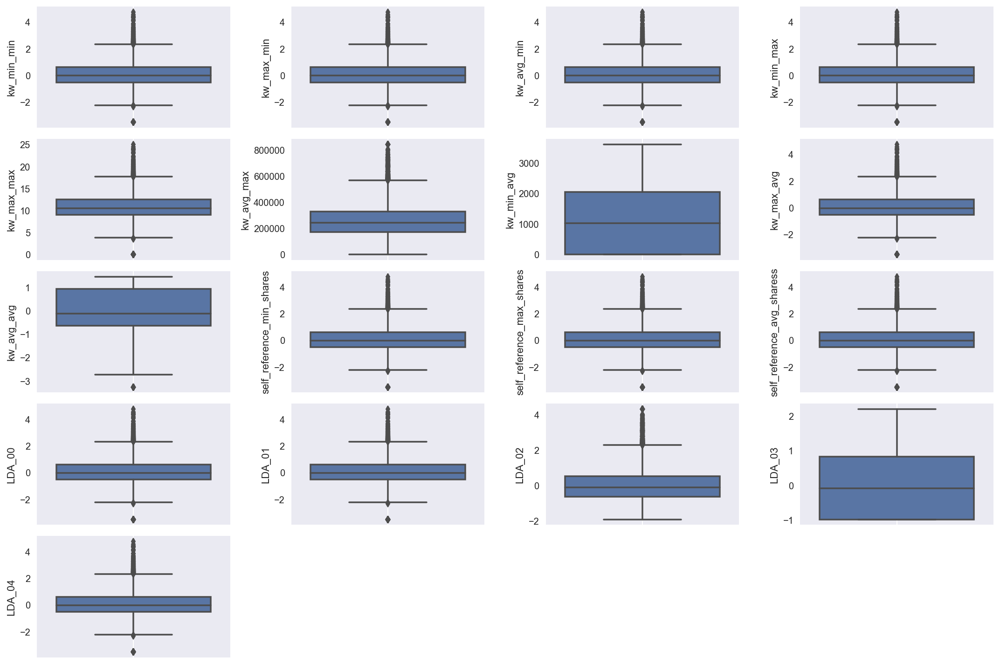

In [111]:
draw_multi_boxs(['kw_min_min', 'kw_max_min', 'kw_avg_min',
       'kw_min_max', 'kw_max_max', 'kw_avg_max', 'kw_min_avg', 'kw_max_avg',
       'kw_avg_avg', 'self_reference_min_shares', 'self_reference_max_shares',
       'self_reference_avg_sharess', 'LDA_00',
       'LDA_01', 'LDA_02', 'LDA_03', 'LDA_04'], 5, 4)

These kw*, self* and LDA* variables are normal distribution.

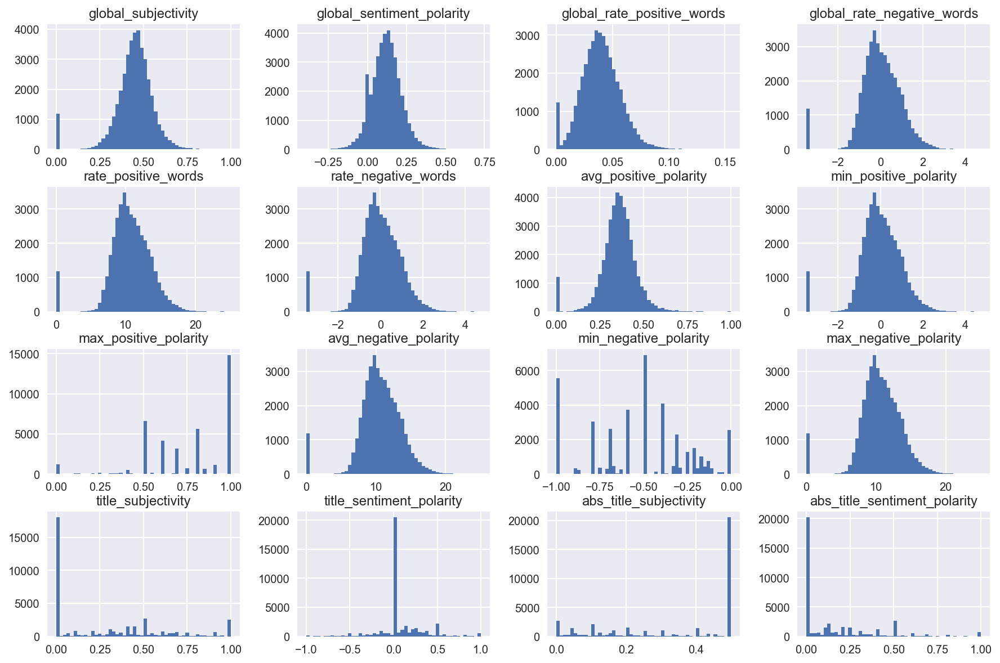

In [112]:
# draw the histogram for variables
news_df[['global_subjectivity',
       'global_sentiment_polarity', 'global_rate_positive_words',
       'global_rate_negative_words', 'rate_positive_words',
       'rate_negative_words', 'avg_positive_polarity', 'min_positive_polarity',
       'max_positive_polarity', 'avg_negative_polarity',
       'min_negative_polarity', 'max_negative_polarity', 'title_subjectivity',
       'title_sentiment_polarity', 'abs_title_subjectivity',
       'abs_title_sentiment_polarity']].hist(bins=50, figsize=(15,10))
plt.show()

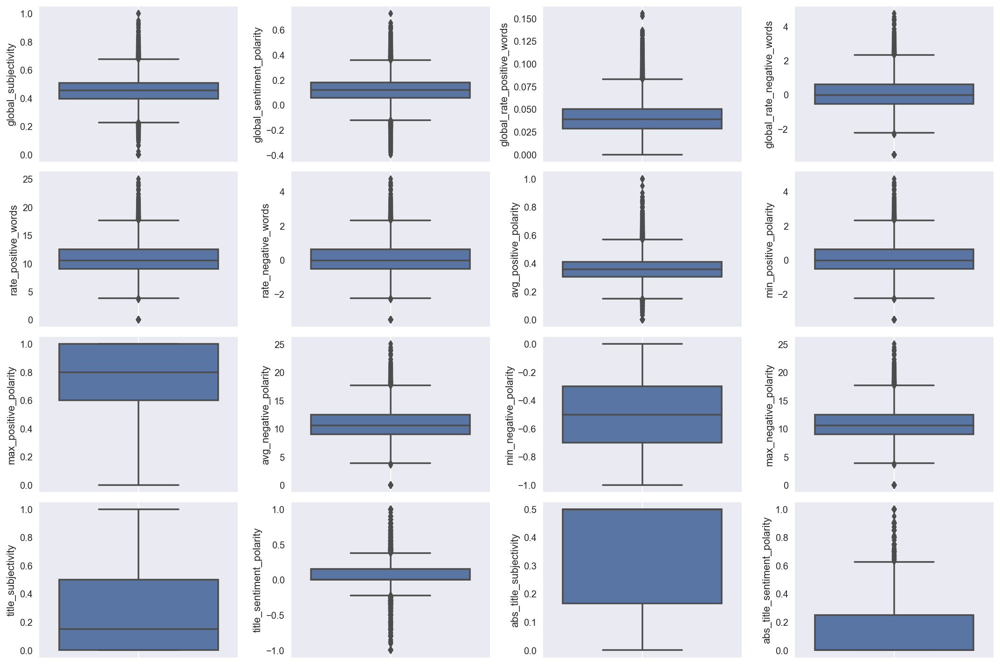

In [113]:
draw_multi_boxs(['global_subjectivity',
       'global_sentiment_polarity', 'global_rate_positive_words',
       'global_rate_negative_words', 'rate_positive_words',
       'rate_negative_words', 'avg_positive_polarity', 'min_positive_polarity',
       'max_positive_polarity', 'avg_negative_polarity',
       'min_negative_polarity', 'max_negative_polarity', 'title_subjectivity',
       'title_sentiment_polarity', 'abs_title_subjectivity',
       'abs_title_sentiment_polarity'], 4, 4)

These global_*, rate_*, avg_* min_* and max_* variables are normal distribution.

Next, I will annlyze the new response and these numerical variables.

### Determine whether or not there is a statistically significant difference between the new response (the means of three or more independent groups) and numerical variables.

### Boxplots Method

boxplots. If your data are weakly correlated, there will be a lot of overlap between the boxes. 

https://stats.stackexchange.com/questions/484299/how-to-check-the-correlation-between-categorical-and-numeric-independent-variabl

__weakly correlated:__ overlap

![jupyter](https://raw.githubusercontent.com/Yuehao-Wang/DAV-6150/5e1d8cf060197ac4a39f895b5b0873f46141ffbe/pic/M13_boxplots_weakly_correlation.png)

__Strongly correlated:__ un-overlap
![jupyter](https://github.com/Yuehao-Wang/DAV-6150/blob/5e1d8cf060197ac4a39f895b5b0873f46141ffbe/pic/M13_boxplots_strongly_correlated.png?raw=true)

https://bookdown.org/jhvdz1/dataanalytics/association-analysis.html

### Statistic Method

- __Methed 1)__ One-Way ANOVA (In this study, I will select this method.)

https://www.statology.org/one-way-anova-python/

An example to __interpret the results__.

A one-way ANOVA uses the following null and alternative hypotheses:

H0 (null hypothesis): μ1 = μ2 = μ3 = … = μk (all the population means are equal)

H1 (null hypothesis): at least one population mean is different from the rest

The F test statistic is 2.3575 and the corresponding p-value is 0.1138. Since the p-value is not less than .05, we fail to reject the null hypothesis.

This means we do not have sufficient evidence to say that there is a difference in exam scores among the three studying techniques.


- __Methed 2)__ Kruskal-Wallis Test

https://www.statology.org/kruskal-wallis-test-python/



#### Using boxplots to view the correlation between numerical variables and response

In [116]:
# Draw the box plots for numerical variables
def draw_multi_boxs_vs_response(cols, response, rs = 4, cs = 4):
    plt.figure(figsize = (15, 10))
    for i, col in enumerate(cols):
        plt.subplot(rs, cs, i + 1)
        #sns.distplot(df[col], color = 'r', kde = True)
        sns.boxplot(data=news_df,y=col,x=response, orient="v")
        plt.grid()
        plt.tight_layout()

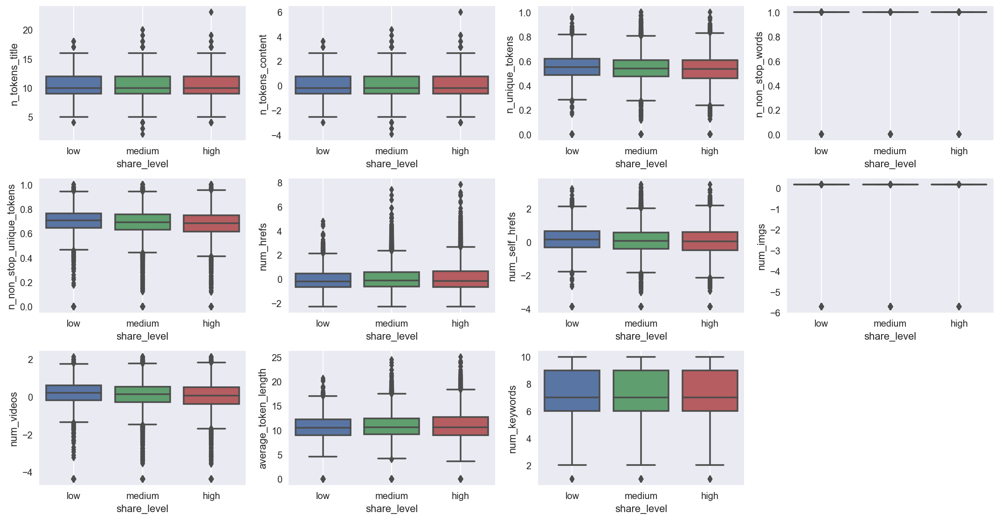

In [117]:
draw_multi_boxs_vs_response(['n_tokens_title', 'n_tokens_content',
       'n_unique_tokens', 'n_non_stop_words', 'n_non_stop_unique_tokens',
       'num_hrefs', 'num_self_hrefs', 'num_imgs', 'num_videos',
       'average_token_length', 'num_keywords'], 'share_level')

I can not find strongly correlated numerical variables from above boxplots.

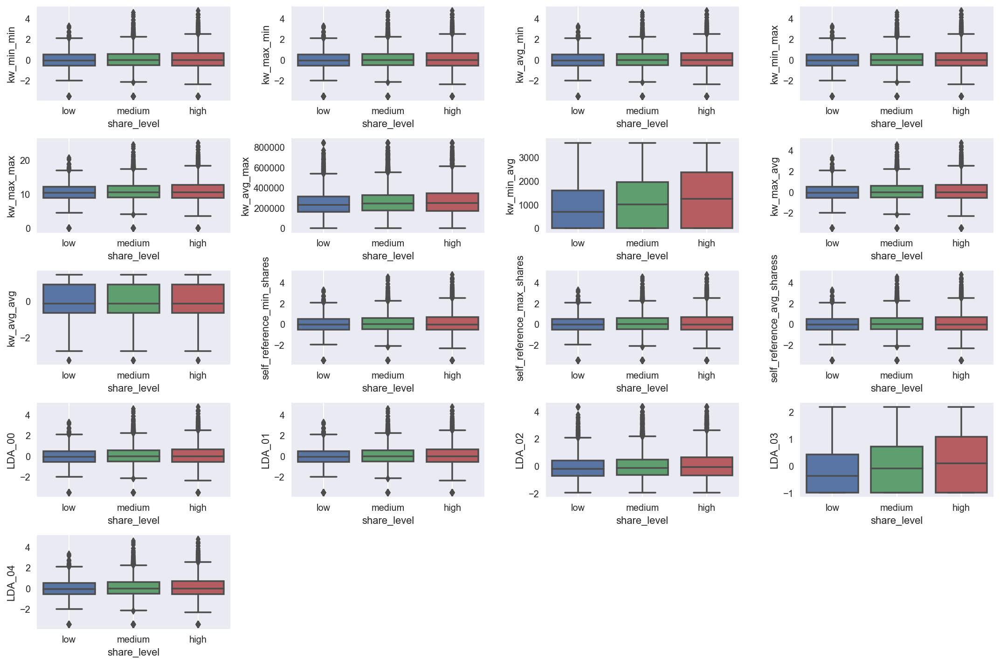

In [118]:
draw_multi_boxs_vs_response(['kw_min_min', 'kw_max_min', 'kw_avg_min',
       'kw_min_max', 'kw_max_max', 'kw_avg_max', 'kw_min_avg', 'kw_max_avg',
       'kw_avg_avg', 'self_reference_min_shares', 'self_reference_max_shares',
       'self_reference_avg_sharess', 'LDA_00',
       'LDA_01', 'LDA_02', 'LDA_03', 'LDA_04'], 'share_level',  5, 4)

The kw_min_avg and LDA_03 do not overlap too much. They might predict the response.

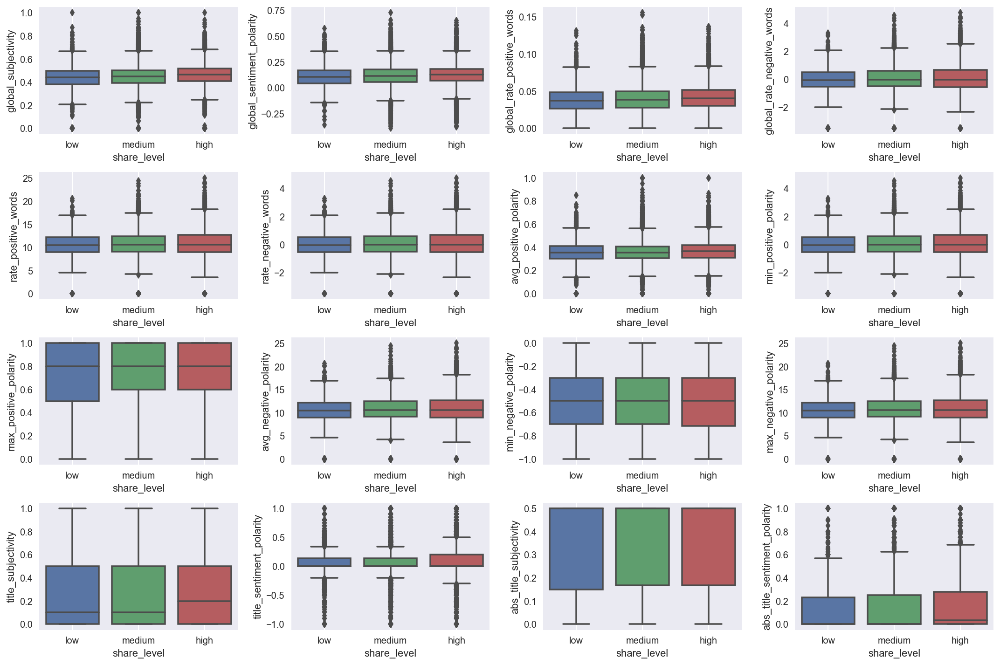

In [119]:
draw_multi_boxs_vs_response(['global_subjectivity',
       'global_sentiment_polarity', 'global_rate_positive_words',
       'global_rate_negative_words', 'rate_positive_words',
       'rate_negative_words', 'avg_positive_polarity', 'min_positive_polarity',
       'max_positive_polarity', 'avg_negative_polarity',
       'min_negative_polarity', 'max_negative_polarity', 'title_subjectivity',
       'title_sentiment_polarity', 'abs_title_subjectivity',
       'abs_title_sentiment_polarity'], 'share_level')

The max_positive_polarity does not overlap too much. They might predict the response.

#### Using One-Way ANOVA to view the correlation between numerical variables and response

In [135]:
from scipy.stats import f_oneway

def my_f_oneway(cols, significate = 0.05):
    names = []
    statistics = []
    pvalues = []
    
    for col in cols:
        lows_ = news_df[col][news_df['share_level'] == 'low']
        medium_ = news_df[col][news_df['share_level'] == 'medium']
        high_ = news_df[col][news_df['share_level'] == 'high']
        
        statistic, pvalue  = f_oneway(lows_, medium_, high_)
        
        if (pvalue < significate):
            names.append(col)
            statistics.append(statistic)
            pvalues.append(float(pvalue))

        
    dic = {"col_name": names, "statistics" : statistics, "pvalues": pvalues}
    return pd.DataFrame(dic)

oneways = my_f_oneway(new_numeric_cols)

# only show the top 5 statistics and pvalue < 0.05
oneways.sort_values(by='statistics', ascending=False)[:5]

,col_name,statistics,pvalues
26,LDA_03,213.674928,4.998131e-93
17,kw_min_avg,213.674928,4.998131e-93
28,global_subjectivity,89.201621,2.224043e-39
10,num_keywords,79.140979,4.988247e-35
19,kw_avg_avg,79.140979,4.988247e-35


From above oneway table, we can see that LDA_03 and kw_min_avg have the highest statistics and pvalue less than 0.05

#### Summary
The boxplots show that LDA_03, kw_min_avg and max_positive_polarity might predict the new response.

The oneway table show that LDA_03 and kw_min_avg might predict the new response.

I will select LDA_03 and kw_min_avg to predict the models

### View the Relationship between categories and response (categorical response)

https://bookdown.org/jhvdz1/dataanalytics/association-analysis.html

Common ways to examine relationships between two categorical variables:

- Graphical: clustered bar chart; stacked bar chart
- Descriptive statistics: cross tables
- Metric to measure the strength of the relation:
  - phi coefficent, in case of two binary variables
  - Cramer’s V

    see: http://groups.chass.utoronto.ca/pol242/Labs/LM-3A/LM-3A_content.htm and use http://vassarstats.net menu ‘frequency data’ for calculations

- Hypotheses testing:
  - tests on difference between proportions
  - chi-square tests a test to test if two categorical variables are independent




In this study, I will use bar chart and Chi-Square Test to examine the Relationship between categories and response (categorical response)

- Chi-Square Test
    
    https://www.statology.org/chi-square-test-of-independence-python/
    
    A Chi-Square Test of Independence is used to determine whether or not there is a significant association between two categorical variables.
    
    __Example:__
    
    Recall that the Chi-Square Test of Independence uses the following null and alternative hypotheses:

    H0: (null hypothesis) The two variables are independent.
    
    H1: (alternative hypothesis) The two variables are not independent.
    
    Since the p-value (.649) of the test is not less than 0.05, we fail to reject the null hypothesis. This means we do not have sufficient evidence to say that there is an association between Category A and Category B preference.

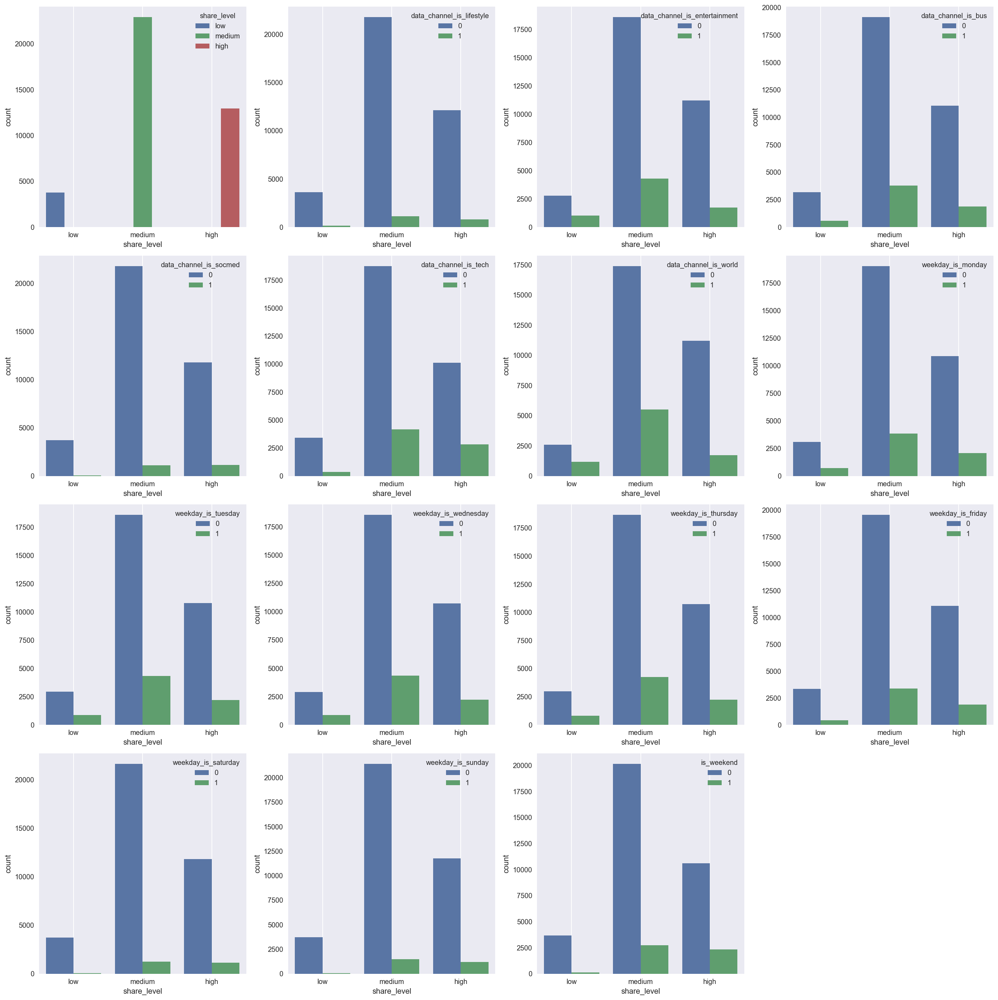

In [138]:
# To use bar charts to compare pairs of variables between Response and Explanatory
plt.figure(figsize = (20, 20))
for i, col in enumerate(list(['share_level'] + dummy_cols)):
    plt.subplot(4, 4, i + 1)
    # sns.countplot(x=col, data=re_eda_df, color='blue')
    sns.countplot(x='share_level', hue=col, data=news_df)
    plt.grid()
    plt.tight_layout()

From the above bar plots, We can see the data_channel_is_(entertainment, bus, tech, world) and weekday_is_(tuesday, wednesday, thursday) have more frequency of 1 than competitors. They could be used to perdict the response.

In [152]:
# Run the Chi2 test
import scipy.stats as stats

def my_chi2_test(cols, significate = 0.05):
    names = []
    statistics = []
    pvalues = []
    dgs = []
    
    for col in cols:
        
        # create cross table
        crs_tb = pd.crosstab(news_df['share_level'], news_df[col])
        
        #perform the Chi-Square Test of Independence
        statistic, pvalue, Degrees, expected = stats.chi2_contingency(crs_tb.to_numpy())
        
        if (pvalue < significate):
            names.append(col)
            statistics.append(statistic)
            pvalues.append(float(pvalue))
            dgs.append(Degrees)

        
    dic = {"col_name": names, "statistics" : statistics, "pvalues": pvalues, "degrees":dgs}
    return pd.DataFrame(dic)

category_chi2 = my_chi2_test(dummy_cols)

# only show the top 5 statistics and pvalue < 0.05
category_chi2.sort_values(by='statistics', ascending=False)[:5]

,col_name,statistics,pvalues,degrees
5,data_channel_is_world,810.451584,1.029614e-176,2
13,is_weekend,656.638304,2.587046e-143,2
1,data_channel_is_entertainment,394.715439,1.943710e-86,2
3,data_channel_is_socmed,361.503312,3.166309e-79,2
11,weekday_is_saturday,327.562654,7.424606e-72,2


From the above chi2 table, We can see the data_channel_is_world, is_weekend, data_channel_is_entertainment, data_channel_is_socmed and weekday_is_saturday have higher value than competitors. They could be used to perdict the response.

### Summary of Re-run EDA

I use the box plots and One-Way ANOVA to determine the correlation between Response(category) and Numerical Variables.

- The boxplots show that LDA_03, kw_min_avg and max_positive_polarity might predict the new response.

- The One-Way ANOVA table show that LDA_03 and kw_min_avg might predict the new response.

-  LDA_03 and kw_min_avg can be used to predict the models

I use the bar plots and Chi-Square to determine the correlation between Response(category) and Categorical Variables.

- The bar plots show that the data_channel_is_(entertainment, bus, tech, world) and weekday_is_(tuesday, wednesday, thursday) have more frequency of 1 than competitors.

- The chi2 table show that the data_channel_is_world, is_weekend, data_channel_is_entertainment, data_channel_is_socmed and weekday_is_saturday have higher value than competitors.

- data_channel_is_entertainment and weekday_is_saturday can be used to predict the models


### Dummy categories (All categories are binary, do not need dummy them)

### Encode Response

In [208]:
# convert low, medium, high to 0, 1, 2
news_df['share_level'] = news_df['share_level'].map({'low':0, 'medium':1, 'high':2})

### Split data set

In [209]:
def get_train_test_X_y(data_df, y_col, size=0.3, std_cols=None):
    y = data_df[y_col]
    X = data_df.drop(columns=y_col)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=size, random_state=42)

    return X_train, X_test, y_train, y_test

In [210]:
X_train, X_test, y_train, y_test = get_train_test_X_y(news_df, "share_level")

In [211]:
# check
X_train.head(3)

,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,average_token_length,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_bus,data_channel_is_socmed,data_channel_is_tech,data_channel_is_world,kw_min_min,kw_max_min,kw_avg_min,kw_min_max,kw_max_max,kw_avg_max,kw_min_avg,kw_max_avg,kw_avg_avg,self_reference_min_shares,self_reference_max_shares,self_reference_avg_sharess,weekday_is_monday,weekday_is_tuesday,weekday_is_wednesday,weekday_is_thursday,weekday_is_friday,weekday_is_saturday,weekday_is_sunday,is_weekend,LDA_00,LDA_01,LDA_02,LDA_03,LDA_04,global_subjectivity,global_sentiment_polarity,global_rate_positive_words,global_rate_negative_words,rate_positive_words,rate_negative_words,avg_positive_polarity,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,norm_stand_n_tokens_content
28553,9.0,-0.661669,0.000000,0.0,0.000000,-2.289400,-3.869498,-5.706778,-4.367866,0.000000,7.0,0,1,0,0,0,0,-3.500165,-3.500165,-3.500165,-3.500165,0.000000,544128.571429,3172.782591,-3.500165,-0.117212,-3.500165,-3.500165,-3.500165,0,0,1,0,0,0,0,0,-3.500165,-3.500165,2.108399,1.807280,-3.500165,0.000000,0.000000,0.000000,-3.500165,0.000000,-3.500165,0.000000,-3.500165,0.0,0.000000,0.0,0.000000,0.0,0.0,0.5,0.0,0.000000
6286,9.0,-0.661669,0.497970,1.0,0.689655,0.632981,-0.237594,0.175230,0.109449,12.640953,6.0,0,0,0,0,1,0,0.661364,0.661364,0.661364,0.661364,12.640953,142483.333333,1900.000000,0.661364,-0.641010,0.661364,0.661364,0.661364,0,0,0,1,0,0,0,0,0.661364,0.661364,-0.864510,0.688289,0.661364,0.535472,0.101292,0.033602,0.661364,12.640953,0.661364,0.424521,0.661364,0.8,12.640953,-0.6,12.640953,0.9,0.8,0.4,0.8,12.640953
36285,12.0,0.757425,0.503268,1.0,0.675603,0.375727,-0.198955,0.175230,0.018222,11.994282,7.0,0,0,0,0,1,0,0.448474,0.448474,0.448474,0.448474,11.994282,230385.714286,0.000000,0.448474,-0.117212,0.448474,0.448474,0.448474,0,0,0,1,0,0,0,0,0.448474,0.448474,-0.213872,-0.982131,0.448474,0.436591,0.168410,0.059390,0.448474,11.994282,0.448474,0.360163,0.448474,1.0,11.994282,-0.7,11.994282,0.1,0.2,0.4,0.2,11.994282


In [212]:
# check
y_train.value_counts()

1    16042
2     9094
0     2614
Name: share_level, dtype: int64

In [213]:
# X_train.info()

### Up-sampling the Test set

In [214]:
# import lib
from imblearn.over_sampling import SMOTENC

# [11, 12] are indexs of ['data_channel_is_lifestyle', 'data_channel_is_entertainment']
smote_nc = SMOTENC(categorical_features=[11,12,13,14,15,16,29,30,31,32,33,34,35,36], random_state=13)
X_train, y_train = smote_nc.fit_resample(X_train, y_train)

In [215]:
# check
X_train['data_channel_is_world'].value_counts()

0    38640
1     9486
Name: data_channel_is_world, dtype: int64

In [216]:
# check
y_train.value_counts()

2    16042
1    16042
0    16042
Name: share_level, dtype: int64

The test set is balance now.

# 6. Feature selecting
- Create a baseline
- Using different methods to select features
  - Based EDA

  - filter
	- mutual_info

  - Embedded
	- AdaBoostClassifier
    - Random Forest

- Compare each methods

Define a function. It uses k-fold and Logistic Regression to calculate Accuracy, because the response is balanced.

In [217]:
# load the LogisticRegression() function from sklearn
from sklearn.linear_model import LogisticRegression
# load the cross_val_score function from the sklearn.model_selection module
from sklearn.model_selection import cross_val_score

# using k-fold to validate. Return avg of r^2
def logistic_regression_cross_accuracy(X, y, name, show = True):
    # Assing the model function you want to use to a variable
    model = LogisticRegression(solver='lbfgs', max_iter=1000)

    # fit the model using 5-fold cross validation; note how the 'model' variable created above is used as a parameter for the 
    # cross_val_score() function. Also note how we can specify the number of folds to use during cross validation via the 'cv' 
    # parameter
    model_scores = cross_val_score(model, X, y, cv=5)

    if show == True:
        # calculate the average R^2 across all 10 folds
        print('The average Accuracy of %s model is %.4f' %(name, np.mean(model_scores)))

        # print out the R^2 metrics derived from the K-fold cross validation of our linear regression model
        print('The Accuracy metrics derived from the K-fold cross validation as followed:')
        print(model_scores)
    
    return np.mean(model_scores)

Using a list to store results of different feature selection models

In [218]:
# create a list to story feature seletion result of different method
# {name = 'name', avg_r2 = 0.1, selected_features = ['a1','a2']}
features_selection_list = []

def set_info(name, avg_accuracy, cols):
    a = {"name" : name, "avg_accuracy" : avg_accuracy, "selected_features" : cols}
    
    features_selection_list.append(a)

### Create a baseline

Before I use seletion models to select features, I used all variables to train a Logistic Regression then I got an Avg. Accuracy. It's my Baseline.

Using all variables as X_train to train a Logistic Regression model.

In [219]:
# Baseline Model
baseline_avg_score = logistic_regression_cross_accuracy(X_train, y_train, "Baseline")

# set info into features_selection_list
set_info('Baseline', baseline_avg_score, X_train.columns)

The average Accuracy of Baseline model is 0.3658
The Accuracy metrics derived from the K-fold cross validation as followed:
[0.36744234 0.36550649 0.36706494 0.36488312 0.36405195]


### Using different methods to select features

#### Based EDA

From the re-run EDA, I select the LDA_03, kw_min_avg, data_channel_is_entertainment and weekday_is_saturday to be the selection feature, because they have the highest statistic value in the Oneway ANOVA and the Chi2.

In [220]:
eda_features = ['LDA_03', 'kw_min_avg', 'data_channel_is_entertainment', 'weekday_is_saturday']

In [221]:
# EDA Model
eda_avg_score = logistic_regression_cross_accuracy(X_train[eda_features], y_train, "Based EDA")

# set info into eda_features
set_info('Based EDA', eda_avg_score, eda_features)

The average Accuracy of Based EDA model is 0.3797
The Accuracy metrics derived from the K-fold cross validation as followed:
[0.37066279 0.37776623 0.38067532 0.38171429 0.38753247]


In [222]:
print("The Avg. of Based EDA higher than Baseline %.4f " %( ( eda_avg_score - baseline_avg_score)))

The Avg. of Based EDA higher than Baseline 0.0139 


###  Using filter method to select features

f_regression: Univariate linear regression tests returning f-statistic and p-values

r_regression: Pearson (sk-learn 1.0)

mutual_info_regression : Mutual information for a continuous target.

mutual_info_classif : Estimate mutual information for a discrete (category) target variable.

f_classif : ANOVA F-value between label/feature for classification tasks.

chi2 : Chi-squared stats of non-negative features for classification tasks.

- VarianceThreshold
- r_regression

https://scikit-learn.org/0.24/modules/generated/sklearn.feature_selection.SelectKBest.html?highlight=selectkbest#sklearn.feature_selection.SelectKBest

https://scikit-learn.org/stable/modules/feature_selection.html#
https://scikit-learn.org/stable/modules/classes.html#module-sklearn.feature_selection

#### Filter method - mutual_info_classif

Estimate mutual classification for a category target variable.

Mutual information between two random variables is a non-negative value, which measures the dependency between the variables. It is equal to zero if and only if two random variables are independent, and higher values mean higher dependency.

In [223]:
from sklearn.feature_selection import mutual_info_classif
from sklearn.feature_selection import SelectKBest

selector = SelectKBest(mutual_info_classif)
X_train_new = selector.fit_transform(X_train, y_train)  #Applying transformation to the training set

#to get names of the selected features
mask = selector.get_support()     # Output   array([False, False,  True,  True,  True, False ....])

#print(selector.scores_)     #Output array([0.16978127, 0.01829886, 0.45461366, 0.55126343, 0.66081217, 0.27715287 ....])

new_features = X_train.columns[mask]

# print(new_features)   #Output Index(['name1', 'name2'],dtype='object')
print(X_train_new.shape)

# avg score
mutual_info_regression_avg_score = logistic_regression_cross_accuracy(X_train_new, y_train, "mutual_info_classif")

# set info into features_selection_list
set_info('Filter - mutual_info_classif', mutual_info_regression_avg_score, new_features)

(48126, 10)
The average Accuracy of mutual_info_classif model is 0.3650
The Accuracy metrics derived from the K-fold cross validation as followed:
[0.3564305  0.36862338 0.36987013 0.36696104 0.36311688]


In [224]:
print("The Avg. of mutual_info_classif lower than Baseline %.4f " 
      %( ( baseline_avg_score - mutual_info_regression_avg_score ) ))

The Avg. of mutual_info_classif lower than Baseline 0.0008 


### Using Embedded method to select features
- LassoLarsCV

#### Embedded - AdaBoostClassifier

In [225]:
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import AdaBoostClassifier
ada = AdaBoostClassifier().fit(X_train, y_train)

model_lasso = SelectFromModel(ada, prefit=True)
X_train_new = model_lasso.transform(X_train)

mask = model_lasso.get_support()
new_features = X_train.columns[mask] #Output Index(['name1', 'name2'],dtype='object')

print(X_train_new.shape)

# Embedded - AdaBoostClassifier Model
ada_avg_score = logistic_regression_cross_accuracy(X_train_new, y_train, "AdaBoostClassifier")

# set info into features_selection_list
set_info('Embedded - AdaBoostClassifier', ada_avg_score, new_features)

(48126, 22)
The average Accuracy of AdaBoostClassifier model is 0.3658
The Accuracy metrics derived from the K-fold cross validation as followed:
[0.36744234 0.36550649 0.36706494 0.36488312 0.36405195]


In [226]:
print("The Avg. of AdaBoostClassifier higher than Baseline %.4f " 
      %( ( ada_avg_score - baseline_avg_score )))

The Avg. of AdaBoostClassifier higher than Baseline 0.0000 


### Embedded - RandomForestClassifier

In [227]:
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import GradientBoostingClassifier,RandomForestClassifier

selector = SelectFromModel(RandomForestClassifier()).fit(X_train, y_train)

# selector.threshold_
new_features = X_train.columns[selector.get_support()]

X_train_new = selector.transform(X_train)

print(X_train_new.shape)

# X_train_new
forest_avg_score = logistic_regression_cross_accuracy(X_train_new, y_train, "RandomForestClassifier")

# set info into features_selection_list
set_info('Embedded - RandomForestClassifier', forest_avg_score, new_features)

(48126, 22)
The average Accuracy of RandomForestClassifier model is 0.3658
The Accuracy metrics derived from the K-fold cross validation as followed:
[0.36744234 0.36550649 0.36706494 0.36488312 0.36405195]


In [228]:
print("The Avg. of RandomForestClassifier lower than Baseline %.4f %%" 
      %( ( baseline_avg_score - forest_avg_score  ) / baseline_avg_score * 100))

The Avg. of RandomForestClassifier lower than Baseline 0.0000 %


### Compare each methods

In [229]:
for f in features_selection_list:
    print("R^2 = %.4f, features = %d, Methods Name : %s " %(f['avg_accuracy'], len(f['selected_features']), f['name']))

R^2 = 0.3658, features = 59, Methods Name : Baseline 
R^2 = 0.3797, features = 4, Methods Name : Based EDA 
R^2 = 0.3650, features = 10, Methods Name : Filter - mutual_info_classif 
R^2 = 0.3658, features = 22, Methods Name : Embedded - AdaBoostClassifier 
R^2 = 0.3658, features = 22, Methods Name : Embedded - RandomForestClassifier 


In [274]:
rf = features_selection_list[3]

In [275]:
rf['selected_features']

Index(['n_tokens_title', 'num_keywords', 'data_channel_is_lifestyle',
       'data_channel_is_entertainment', 'data_channel_is_bus',
       'data_channel_is_socmed', 'data_channel_is_tech',
       'data_channel_is_world', 'kw_avg_max', 'kw_min_avg', 'kw_avg_avg',
       'weekday_is_monday', 'weekday_is_tuesday', 'weekday_is_wednesday',
       'weekday_is_thursday', 'weekday_is_friday', 'is_weekend',
       'max_positive_polarity', 'min_negative_polarity', 'title_subjectivity',
       'abs_title_subjectivity', 'abs_title_sentiment_polarity'],
      dtype='object')

In [276]:
rf_features = rf['selected_features'].tolist()
len(rf_features)

22

### Summary
After comparing all feature selection methods, Based EDA has only 4 features and these features get a higher accuracy than Baseline with all variables.

I will use the 4 features to train 3 Neural Network Models

# 7. Neural Network Models

Train models by Based EDA feature selection.

In [240]:
# create validation set
model_X_train, model_X_valid, model_y_train, model_y_valid = train_test_split(X_train, y_train, test_size=0.3, random_state=42)

In [230]:
# TensorFlow ≥2.0 is required
import tensorflow as tf
assert tf.__version__ >= "2.0"

from tensorflow import keras

In [231]:
print(tf.__version__)
print(keras.__version__)

2.3.0
2.4.0


### Neural Network Model 1

Using the Sequential API to create a feed-forward nerual network

In [291]:
model1 = keras.models.Sequential()
model1.add(keras.layers.Flatten(input_shape=[4]))
model1.add(keras.layers.Dense(512, activation="relu"))
#model1.add(keras.layers.Dense(16, activation="relu"))
model1.add(keras.layers.Dense(3, activation="softmax"))

In [292]:
model1.summary()

Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_11 (Flatten)         (None, 4)                 0         
_________________________________________________________________
dense_31 (Dense)             (None, 512)               2560      
_________________________________________________________________
dense_32 (Dense)             (None, 3)                 1539      
Total params: 4,099
Trainable params: 4,099
Non-trainable params: 0
_________________________________________________________________


In [293]:
model1.compile(loss="sparse_categorical_crossentropy",
              optimizer="sgd",
              metrics=["accuracy"])

In [296]:
history1 = model1.fit(model_X_train[eda_features], model_y_train, epochs=100, batch_size=128,
                    validation_data=(model_X_valid[eda_features], model_y_valid))

Epoch 1/100
264/264 [==============================] - 0s 1ms/step - loss: 1.1061 - accuracy: 0.3472 - val_loss: 1.4822 - val_accuracy: 0.3582
Epoch 2/100
264/264 [==============================] - 0s 916us/step - loss: 1.1061 - accuracy: 0.3458 - val_loss: 1.4819 - val_accuracy: 0.3587
Epoch 3/100
264/264 [==============================] - 0s 935us/step - loss: 1.1060 - accuracy: 0.3450 - val_loss: 1.4818 - val_accuracy: 0.3582
Epoch 4/100
264/264 [==============================] - 0s 943us/step - loss: 1.1060 - accuracy: 0.3451 - val_loss: 1.4818 - val_accuracy: 0.3559
Epoch 5/100
264/264 [==============================] - 0s 972us/step - loss: 1.1059 - accuracy: 0.3445 - val_loss: 1.4814 - val_accuracy: 0.3582
Epoch 6/100
264/264 [==============================] - 0s 949us/step - loss: 1.1059 - accuracy: 0.3446 - val_loss: 1.4813 - val_accuracy: 0.3561
Epoch 7/100
264/264 [==============================] - 0s 934us/step - loss: 1.1058 - accuracy: 0.3407 - val_loss: 1.4809 - val_accu

### Neural Network Model 2
Using the Sequential API to create a back propagating nerual network

# 8. Conclustion

- If variables of data set have very low correlation values, we can drop outliers to increase correlation values.

- If variables of data set have very low correlation values, we can use RobustScaler to standardizate variables.

- If there are too many variables in a data set, we can pick out key variables that they can affect accurate of models than other variables.


- Feature selection

  - There are many selection methods. Before we choose a method to select feature, we must understand the scenarios for this model. If we pick up a wrong model, we will not only waste time but also get inaccurate results. For example, I used LinearSVC to select features. LinearSVC deals with muti-classification.


  - PCA
  
  It is easy to use but it is difficult to understand, because all variables has been transfered as new set.


  - filter

    - VarianceThreshold
      - It is easy to use but it is difficult to get a good accurate.
      
    - r_regression (Pearson)
      - It is easy to use.
      
    
    - mutual_info_regression
      - It will run a long time. Estimate mutual information for a continuous target variable.
    
    
  - Wrapper

    - RFE + LogisticRegression
    
      - It spends too much time. In this study, it can not get result.
  
  
  - Embedded

    - LinearSVC
    
      - It will spend more time than LassoLarsCV. It's very slow, because it deals with muti-classification.
      
    - LassoLarsCV **(The fastest and the most accurate)**
    
      - It is good for handing data that does not have correlation.
      
    - RandomForestClassifier
      - It is good for handing data that does not have correlation.
      - It will spend much time.
  

- Model evalution

  - I use 5-fold cross validation to train models. The 5-fold cross validation means that 20% of the data is used for testing. It can get pretty accurate.

# 9. Reference

machinelearningmastery.com. Feature selection. [online] Available at https://machinelearningmastery.com/feature-selection-with-real-and-categorical-data/ [Accessed 27 September 2021].


scikit-learn.org. scikit-learn document. [online] Available at https://scikit-learn.org/stable/ [Accessed 27 September 2021].

towardsdatascience.com. scikit-learn PCA. [online] Available at https://towardsdatascience.com/pca-using-python-scikit-learn-e653f8989e60 [Accessed 6 October 2021].

mikulskibartosz.name. PCA how to choose the number of components [online] Available at https://www.mikulskibartosz.name/pca-how-to-choose-the-number-of-components/ [Accessed 6 October 2021].



In [ ]:
def build_model(n_hidden=1, n_neurons=100, learning_rate=3e-3, input_shape=[10]):
    model = keras.models.Sequential()
    model.add(keras.layers.InputLayer(input_shape=input_shape))
    
    for layer in range(n_hidden):
        model.add(keras.layers.Dense(n_neurons, activation="relu"))
        
    model.add(keras.layers.Dense(3, activation="softmax"))
    
    optimizer = keras.optimizers.SGD(learning_rate=learning_rate)
    
    model.compile(loss="sparse_categorical_crossentropy", optimizer=optimizer, metrics=[keras.metrics.categorical_accuracy])
    return model

In [297]:
keras_haha = keras.wrappers.scikit_learn.KerasClassifier(build_model)

NameError: name 'build_model' is not defined

In [ ]:
keras_reg = keras.wrappers.scikit_learn.KerasClassifier(build_model)

In [ ]:
from scipy.stats import reciprocal
from sklearn.model_selection import RandomizedSearchCV

param_distribs = {
    #"n_hidden": [0, 1, 2, 3],
    "n_neurons": np.arange(30, 1000)               .tolist(),
    "learning_rate": reciprocal(3e-4, 3e-2)      .rvs(1000).tolist(),
}

rnd_search_cv = RandomizedSearchCV(keras_reg, param_distribs, n_iter=10, cv=3, verbose=2)

rnd_search_cv.fit(model_X_train[selected_features], model_y_train, epochs=300, batch_size=32,
                  validation_data=(model_X_valid[selected_features], model_y_valid),
                  callbacks=[keras.callbacks.EarlyStopping(patience=10)])

In [ ]:
rnd_search_cv.best_params_

In [ ]:
# Use the best parameters create the model

model1_best = keras.models.Sequential()
model1_best.add(keras.layers.Flatten(input_shape=[input_feature_length]))
model1_best.add(keras.layers.Dense(632, activation="relu"))
model1_best.add(keras.layers.Dense(3, activation="softmax"))

model1_best.summary()

In [ ]:
# create a early save point
checkpoint_cb1_best = keras.callbacks.ModelCheckpoint("my_keras_model1_best.h5", save_best_only=True)

# interrupt training early when there is no more progress (to avoid wasting time and resources):
early_stopping_cb1_best = keras.callbacks.EarlyStopping(patience=10,
                                                  restore_best_weights=True)

optimizer = keras.optimizers.SGD(learning_rate=0.000842706)
    
model1_best.compile(loss="sparse_categorical_crossentropy", optimizer=optimizer, metrics=[keras.metrics.categorical_accuracy])

history1 = model1_best.fit(model_X_train[selected_features], model_y_train, epochs=300, batch_size=32,
                    validation_data=(model_X_valid[selected_features], model_y_valid),
                     callbacks=[checkpoint_cb1_best, early_stopping_cb1_best])